In [127]:
from astropy.table import Table, Column
import numpy as np
from numpy.linalg import inv 
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import os
import urllib.request
import corner
import emcee

In [128]:
os.chdir("/Users/Roberto Benard Orci/Documents/Python Scripts")
os.getcwd()

'C:\\Users\\Roberto Benard Orci\\Documents\\Python Scripts'

In [129]:
Table1 = np.loadtxt(fname = "/Users/Roberto Benard Orci/Documents/Python Scripts/Table1.txt")

column_names = ['ID', 'x', 'y','Sigma y', 'Sigma x', 'Rho xy']

#Table1 = pd.DataFrame(Table1, columns=column_names)

In [130]:
b = 213.2734919759614
m = 1.0767475241683222

print(m,b)

1.0767475241683222 213.2734919759614


In [131]:
def f(t):
    return t*m +b

t3 = np.arange(0.0, 300.0, 0.1)
t4 = np.arange(0.0, 300.0, 0.02)

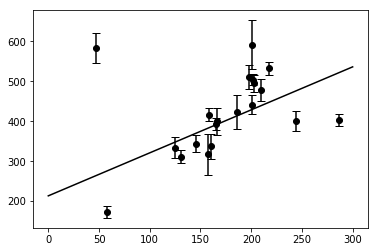

In [132]:
error = Table1[:,3]
plt.errorbar(Table1[:,1], Table1[:,2], yerr=error, fmt='ko',capsize=4)
plt.plot(t4, f(t4), 'k')

In [133]:
N = np.size(Table1[:,0])
x = Table1[:,1]
yerr = Table1[:,3]
y = Table1[:,2]

In [134]:
LSm = 1.0767475241683222
LSb = 213.2734919759614

m_true = 2.2
b_true = 34
#f_true = 0.534     What is this value????????????

PbInitial = 0.2
YbInitial = 400
VbInitial = 60

print(YbInitial,VbInitial)

400 60


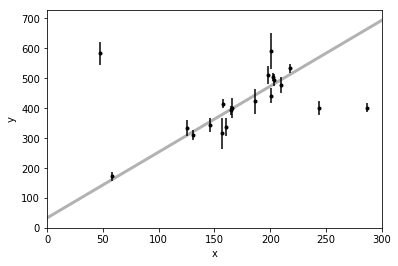

In [135]:
# "true" model

plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
x0 = np.linspace(0, 300, 500)
plt.plot(x0, m_true*x0+b_true, "k", alpha=0.3, lw=3)
plt.xlim(0, 300)
plt.xlabel("x")
plt.ylabel("y");

In [145]:
def log_likelihood(theta, x, y, yerr):
    m, b, Pb, Yb, Vb = theta
    model = m * x + b
    sigma2 = yerr**2
    sigma3 = Vb + yerr**2
    return -0.5*np.sum((1-Pb)*(((y-model)**2)/sigma2) + Pb*(((y-Yb)**2)/sigma3))

#np.log(np.sqrt(2*np.pi*sigma2))     np.log(np.sqrt(2*np.pi*sigma3))

def log_prior(theta):
    m, b, Pb, Yb, Vb = theta
    if 0.0 < m < 5.0 and 0.0 < b < 70.0 and 0.0 < Pb < 1.0 and 0.0 < Vb :
        return 0.0
    return -np.inf

def log_probability(theta, x, y, yerr):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(theta, x, y, yerr)

In [137]:
#from scipy.optimize import minimize
#nll = lambda *args: -log_likelihood(*args)
#initial = np.array([m_true, b_true, PbInitial, YbInitial, VbInitial])
#soln = minimize(nll, initial, args=(x, y, yerr))
#m_ml, b_ml, Pb_ml, Yb_ml, Vb_ml = soln.x

#print("Maximum likelihood estimates:")
#print("m = {0:.3f}".format(m_ml))
#print("b = {0:.3f}".format(b_ml))
#print("Pb = {0:.3f}".format(Pb_ml))
#print("Yb = {0:.3f}".format(Yb_ml))
#print("Vb = {0:.3f}".format(Vb_ml))


#def f(t):
 #   return t*LSm +LSb

#t3 = np.arange(0.0, 300.0, 0.1)
#t4 = np.arange(0.0, 300.0, 0.02)

#plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
#plt.plot(x0, m_true*x0+b_true, "k", alpha=0.3, lw=3, label="truth")
#plt.plot(x0, f(x0), "--k", label="LS")
#plt.plot(x0, np.dot(np.vander(x0, 2), [m_ml, b_ml]), ":k", label="ML")
#plt.legend(fontsize=14)
#plt.xlim(0, 300)
#plt.xlabel("x")
#plt.ylabel("y");

2.2
34.0
0.2
400.0
60.0
2.2000000149011614
34.0
0.2
400.0
60.0
2.2
34.00000001490116
0.2
400.0
60.0
2.2
34.0
0.2000000149011612
400.0
60.0
2.2
34.0
0.2
400.00000001490116
60.0
2.2
34.0
0.2
400.0
60.00000001490116
2.2
34.0
0.2
400.0
60.0
1.2140020004872891
33.997518381520806
0.41886432653022343
400.0001077837572
60.00042600679393
1.2140020004872891
33.997518381520806
0.41886432653022343
400.0001077837572
60.00042600679393
1.2140020153884503
33.997518381520806
0.41886432653022343
400.0001077837572
60.00042600679393
1.2140020004872891
33.99751839642197
0.41886432653022343
400.0001077837572
60.00042600679393
1.2140020004872891
33.997518381520806
0.4188643414313846
400.0001077837572
60.00042600679393
1.2140020004872891
33.997518381520806
0.41886432653022343
400.00010779865835
60.00042600679393
1.2140020004872891
33.997518381520806
0.41886432653022343
400.0001077837572
60.00042602169509
1.9844894189490603
33.99945759013643
0.24783739744417507
400.00002355840496
60.00009311273627
1.9844894189

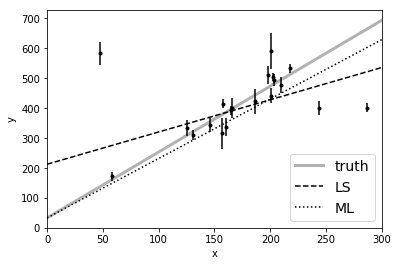

In [138]:
from scipy.optimize import minimize
nll = lambda *args: -log_probability(*args)
initial = np.array([m_true, b_true, PbInitial, YbInitial, VbInitial])
soln = minimize(nll, initial, args=(x, y, yerr))
m_ML, b_ML, Pb_ML, Yb_ML, Vb_ML = soln.x
print(soln)

print("Maximum likelihood estimates:")
print("m = {0:.3f}".format(m_ML))
print("b = {0:.3f}".format(b_ML))
print("Pb = {0:.3f}".format(Pb_ML))
print("Yb = {0:.3f}".format(Yb_ML))
print("Vb = {0:.3f}".format(Vb_ML))

def f(t):
    return t*LSm +LSb

t3 = np.arange(0.0, 300.0, 0.1)
t4 = np.arange(0.0, 300.0, 0.02)

plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
plt.plot(x0, m_true*x0+b_true, "k", alpha=0.3, lw=3, label="truth")
plt.plot(x0, f(x0), "--k", label="LS")
#plt.plot(x0, np.dot(np.vander(x0, 2), [m_ML, b_ML]), ":k", label="ML")
plt.plot(x0, m_ML*x0+b_ML, ":k", label="ML")
plt.legend(fontsize=14)
plt.xlim(0, 300)
plt.xlabel("x")
plt.ylabel("y");

In [139]:
pos = soln.x + 1e-4*np.random.randn(32, 5)
nwalkers, ndim = pos.shape

sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(x, y, yerr))
sampler.run_mcmc(pos, 5000);

1.9845439245197747
33.999684427743055
0.24775132800707916
399.9999305994785
60.000141232167294
1.9845326302164812
33.99945822100821
0.2477822424177695
399.9999814254197
60.00019836814182
1.9841961196250049
33.99942250637897
0.2477131364908167
400.00010271485644
60.00005108512865
1.9846474890023957
33.99957712811516
0.24768951271525766
400.00014143644415
59.999840151236725
1.984535968266243
33.99954010452541
0.24776930252695906
400.00008244286806
59.99992116948608
1.984525691195216
33.99939225379008
0.247735810251903
399.9999676262459
60.00021575055648
1.984696596748827
33.99935257045824
0.24767855218504667
399.9999203568996
60.00016220649487
1.984563857291487
33.99955222568674
0.24786640278038893
400.0002196745575
60.000076852936445
1.9844638169795719
33.999523712255325
0.2477588344016879
399.9999677357525
60.00008907307498
1.9844230168287273
33.999547689260666
0.24759100513909313
400.0001288749928
60.00005179931178
1.984492542853576
33.99956723522154
0.24776151914090816
400.0002014592

400.0005461093156
59.99997647126389
1.978195443198042
33.99767925207244
0.2508194105823595
400.00097861347666
59.99840233960367
1.9729315864984829
34.0030382905635
0.24963968485675767
400.00557245166704
59.99937747133658
1.9810750517123903
34.00134824578302
0.24645026787635507
400.0025547446737
59.99788559309178
1.9817162827054924
33.99581842858378
0.24829655789944594
400.00396996502906
60.00070485278438
1.9794482788898455
33.99826651421186
0.24842818411454326
400.00243819484695
59.99395035613034
1.9610958125832139
33.99358366442686
0.251568171718956
400.0128891532604
59.988083777381256
1.9851890549299689
33.99888066754531
0.24735914005277354
400.0006675646609
60.00211426257659
1.9822524675437703
33.99641053227317
0.25087320865178725
400.00015330459956
60.003584124510304
1.9775050607458573
34.00353864490245
0.24253484096293523
399.9978221855579
59.99922880405055
1.9803118245393958
33.99902102014597
0.2505506221217549
400.00256672896137
59.99711095286619
1.9810976450843407
34.0008658229

0.2614723504069856
399.9662685931786
59.99681683346196
2.0310154734550028
33.99191024892464
0.2563125248368553
399.97259633488204
60.03403351782997
2.0715991062655865
34.01827958318114
0.24085488796893645
399.96336239644796
60.099766065299846
1.9881788272411154
33.99267134000952
0.25723809087693755
400.0111050979516
59.99315980573884
1.9638823073573168
34.00270842222014
0.24368648908378596
400.0016044068415
60.00521110604688
1.8565653750129607
33.96592517347562
0.28216829025104473
400.0649610784076
60.00696675063269
1.829889596055115
33.997270167883286
0.27574140145631876
400.0088781451323
59.81261329352544
1.9336048921265045
33.9834745383857
0.2458402774881649
400.0187382309932
59.97588013232797
1.9783153218799825
33.96379189026896
0.2852173312915318
400.0600837696385
59.956496035696304
1.9757950633218757
33.95750235923733
0.2847959834162394
400.03351375834194
59.99016393133421
1.9453589023449047
33.98330980206261
0.25297431131793746
400.0315157133296
60.005027918097504
2.024450741338

2.072875028215609
33.96938076500144
0.27991920530329717
399.9751127073422
60.077833986685924
2.0715844593930046
33.99615965276297
0.24121289652903846
399.90496083898677
60.114936979326735
2.0580195826421925
33.99514728425073
0.23996220654539907
399.89198113775984
59.99337824238404
2.004395726955454
33.994633510840444
0.28214595632339134
399.97800770409174
60.00805672916357
2.0712776385090934
34.05844836862991
0.2027289272652635
399.963590429864
59.96189895434078
1.9800639994379645
33.959268528521065
0.3093067940087813
399.99382872557413
60.06395801585794
2.0133591270230378
33.99945524260304
0.25175452451009034
400.0045325797348
60.03675399419788
2.1114564390268127
33.9818173467068
0.278361251564557
399.85940052219934
60.100976449586916
2.064520807992814
34.02871881374076
0.20387686428334814
399.8380994783181
60.097029558648025
2.1464474556327344
33.9753214673784
0.2698509680965208
399.97788584556776
60.1069623728099
2.0617312058892034
33.981900405924556
0.28744134483811645
399.95655668

1.9460977525326983
33.9552649023967
0.29171136163761346
400.0941158155562
60.034599928551515
1.9634603478278991
33.99648021636252
0.24422019165747932
399.975249005874
59.94190730975481
1.9580906630132087
34.0120774226642
0.26221753001681053
400.03614555822423
59.85493222371392
1.9853675679871958
33.93972264847117
0.2761578635849087
399.9567310608699
59.99706648442301
2.0154327726696155
33.94835069550794
0.2990426666966729
399.99683506824766
60.041283137383346
2.0171374891076383
33.955485186512696
0.27566661068816184
400.00528744804944
60.05280858403349
2.0187485777353404
33.95136679855927
0.3139901094975258
399.9769059645808
60.03784374522612
2.0785290937718335
33.931691480196406
0.360092639097683
399.99690236176843
60.04032183066923
2.012520226881915
34.09451869757054
0.16686894500607188
400.42180353680175
59.936426088520975
2.0486401010366344
33.964337256225285
0.3106737826272329
399.9014458167509
60.07310837759573
1.9915165160305945
33.932486791372234
0.3205286850394067
400.11360016

400.06438579473485
60.263218656594425
2.1275313773449125
33.87847136430309
0.3752187039259688
400.3227535159153
59.964328508124886
1.8033064406071564
34.079408379571504
0.33241500326564527
400.4033381270983
59.92762291726357
1.912147574624388
33.053941527395125
0.8140412881671981
401.8230576872458
62.263979959136165
1.967760245035705
33.951760434664045
0.6005563840962113
400.21490277680005
59.269399460122465
1.9594635612988645
33.96029934064958
0.2965516885811048
400.20444818556996
60.03612437261959
1.8930734069708413
33.87730435417124
0.36814228393789694
400.4043992273396
60.34749183831428
1.8789025014300087
33.6349496023399
0.4666438037700979
400.2625255278197
60.36835046541061
1.9846435489738423
33.92696074096535
0.29667710930649804
400.15957455687163
60.39856262374262
1.88474088900462
33.89041976233502
0.27452087138013015
400.1876700974784
59.82441318003396
1.9206325413041938
33.61396114124289
0.5430072792506551
400.05819766546966
59.99092989599723
1.9353411377549243
33.92729300252

0.20498944054460635
399.8238043083649
60.167865633510196
1.92242312602293
33.957850135768346
0.43466667756679794
400.40034609059154
60.209249116611694
1.8935827335177042
32.92082534467899
0.9267157486464507
402.0183114557487
62.11177761275534
1.867471322222605
34.07280420410879
0.7934109829831963
399.83875143220797
57.46800929414275
1.9307282764053915
33.956084536119356
0.2846633253625209
400.1121073659526
59.94196731561296
2.0202841343861433
34.44336733298741
0.1394121896293744
400.16587055779974
60.111553196749334
2.016140470385253
34.11799037993369
0.13255491790714252
399.94660287929554
60.51574759068698
1.6930778002026052
32.93902674695517
0.7133888915623704
399.3022669550721
59.88378986261372
1.8992919587101755
32.53232314964506
0.3201812314472646
400.3532271966352
64.24275940409643
2.3853911594717316
33.807788121647626
0.9774151486567134
400.7751901559114
60.51961987216288
1.9540293408539826
34.42923003482401
0.19948711710225836
398.70499895382414
57.627591404620766
1.98862220900

58.69167343487847
1.5707300124224355
31.533868226554063
0.9251192736611896
401.40793723404823
62.86097547913953
2.383027340911578
32.706817134688464
0.9828065708840535
402.9742897505267
64.64055698543321
2.1525185715365547
32.44717229025982
0.955084008734139
397.97202910368236
60.01010924596709
1.9534454291901233
33.57601986402402
0.9584941267539445
402.4253096279391
61.249620060982544
2.6095200828024128
34.789321061899884
0.9922452011871995
401.48256026436053
58.665202513539626
1.9096008288221822
32.89418569660365
0.9108295266566332
402.652283179411
63.20821306040207
2.142727887770121
31.022490592006413
0.921857048204368
400.38781818763186
70.03204109005542
1.9770489451771749
27.62385400010712
0.9989976271687767
407.1350934310084
80.72860783816304
2.0394017450370034
32.904977067425925
0.952972684563906
403.6513741824915
63.56555030128022
2.057351571312954
31.859804176769433
0.8892745487331487
402.5016498073998
67.01356910630997
1.9018997196804805
32.66698911796272
0.8453713988473313
4

1.8853345416325282
34.63824934594389
0.8554939240500383
399.77823223057766
51.28172584359302
2.2848591518859496
33.788849912528676
0.9720140229875924
401.1832559415684
60.41716213604194
2.06461007278329
33.32689750213409
0.9805226875660313
398.20225604747264
58.981141186443864
1.944938663213507
32.35419630492244
0.8651815645494249
408.1330817591792
70.10518232995052
2.1315785404848744
31.032656325395717
0.9739645290017624
404.2165316074953
68.73776072636284
1.8919823551833488
32.44344081897343
0.9890963386600082
402.45245200595093
65.09231509159288
1.9381694739618158
32.84691230008108
0.8820724815664674
402.85661974527915
63.46590202753304
1.8260271962823464
32.24853934572622
0.941552580843098
401.1539353944896
64.76294345873204
2.0322567706391856
25.682056427908122
0.9113232111414236
402.5928269758181
95.26226573462642
2.2304469364911363
29.91831091461335
0.8630612599470765
413.57626152985614
83.8248800096577
2.0513927240659746
30.93507915232907
0.7433042388464585
412.2457559687559
80

32.23439244674694
0.727638512796257
403.43507588866856
71.85319242080709
1.8793719055341938
25.133015416608178
0.9429607510124662
406.2189290121282
82.35510671719379
2.0583240857998524
30.164077274602466
0.8061867497706999
410.034495166645
85.25571182382241
1.9830495335147427
24.131689734095914
0.7721694708387297
408.5743768109167
107.60947187236295
1.6157982951997059
22.682238624724246
0.973632761983638
397.7814780424668
95.1406218103218
1.566154005339737
25.816360962056866
0.990319275163381
407.61462417975326
88.8754916972793
1.957620151037645
27.013272084508216
0.8715759850841206
408.12223773523476
90.02834072870513
1.889331118866741
29.30246355383016
0.9898203346139232
408.1563063110281
77.78882714141211
2.0460771082094324
24.291937875720087
0.8369438456470941
411.4933337536437
113.21177376419485
2.031803196899391
26.3765360035862
0.9209627275719545
402.654718249419
85.25521226925538
1.8487509496711085
29.119735775643306
0.9926341262916527
395.72806004869204
67.6330072893592
1.9261

398.11716193455766
109.22491378124198
1.9838976854758865
28.687484027139938
0.8529787965960671
409.5716077401772
89.6043510100483
2.1616612340989176
15.88602503581262
0.8827164574797614
395.89268018363623
126.1971691229239
1.9698690956714784
27.113248982020213
0.9503348318788257
402.93071109024845
86.59361418366439
2.0450824150099756
14.109113565896124
0.9567072862254733
395.7541513553667
138.0740623613399
1.847651580811884
21.23723741989098
0.8175992107245542
397.4691134191505
102.17302662964438
1.9844273191971928
18.245739596259217
0.9291289099243984
398.9705765499961
110.4244224130284
2.0524804255898514
40.52467219786515
0.7223582877504947
419.62098067212156
65.179939849187
2.066555513395675
29.818404272285797
0.7219000698098932
418.4597360473984
89.42814932836731
1.8550777823665021
17.822072370754853
0.9053711344698294
403.1229750289487
121.48614911179484
1.7432829343049758
26.527079243455816
0.9726679706047371
407.09636587732905
82.31028791779372
2.1121250035004637
39.703008860743

2.0544720477645395
11.998248413042635
0.9389503268662607
392.8412245595273
140.77849511094504
1.8533766993366951
33.6364186190447
0.9027312651525378
428.522911295528
98.71262044660591
2.0091184886906923
22.644099925606433
0.9672142107217989
436.19958862933925
148.8124386769698
2.168183168977567
3.5431482966124044
0.8309337839851016
394.3939716563043
179.25499392114727
1.945765071336032
21.81625935193599
0.8511174512977971
394.85795163627967
106.71431761911522
2.0327867404184863
13.095506996536681
0.9373714174707906
396.8949773219994
142.41011124443705
2.2349436207215967
12.416729523455341
0.9596937173981448
391.62830967716144
143.37722571140677
2.4170914361633575
15.959907036646756
0.940992746558301
401.3833024927678
152.3034356187694
1.7715895919025346
11.380908959215853
0.9620542452313463
397.0493802749734
141.249349568195
2.1451402290960377
7.368747089345762
0.975307819622885
385.2306722017622
159.90957443130986
1.935707261219949
6.583982108315166
0.9571389912588992
399.118213999819

6.069064068585796
0.8721583505114661
387.983397350556
164.24716214158383
1.8582153156549475
12.928144992525134
0.9303669864656589
401.45392582858074
150.86715076384746
1.6592977530260082
11.219203018455122
0.8438696479006994
420.4718670420523
147.24452720636768
2.2026846579099844
7.661763908907779
0.9665876066148075
389.4289765444694
153.84354809890573
2.72467191585785
17.40437044456193
0.9660336359282815
397.54006627698084
179.81288778482775
1.7156112986959018
9.492852387687183
0.9794023412441015
403.22121356432103
147.6787656488263
2.69351953265309
5.482352449123859
0.9933877513074416
379.38612944336563
193.06709853094577
2.4799140230503802
2.5913003263561825
0.9327272054237221
392.21210324513794
150.64160109722826
2.0747859258383596
8.559160008256782
0.8306873546731689
410.2575828645523
196.37808431299774
2.186664556482623
19.96948598338973
0.966181246636173
390.7630552971984
209.6023151679303
2.1973787890997416
12.471770126660326
0.9313558702859296
400.71716340829454
157.5496146667

1.8856492064650388
0.9948859327830868
405.3897389798234
162.73063602891375
1.6354916949288536
2.12339370671358
0.9474324516939034
408.45052574863377
182.83206262990817
1.85350881608157
16.461094026408126
0.9276120822292826
417.3729793941847
197.03409814542448
2.236613660248169
31.23936004741308
0.989553823783618
384.8562079053763
230.74893426882775
1.9251034278619694
30.81763837811002
0.9601444673541898
416.10914678351105
194.96352521153597
1.8768950113009661
5.471439791937861
0.9925312323287985
409.0153436801623
203.62515196039897
2.1376013346941103
10.723537651227023
0.9880553656251768
401.1701372361885
180.0627038909763
2.163209781058104
20.77169607807935
0.9665087246034793
395.5614228838722
167.68028024053092
1.688046896704607
10.462373322831958
0.9980956848127004
416.8588700920614
164.5192679191411
2.0425339993517038
5.8502731173920335
0.9629278815243102
390.6200341238117
182.7323119619435
2.300760174698828
16.231977350888396
0.9842831768055598
412.85186183222805
178.7401615585097

191.39408515154472
1.8746605583988916
16.935935873429138
0.9593064437737904
401.6927823525831
212.124041841824
2.080684162772587
19.0984274153111
0.9710088325258488
411.43485519465236
199.31551812860886
1.8382480891067559
7.77018041953265
0.9846406785498325
406.82238310483444
190.75641583591621
1.954877105355183
21.507166989600307
0.9436972498589177
406.05347036350673
195.1172619213766
1.8941025018410642
13.266325242056313
0.9799080542640597
403.1833755454506
203.38775933262886
1.9640982980093569
8.51704622780673
0.9857993396988131
397.3316983050887
211.81842404926965
1.5645806022079038
0.07992678870941017
0.988736047568514
419.57468395155735
216.33265110093797
1.544437626089885
21.542138010911557
0.9854921224144658
417.53903379868706
218.67863838560288
1.678449977605283
10.803904824834097
0.9959997020010988
407.5022672982627
189.27977022183154
1.5381360692211525
23.54274056513598
0.9528463563621709
410.80727034733417
259.8071898228263
1.8657481206829598
9.262254987451097
0.96892749390

28.78000475530674
0.9992314514242732
403.993661698141
269.925754287707
1.2814818096504115
39.81178450480836
0.9953739077809121
407.8129383941733
274.0938582798999
1.7772739700643796
14.4067649373299
0.9835252412363558
420.56001236628236
244.11614731805307
1.1331676874240264
61.697127081641156
0.9905898826854894
393.0414749516342
337.37587938019436
2.252848771055055
47.38811111944147
0.9708811483625229
392.0963656792115
205.10570711646773
1.2444684442833083
16.725466730848844
0.9911381697780816
415.6648166636849
286.589719183706
1.8446383650967697
9.2344904247978
0.9940083750299168
403.83522130027166
236.8998188740588
2.116896717387091
23.726187334900978
0.9723274506116091
402.83500593527503
254.94640631833704
1.8572175964158328
30.56202669452014
0.9823696917494124
418.62231880722396
301.30859201764275
0.9465185857096861
52.25891623115649
0.9756898400814049
416.7071933753558
389.4155086973135
1.662697171578251
31.072440513859558
0.9595353725920839
402.4043029654936
287.82348914326394
1.

354.5401811668518
0.44128011488465035
16.134738404312433
0.9990338986014402
423.35647936998276
360.84009704969185
1.4440427905308633
18.97644402467394
0.9841947361671805
411.089904993647
298.75061060766495
1.0314376212073826
37.3455185483963
0.9910658075521617
410.6084199177567
372.81364095263
2.3295309820868457
33.387617562044994
0.915872076917869
413.0371359495196
260.04166696322136
0.9363211246288359
20.335131989931565
0.9929507593808712
417.2894783100469
336.9315917324964
1.9420182490947377
9.006546954819504
0.9962231297696016
415.63756780023664
274.592620858686
1.4998992300073992
26.939543230672907
0.9827753954516755
405.8726946557002
302.4537955033781
2.5833807741411494
45.88298143143422
0.8912276168070637
409.6098212515403
336.0936036638672
0.9343128576964093
17.8289810840097
0.9980729545763855
404.2661299154995
370.2413660590702
1.2211316131948613
41.548874578454516
0.9895031623709313
409.94035304059645
323.3728999332078
1.1798951552681292
66.676728162906
0.9895028699757558
393

413.10243529822367
362.3924599651231
1.8039240457859154
49.20351849362594
0.9294503441010198
406.95428398939987
311.0667706709958
0.3485400161742582
26.216352748204855
0.9972899802898139
422.959968113955
421.33697920277524
0.857688017463145
40.771362141291306
0.9987990986260472
403.34227527611245
348.8700788918079
2.1786809439428465
7.576553345869602
0.9981649080984363
402.5596261189543
225.22802165180138
1.9619548627742063
18.943155599467083
0.9520005348834374
408.7807706612045
331.7806147999092
0.5470967120080196
3.2208445159809145
0.9999051964678151
410.8328042240977
407.81211458164006
0.750464446918303
54.32361348763104
0.9927749723026198
399.94394102351566
379.2768429720053
1.8033244622899627
20.260024804231538
0.9905460370968456
407.80592979327406
310.31324352363333
0.8486380843094237
15.22836899553878
0.996486522417005
414.606207695283
387.8218063256546
2.1959400281189954
19.310445828374913
0.9829021115144569
400.2435651694891
284.68337165502027
0.7244865004650178
45.58942374844

0.5614485490452576
53.68053324775898
0.9965394688001004
414.23388257800775
425.473501158329
0.6999904553515125
25.096657812036923
0.9993260334496076
419.23455632570176
371.2056875032965
0.5246870829700407
33.66423085834995
0.9961945536570948
403.9311740644406
440.4890642381585
0.11624748136562993
53.85782861974238
0.9993226508422022
407.6156841223505
377.5341535770021
1.5642804783942126
14.575119452445037
0.9789185512168407
399.6430405958979
365.19503661220335
3.007219982038519
49.042879751082225
0.9740157925101491
431.48388351053086
326.3720383685428
1.4383199549627077
15.422240961125073
0.981079965824538
403.80398947531927
343.27778004439944
0.5137847660235182
42.36926587803283
0.9986236182863395
410.95541901418505
385.68165398803563
1.2933217568948925
27.705338268957714
0.9673785878508606
406.27275827950183
392.7863771447488
1.292195870532528
41.337854248363456
0.9992356316125157
406.0233462935401
333.0270017744784
1.0311459882224248
21.94926054869689
0.9766097786911052
421.65189324

1.9931100577540206
4.490359147381518
0.9880177659777986
395.11525302177995
380.6089683757525
0.6486722600186983
19.149018699643868
0.9950151294187748
413.4854743124359
381.459467641948
0.9561154698933474
31.115687205138283
0.9966293504305733
405.6547719486067
422.3254061159771
0.3367943592935526
22.955996157618383
0.9999445243990659
430.5893934902822
418.2148612465198
1.1312645890648296
30.763481156718093
0.9872541768235423
416.6977523860853
416.6927906959236
0.8412048988555658
51.489547341061986
0.9765436662834601
410.19854350055806
370.65404209431443
0.7740960185244687
44.54280749328073
0.9957696688286856
407.1956197119819
446.32572422297517
1.515625134759819
39.09047710426682
0.9674704584358204
411.28517768775987
374.47435048656445
0.8860571689161676
7.1870213879781915
0.9994054215494234
407.74431994287085
464.1168205977692
0.9645837980112092
31.32223015150495
0.9945961030016491
399.44134449270683
439.28026649027004
0.09006821549851474
31.226732457530055
0.9987335455190159
420.32980

0.9831892743419519
26.97680541356494
0.9884935660225607
425.0305248938399
461.2195965314335
1.8659185647502954
32.05442383362309
0.9892429556824268
407.5845889208108
440.7092089828178
1.677526563422768
34.936242571355066
0.9788662114656217
401.39511051816373
469.28866269030675
2.158928810332013
57.15637851441657
0.9722299400675062
366.49095931249025
842.0678663841297
1.6354465723239922
34.21134344358748
0.9769861260306087
411.41772627816346
475.4977921453322
0.8938741816745444
6.668852928556381
0.9919474476390016
398.07721140495295
484.1876190803033
0.6726590462245714
62.82133542267682
0.9966820062593155
402.0127559365342
573.0872415002569
0.5455444100894684
62.25694661329689
0.99548210073538
414.9191257076735
513.0243987272303
0.6443462580485955
31.118422265264762
0.996875917598432
418.0635858767676
422.29009575799864
1.4463828915495733
54.16987593656463
0.9182360609291409
392.1687713589918
525.4554554170307
0.4583400230030783
49.044141886877
0.9931027474763486
420.36299059725604
534.

27.546678578285718
0.992811309681751
402.37220460182783
512.607788805163
0.713243173237693
68.7990939715788
0.9971828268537503
404.8990927972624
695.7297442115843
1.5348482351280441
17.13763733894707
0.9933426809759786
407.2735152586039
554.3568520121423
0.6149427607201778
57.54666237964112
0.9998231303440793
401.8000675086804
572.2044770677763
1.0653336023472013
42.20076911008787
0.9920988305740912
394.1720834761334
610.7386318780955
0.5577245150061858
66.51076335966644
0.9893007647893822
400.0086208278349
761.6379999815157
0.6226308567273814
53.949585714842684
0.9964287900169548
419.9606072851801
567.6862668697174
0.596913944947018
51.162889766033075
0.9978965414391485
410.8666588491702
548.0575656498431
1.7086283377280331
39.10206788785044
0.9834450853081159
386.4231818395063
445.9260315057138
0.30608610114277274
57.166733255886925
0.999603670140549
353.37859973582147
785.041647076029
1.4065548633722447
63.23862817031216
0.983399128482305
402.3492502691204
522.6408691835098
0.727683

616.6394690037765
0.43991346154744304
63.32777293351354
0.9987581521384233
388.89342398023314
633.9113947660937
1.7487498114973408
44.550319357997715
0.9739691961847692
407.3319827476084
533.0239543574861
0.7138381272701532
42.4092534880144
0.9955174428917855
416.7831769201208
584.0571285825024
1.8789174942005396
45.58528870334963
0.9856114280234606
421.57096025500164
556.5685196859308
1.6125746682742745
29.54079470105379
0.9917771125237187
397.39461168875863
666.0715472234021
2.674355186980967
52.22957675311007
0.9654691387952722
393.27486763232844
662.1807105723417
1.819039080889599
47.72121302654876
0.9773856949517457
369.9170858171011
847.6887719376671
1.897690525533854
45.902605146696786
0.9769095872518623
401.0228656396002
547.5922177077921
0.9564727608025707
32.042586197959274
0.9966399200560692
404.37326729741255
610.0311006396128
1.652592856330044
0.5130154201184922
0.9856895517641352
404.5751855461273
522.1256884122834
1.1328411194605033
61.883909140436884
0.9956184483460682


54.797405487420924
0.9917444527644059
404.1925251837902
601.8927747597131
0.9906864202879857
52.62737425306032
0.9914676270865412
388.93299102059433
717.2459848704202
0.4616770258517129
52.26506682383851
0.9963260993455673
399.8989610293258
659.154080265669
0.6113781579927842
33.390540783410785
0.9986440871839635
418.9198915734341
658.2479779266405
0.822303791638452
58.692243573761644
0.9937960468166916
412.2063340157517
664.2087159319319
1.2162014865400743
18.945153430919625
0.9893461567930628
381.3246668561241
1165.4729443719548
1.0829721893201585
67.76093192816748
0.9972997961592559
401.4675377622939
677.5494845720325
1.1175995486278931
54.38237643493876
0.9629854474593313
406.78771155422504
518.162805273092
1.7457370920797857
69.3903078838446
0.9929683357974564
397.286571563696
494.5273115789822
1.8753440224451037
46.93799105535007
0.9825577430675113
386.91229735779984
718.4622601022223
1.992423481196435
13.735730985366303
0.9889559297134287
395.50377022303303
696.7675479523966
0.9

54.983762307372785
0.9840525289712218
392.58929398713775
816.3573805032066
2.087321562831951
49.36796635546344
0.9851462528113861
368.80606069040994
1152.730752545172
1.1982508753381498
66.1852348600727
0.9954691044141102
413.70283064620924
669.371864004336
1.750482060790018
59.8686355974873
0.9852183409453544
398.7273354250913
844.80436737781
1.7113537619792882
46.563935328137966
0.9814787939791882
399.7496596951458
900.4149805770015
0.26300414616051104
67.78665565179223
0.9973431890897245
407.46574092942035
652.5554517253738
1.147369037766711
61.30448856356795
0.989790666517447
399.10879655098955
879.4004054873972
2.3258882319563785
32.81221842076435
0.9978901114254425
413.0374363097862
899.9473932807789
2.1727284659052093
55.09248428012829
0.9274926074177176
420.4655295003879
981.499377566606
2.169976029467258
45.195183295495966
0.9959376370248048
399.35542532539426
940.5027076698649
1.2781524609988744
61.294222689820856
0.9924271842687541
399.23854317698806
755.0211424460541
1.1933

51.44030042068945
0.9983727843739784
396.3540086671757
930.7095148878989
1.8072464644425
40.19876682536244
0.9881684449963251
388.6048402792391
1140.737277730922
3.006118223055172
29.943830318010583
0.9979136246691932
402.82348074779844
1074.3018215520592
2.0114773018675116
42.37184112422752
0.9755293042787571
398.4689505118135
1163.705081190359
1.7956072259858202
65.04647152404056
0.9764015108537427
385.10852440008813
1022.1860808300528
2.2079169339988036
43.17292393422111
0.9899834443770336
391.1762212043375
1123.1003385042588
1.962574400047433
49.73240920622932
0.994153931938729
384.2368861901336
1122.5844229892296
1.822428548316373
42.154273570725486
0.9947758609158392
394.51592327821163
1137.3199899575484
1.7387735931474657
57.83202580129424
0.9695497080197755
406.3778633502294
906.1363839660739
1.6087186688329074
45.71097612570175
0.9924026786258147
385.7605872356076
1051.2175362031098
2.3272349432914474
56.10385337313437
0.9975434989384483
363.8373873863896
1291.3394573987514
2.

50.59506716169384
0.9864572523261937
390.21072982894714
1057.4488541188823
2.095554006229978
26.55990461803172
0.9899674435202503
393.90899748031654
1271.6269736122622
2.458129804165392
27.477959725334156
0.9964580765895368
373.3962632398272
1554.1922547816955
2.0678367423915307
40.06568382770207
0.9968332710195448
396.62363025150466
1300.6545077996175
1.9637886081422558
29.061873656004774
0.9819161970289976
396.83670819896014
1481.813898494202
2.0604837941719527
25.24389436465023
0.9994019499918538
383.30206182663056
1267.1173130244492
1.8695619312031297
30.603701848624944
0.9967841095248384
389.1931671935553
1242.8678431372377
2.3898217798200263
27.864900816539233
0.9954030967412372
372.2117852718047
1496.8833192249758
2.5653019848315286
33.88777761917832
0.9943648549985901
380.07758821013624
1540.8474564196245
1.7264305345865745
26.109766469226678
0.9938160242307706
392.0303809661529
1127.4913504449494
1.9415102854224644
33.91345197526182
0.9927469426664753
364.00152351106277
1591.4

3.8978385285559165
5.854315366633627
0.995191088521185
381.4068223424134
2051.206693150541
1.930750912119029
8.36257247917733
0.9851024421476161
377.86103266253053
1733.3075809849263
2.1797253583446987
40.66291333401851
0.9933980535011274
386.9325611052015
1482.5256441079612
1.9851234616065558
40.60063794547953
0.9499198287056815
396.205695528619
1722.2909329849067
1.6609882829734501
43.008299530743685
0.9903519413671512
392.26468787264764
1549.095231798751
2.485521919411209
45.87603133096941
0.9882909589721777
343.45317491264984
2656.233728287939
1.8625451187545174
16.627155816462604
0.9949771415239902
413.76478760609376
1401.4407160682445
2.8870686437300934
40.38017848546894
0.9968083912118617
361.18676282476775
1854.4704246765698
1.521896082899816
25.88745815712434
0.9747273576505195
442.8283538229485
1229.8333368897204
2.246065822787318
21.48210675591765
0.9877263130045215
380.2148675350138
1664.3161866431026
2.6801777628531314
32.373731513666186
0.9729656877305898
411.389206577536

2146.9649012561463
2.5313489567190075
34.87359503187235
0.9960778848806392
363.08437120848396
1937.7468024924074
2.28793491643436
22.37973183748059
0.9893228077926337
406.4796928997529
1215.8967388228043
0.735900166695544
13.623741110196457
0.9369611788452699
439.55668943554264
2491.93722283223
2.0769894429571982
18.12361007206559
0.9846823188407867
405.06521467244266
1907.7609368982028
2.87178099486351
1.849026356404302
0.9949755411513157
376.6926905458903
1740.6403493596315
1.9150771001581772
10.959233295821535
0.9670307641134833
398.62119715678745
2030.6296771883908
2.0017772907707982
25.785233868737848
0.9806313548852691
394.48823242478704
1854.7663405276446
2.35652768128026
19.503984173733834
0.9828227204241419
372.2453376788342
1439.2446232865666
2.073317533587666
25.587574678393576
0.9854945664374422
395.8427400925238
1915.7695325738396
2.0771303397959784
18.506047140381327
0.9974359888330886
405.58459455234276
1437.3356103226927
1.7997226069091115
33.28565568192484
0.9879472197

0.917103732879319
444.5490649220797
1846.1070113573153
1.8790589745856998
56.58227104895998
0.9782865438264231
433.31471835902397
2631.0674448966365
1.9846641057359646
45.85542013412429
0.9824404171029877
405.5537837993194
1859.371132609411
1.4269968250440936
2.614537999317201
0.9913793345600435
398.17514834096824
2159.4619031868056
1.9221456472132858
18.11875163836377
0.9774136586125214
386.9834968009445
2270.4945767975832
1.7785727174254449
39.786149244875546
0.9769403745296404
388.7997925977748
1932.401612660789
2.0213995320618054
7.547545727702444
0.9621078123700937
406.740930119023
2103.3719842441114
2.237790598072382
13.486104415090235
0.9961670823815238
383.0498494328216
1907.8255280703659
1.9038252252994539
11.972259587006846
0.9707430274172213
395.59096662370774
2100.422077286762
2.07960486546969
8.24259982448504
0.982233277890511
389.0556634343785
2046.198102326053
2.0130597922187805
40.82830127395323
0.9835046836778375
390.05155592186105
2350.2436857522734
2.0776500728150933

2359.7284183295496
2.160808100633186
24.904803653605498
0.9713641259396593
393.8293872098965
2919.3086310855588
1.2235483920552015
66.77774265492538
0.9948223257649094
406.2435302682277
1879.724434260812
2.032458719880492
45.1499478488243
0.9868828899359215
396.1538372076359
2726.1515803710736
1.823868582959774
62.749126783844176
0.9561352189991169
380.0133057160481
2933.4827244319786
2.0042816742176752
39.64399391857443
0.9897066963959094
408.8687443176384
2345.90391513434
1.5109719957300793
8.295017111888658
0.9909779592672289
399.3576919789094
1810.541215679947
1.5556464367275924
48.879475873010115
0.9799606978754002
395.84638992245715
1805.6772531450822
1.068503729256318
56.975312329120506
0.9997890406953475
457.3248755724922
2815.0131759926007
1.5884812920785025
50.24104372234296
0.9840106896543177
413.7678223332938
2462.634878034015
2.250945986542866
37.73756511137881
0.9474404814983776
394.4675701153893
2983.022751412226
1.4348404996928958
52.357035746127785
0.9729851224825029
3

2.0178520949113974
27.867240122202066
0.9834186571174839
392.6468358675521
3636.8033662158405
1.4113346155075541
41.65897289374469
0.9947126517910458
406.26891312350597
2266.6158578098857
1.9629365821083806
47.16179027132145
0.98555747820746
415.18663958341114
2830.676344291065
1.615554902563138
43.971439032227245
0.9606744238369049
393.09789916110736
3153.6888164868715
1.8249644782015344
45.8382953649649
0.9967559841791147
410.6186939390039
2519.207559820968
2.166132345566739
31.488634157999527
0.9884421118916327
404.5900271008908
2353.232987334248
1.905583751613815
32.675776006796035
0.9582286439799154
383.74403766310456
2117.4085316942305
2.1142674958378396
51.52651427945247
0.9980803270039087
438.51972357473886
3801.1595047198552
0.6530390590169541
17.581409371933177
0.9996868789193918
398.94849560187834
3665.085128508199
2.586182889646496
54.2078132885011
0.9425077756478013
396.3787767244902
2723.8962311107334
2.431001743756989
33.49351832828352
0.990328075944628
422.2677322409859

1.830727363021053
44.7509461978429
0.9949281242431345
400.4505530762545
3416.4133285130483
2.174963419603429
42.84729053281681
0.9834348285048115
395.66936452358055
3607.8882465766546
1.8033661029908652
30.146524191796754
0.9878654660525077
373.91173545402233
6002.359735226456
2.2968660331687274
37.928675127849935
0.990196171029905
403.79294092449106
4278.506151902393
2.9560102281957112
12.280337069426274
0.9983441062351933
428.07681281318594
6126.087802792702
1.3165668938685924
44.27867810611713
0.9962250092414427
405.6264897346697
2772.7003483202157
2.768833870659951
35.19929388265774
0.9965685993479313
426.66060783945403
4092.7567673810977
1.6250730684515386
61.2219523097664
0.9760110317763594
332.75796578083157
4105.404082338878
1.8423597143313346
58.18748908261087
0.9850471229803144
413.708470512094
3082.2894137325047
2.0592250302337956
35.23359968792037
0.9826350751321431
406.26119393445055
9579.618783957205
2.8611961550086535
41.40450119080734
0.9869916425110629
403.631797248695

384.82339355612874
6626.031853126928
2.1309182096191686
67.18486506207854
0.979804818697063
430.23916990067625
17906.897258650293
1.6945542077201674
26.508354234139375
0.9881971302740312
395.0963498749889
5581.0437951585645
3.414145558800205
26.632369503341067
0.9941210119671745
436.22981460023567
5033.941995665614
2.3405907249271847
23.468418156584445
0.9883400524553597
402.44083251876475
5384.044366903087
2.7741566497184342
10.528028027260184
0.9932619301691105
404.9961546603244
7442.3448156144395
2.84535770878116
0.28366594061931494
0.9906261019741479
404.8298077805782
2284.089718577561
2.2363777952967707
42.7790998699897
0.9975262544488461
439.77471641771257
9703.938375332487
3.985794925352902
49.45399629259535
0.9980629117042766
438.5356933396312
5589.007812471402
2.4450971129466534
18.471690945321136
0.9915156200022764
405.61122675818217
5394.237944959714
2.271835450622768
24.922484882704442
0.9886443885577604
404.25555965960945
8015.878663367932
2.4455047995669954
56.71329116930

2.1913386700016266
61.37517303003278
0.9792666175628998
414.0529627445199
9503.15097979545
2.1802813944249477
16.67763485680947
0.9957340409065459
401.4286737807807
7903.818727891228
2.077414884230089
17.8647620972161
0.9952366414098868
416.0979627895517
7748.197241574157
2.6076804737562096
17.026649298821653
0.9964171286014933
410.80424238790795
11199.854373668828
1.03390547787127
38.0632936537919
0.9893919329436195
386.6899883808087
4740.715460995875
3.8259796957435137
21.92347466774001
0.9800445685570783
383.1491827762331
11.413042141019105
2.1433973553128913
68.33042921273865
0.9844186569098308
434.56598112063057
17061.557689946756
2.536620736999843
45.788147319285706
0.9857754213681443
412.52989201876267
8161.326382803782
2.067483193592075
46.00446009343326
0.991932072805864
431.5876164613824
11686.234234489422
2.787248892646809
32.87704074640452
0.9952119649937115
423.73549980059437
8237.966408832017
2.748884650763814
11.836712094875928
0.9938623635490432
411.76577495119625
7243.

0.47216956807330845
0.9999342593553632
428.18930525491567
13795.51668344448
4.78663643999059
65.29687337012834
0.992203944589267
394.56797460718144
7154.022707910795
2.123961728604053
55.51837135340182
0.9760246248088341
408.7044806610202
8682.774520603904
2.3875204157260086
31.938387262837466
0.9965772203399711
385.51946302026687
13242.538769650122
2.2014783379697245
25.18159880249165
0.9853579348654065
397.41619166290434
10353.344538444486
1.8634232971028433
25.712800066921126
0.9914856703654825
382.374391751751
6667.9288652391315
2.478440667915428
21.784455158042906
0.9952615192164306
420.80498675088023
13681.929441505568
1.4671255530084144
29.974002275516412
0.9988994515964085
426.4511424965625
10990.33596540823
2.220827427721252
41.39521481640574
0.9949137269138264
394.90226885922016
8495.112056168966
1.9304296283357723
31.93265728111105
0.9953051389599277
446.06219451157205
8115.9469588899865
2.2362284203540894
23.66251239744398
0.9908036344475581
403.56050662913856
10044.3706340

2.066821529572928
31.320124300528548
0.9950746593829348
412.8556755005876
9209.210057319231
2.1215329376674554
31.473432115929633
0.98190108409249
434.53413889087653
15944.792369855497
1.8026120436762396
30.4439646166431
0.982893419259822
420.51921744404734
11977.717100638803
1.5549258409897377
7.845301238745069
0.9936451565069757
408.4961812466489
17248.91481513159
1.6007847276672893
39.05982942637576
0.9942972746080726
405.68573208061525
11330.78147824783
1.3921559052100805
46.98913931905962
0.9889413710146198
452.9935633446102
9188.20553289161
1.7692284982933018
10.86758323436197
0.9994488551785871
408.11748173400946
9143.173943886879
2.0403154625565896
46.91179793534951
0.9902713134281879
448.3318521158934
15787.481835878963
2.5294338714507463
33.11364180350344
0.9820747384906353
263.14141407460056
22805.031098285475
1.9013742797765276
69.48128160016617
0.993259479745559
425.7284335349734
13959.916509474671
1.718745965935657
62.01843856421668
0.9911463504971696
435.7126559208286
15

10746.710976515205
2.036636222901575
45.79030510324464
0.9978453230216705
419.62133175506915
15259.722177861606
2.4491853748074077
31.373293601483873
0.9906718558398103
428.33686921701695
12762.290972358058
2.062255438586474
4.732086171039578
0.9886730225854035
476.75264014223245
18562.756063988432
2.875013536509449
0.8507671664215408
0.9956175597873191
193.54192094297198
19978.635069543583
2.102339964073697
22.088090997380917
0.9984899940492192
430.59716401778076
18515.36463600795
2.346788061325633
30.105311651118797
0.997005240373959
427.03692074644835
13451.656746215598
1.4375351931065103
40.03238787726233
0.996425432581259
451.92800289796804
20454.299440666222
2.2710242529493985
13.032132612708407
0.9998260845210667
407.7049983302739
13297.224166223285
1.9255395625800962
44.62768016137224
0.9981296637915168
434.4361093819454
15883.428397366935
1.4697332825757117
42.86909572318947
0.9960424577624584
442.95154315715024
17488.67092393206
1.1912288959913542
30.17980832968106
0.99966327

34.13391965545389
0.9983768846070967
364.89553128276947
15827.709856545052
1.1462211174822015
20.11156068395983
0.9993077177742352
410.27592881690356
17020.1564496741
1.7298634501456438
22.105012950307994
0.9914276721674838
401.6495767028633
14246.736854172841
1.9666463781667471
28.2723596788112
0.9887766551961918
441.22536194500907
14317.311341929011
1.7634611601040744
9.989037216469605
0.990451876787397
383.634024153033
25841.69222682555
1.609603397381022
11.469959660167797
0.9981824773385972
407.32727125918245
16788.028706410234
2.2217639175606427
31.22589343677317
0.994807612781827
437.9478097516778
13533.736265158437
1.307426486321614
39.141651433826524
0.9995800918210265
428.58230334692996
15543.03435426309
1.6535138280648303
41.439892441260994
0.9969413809775494
448.335510770873
13508.492706441571
1.8823269658150714
43.628940271137495
0.9922929253592204
382.40420413011014
16663.40909660019
2.5967587300054333
31.999258100110318
0.9980957175432575
438.7987445664656
17831.087916053

416.5323585384914
23813.409843837835
1.9407904382009746
64.23293360944545
0.9905514862044269
454.0280177324673
12583.644739514213
2.1746722980129674
0.828398650927685
0.995582349975792
301.4336519595977
28183.841528169007
2.233319053195545
40.19194863147523
0.9998832566282138
409.69967530966613
13055.588358579053
1.3122870621086922
23.91731603723539
0.9953668475856892
451.47949933040076
15161.800572953183
1.7449416365858732
30.82058876412392
0.988265373060146
407.5312458313447
17855.46753013438
2.0399299978871652
20.47175142376117
0.9921870827293325
353.462082604447
27696.62125001174
1.3387148509116646
25.09040758043921
0.9994111557787608
426.4093240040778
15593.479335056098
4.008239779081579
50.16304576573568
0.9997410904433432
319.2305318511035
17670.75003544714
1.622020504810978
29.140221943851312
0.9986760367780891
445.9825607644241
19745.645805546927
1.614312292628362
35.99803980825738
0.9987411330711651
424.4879639394162
15374.268697784459
2.108250788328039
34.732754165853734
0.9

435.0361747102673
22563.125110658177
2.783141934863459
6.886844298055247
0.9877638949027349
480.15469503467176
5248.88330948562
2.0094003676682615
64.89011583684365
0.9754074995702389
399.6900841213969
18654.18958164199
1.7804343540063376
23.647783544309597
0.9971128912438976
350.5425354581028
24857.746843732886
1.6302815496200744
54.13283402482944
0.9991656849070794
547.6667208912411
31620.946417009825
1.6481987307703363
8.943077489550259
0.980789053561304
385.0995245326559
26212.58412451708
3.6727092841597546
3.1073243238260826
0.9948659108932703
327.3524353384573
36432.33488186929
1.5376996012884903
41.17392862347907
0.9998896324521941
424.63192800537763
18561.410371824833
3.1748359233818815
56.71384001980422
0.9986738850128604
365.08218238106525
20147.043937269344
2.240919610437927
16.076080844166036
0.9997835818043009
475.4745415509467
25300.028947052502
0.9436339798143825
28.339072622085446
0.9998696432150279
483.4732822520973
25920.631571013022
1.4763211128189548
33.955028373455

2.813596888602392
1.6489299656988077
0.9996205237457638
387.237270495421
18211.06259608119
1.9768331413227416
31.43749599314326
0.9982218216393466
431.2294643891153
24961.975621450718
1.7418443046018612
19.63754822188249
0.9892785512109459
460.8494508865073
6672.207819721634
2.0635083736223407
24.292900522666102
0.9813052401863865
491.58367413280996
24840.823349487597
2.044294113914503
17.64429259008179
0.9941772470358484
342.6565066037687
2852.4794081440414
2.24502877883186
44.87881668861314
0.9984344691261413
469.5526580387796
22566.268070903287
1.86785962941938
34.46009669100124
0.9658755917534702
457.97410061993287
40886.79536510233
1.641676615173865
30.75844618816192
0.999325213676953
380.80918695990067
28828.592214497585
1.737132083327076
57.097378938700146
0.9990447033785048
478.60218091623295
33465.369961927085
1.4947590028360669
43.95318542561466
0.9915476267895317
431.1758133392459
21580.465542036312
1.5227006628063264
38.51623283173529
0.990580866810288
450.5791148467352
172

44.20204402148645
0.9962348923848754
464.651393511964
24795.08690439834
2.301612432254097
7.943579851608707
0.9990562953261186
368.17605884697156
57643.50261437161
1.090889800557207
31.720156942909718
0.9984471550203088
438.0246215676003
19395.712649809986
2.1001157858432764
58.29151225702934
0.9988313211840923
357.22130270258594
23292.53511066139
2.4644498737048575
52.547464782501116
0.9990457388896833
467.6299429756295
21418.672670504624
0.5277458370270511
29.566072827364856
0.9974721965864488
453.18403218129004
21047.697990572764
0.9811555204977167
43.6673197765788
0.9991941305834102
455.75605081904206
50022.04285800076
1.5481328439196993
26.026329684311047
0.9987095330929674
391.47092628058755
52988.59758471725
3.121468822457371
59.8384975918356
0.9988829868150373
331.1669057818947
7919.2584585408
0.9108194395538388
13.377579615898327
0.9984643461331981
385.96443355350647
31838.715039662045
2.064732548489322
46.04711049603799
0.993933423660657
420.8756735650727
25445.3648678241
0.9

18.283618969990368
0.9976173693484636
351.77846344846023
33277.44330329696
1.9703840994477708
47.112223014825446
0.990351507499869
369.93129876803727
25304.335750375838
1.3259512436788903
16.810077190153084
0.9971754711752557
407.5914595737809
51856.68297308533
1.8566343779927037
28.676709805519508
0.9931734310133205
406.5290818144581
40241.19998477085
0.7739569740461552
12.741642746116575
0.9995145989907154
547.7395585234783
108064.91091374482
3.3635333428650136
11.442166547365382
0.9923598787283009
361.8465142786178
84049.66828947442
0.9651075286413884
31.077327347214762
0.9993966696382294
435.5133764766924
29515.725018790945
1.1488353138074887
9.016559524748011
0.9981513086152793
386.89463705153304
93631.35111691628
2.0275017884804654
21.252548796888078
0.9907020326469004
465.8720576452833
28433.896522460047
1.1385891481781596
69.73455748847717
0.9985568559045184
429.7699150810137
67761.78074832578
0.669909366242903
67.02653415576629
0.99837224918435
416.11278215111406
22018.6553284

391.25675315327015
42936.17416798181
0.952506004297127
66.22624927325548
0.9980959672880458
392.54002947536156
92517.28764749324
2.6086034881372657
49.74109012345784
0.9966906827183662
320.51507873081505
9829.910006461767
2.154032139246814
49.96241080783651
0.9997915391622645
407.3435659714986
31352.972452773527
0.6138439225211607
58.44984916073739
0.9994122224350138
413.0252102329131
27456.630943888395
1.5127626309732833
27.254113725001254
0.9969859031232404
391.1855011742066
36144.55514078755
1.506508781409099
52.45779298109523
0.9987113122362179
443.23147641531324
85096.81117818097
1.704431711863833
50.428336849195695
0.9956828936081245
409.7127887423388
51100.06766400936
1.9117496921195491
35.725929998940295
0.9886219644917952
582.1553070471006
100644.2620913586
0.7052676843521792
48.01718690005223
0.9990733292886689
370.397648538297
59069.185876314485
1.7657634453653515
43.134033675797
0.9913681024643505
340.1197509392365
47942.349994983444
1.639630988623513
41.378057558121
0.9960

0.7992991980095405
69.74679332867697
0.9992706540149143
391.37951633052245
153986.74899650458
0.7934079819807631
11.14329061743849
0.9995264620621296
527.0809658389136
85396.2938383464
1.2283161947759589
62.30606703497019
0.9961243112752808
421.56370335903597
35008.36674405247
1.4716402474786814
25.7312052238938
0.9971743941778388
294.1692750612752
336073.43089778314
1.9354867963296423
33.143265059992665
0.9996878012670735
395.3526046148791
59803.34651860928
1.3782629524476548
21.9831377709367
0.9996567405592809
384.6819048380796
76017.76575304127
2.3538862379842724
7.220036194782338
0.9972115256677108
412.79297264855893
39596.57362074734
2.4041970632999363
58.932190342922105
0.9979826058141998
478.85554253128
80645.94436375264
2.0764435322300714
31.695950596286004
0.998782521219685
404.12321609680356
123038.07100275265
1.379056834974425
55.74106420327028
0.9972676528753528
354.42978008905175
89891.62736769102
1.5550824038985618
34.03401036668638
0.9949407106259823
544.0912466730645
96

103557.26633363146
3.041815841545407
1.4485382822058916
0.9971399119611929
104.29427840763032
324388.75527040684
0.30078724578999605
64.75493232687369
0.9995318504970783
356.2475363630008
131882.4253174702
1.7066995636630433
32.267738904562094
0.9966352538858857
325.5138381678092
302040.8293485644
1.5034091541811627
31.18436553123179
0.9984136934379262
392.8867949444117
268943.1458756036
1.9056843021354428
58.27714669421641
0.9881886798103003
223.81224526626585
312609.9531838828
1.7886128658299647
11.809870162048403
0.9958594851340328
367.0052167774543
235243.4460001093
1.4568480444973346
40.059852726528824
0.996769179958989
402.1448253985982
66535.16014598467
0.6566769856791924
37.5548670838551
0.9996411343349935
215.08635282158355
171690.03768347405
0.6050108820011924
41.817301526759096
0.9996268886304075
375.5771347150876
84246.85078036672
1.8679155173037578
54.94663400995087
0.995002951513408
181.79395154746805
372424.14599248127
0.9764024848873913
14.860323331702013
0.993446893119

1.4629798139721373
41.67797171981018
0.9896369193939483
484.9531362290636
328247.52120522107
3.576710347859928
54.224451171277124
0.9989953978703798
132.05055231357494
384707.2114983004
0.9425362995339485
47.779753663499015
0.999298406359791
450.1558982433326
147895.49083395425
1.6809150488095965
43.293783282056296
0.9920196129396215
691.6669946994559
432299.0568865244
1.696717216837985
12.782742412321351
0.9977060374111955
319.4623639490124
121567.56458366093
1.6532041172418348
3.1370066946199624
0.9911630530384047
444.44343026484546
81708.20903020671
2.1301563316903467
24.661842076790272
0.9980571850302203
400.05487129770233
141323.00912475813
2.3627092726849375
16.613985146086854
0.9978308601666506
262.1573391799099
157988.06603333022
2.0090070482043982
42.28897708893903
0.9947626097898661
322.9700060223571
276598.55855970096
1.8600731462938511
63.866491983669185
0.999974323926766
292.4626898503066
247750.9785449028
1.5747832854340786
60.19738004463202
0.9987974774217433
411.9644666

0.9975422568204383
441.2972694832353
128776.5775879735
1.507801031837946
46.551468295976264
0.9984070174802442
410.2147679008155
225977.53104211355
2.4729266882964733
45.501015678234864
0.9978608705525998
561.9454866264722
189368.57444524416
2.030103416734045
25.47250556648556
0.9979723448710458
404.47995106541885
232751.6568600194
2.0330355998101375
17.63328293144991
0.9966671031343218
584.6298405508772
201707.35161482863
2.01282852650302
68.9991097549672
0.999221057446739
525.1976859007187
69744.49740527687
1.3790523097823693
20.610161890634817
0.9998663906016817
537.2292193768458
94504.77569899586
1.3838780967784527
49.92412590511432
0.9861558064833331
649.7715366526849
671796.3683440591
2.4274140072194332
58.03252339506954
0.9985550276897858
308.60237179202187
282998.0011923228
2.0615058782828606
52.46101542708072
0.9965766456601286
388.1364055618423
278081.3817947605
0.08948814798660987
34.43607005691234
0.9992222956841629
408.12525887005165
301128.1365281381
2.971922901483242
41.

597.5264936161517
365348.2219414554
2.04096839073494
8.08891844301204
0.9858983619685672
470.9618357918109
747639.5659685561
0.9454796850063187
25.329251278044595
0.9996447352729924
250.1396161643268
161983.11823661078
4.230868905959801
18.583727949300453
0.9997996062369656
573.5196866389915
244325.29282888852
0.9997293473854167
26.668002801579384
0.9991261502169969
259.2940190740049
322709.05143230106
2.0060505330236458
47.53260400705919
0.9981431196597063
393.7050232681708
266174.5609659633
1.9299127761658383
39.2223653172553
0.9951831443540533
399.479410069343
212008.565539548
1.8835178246429307
43.36449477547869
0.9956094865055651
562.2592545724353
474070.996128238
1.8811190660702388
30.96402350841392
0.9987736865908141
484.4871309663413
226849.23746113756
1.6483277777105179
55.37016384129113
0.9980535371299998
376.447684213369
252246.77337052595
1.3086315062216445
47.87274386256958
0.9996005892749665
423.0626716482212
155338.23385558586
2.096387421939932
33.681981795774995
0.99715

187.77213384893685
189914.97607955194
2.0132425249348467
29.14872564992108
0.9899027421304669
265.2886064389673
473837.5560332871
0.9486941952757779
33.22795073021331
0.999563789594469
212.14123910773475
363885.63062685693
1.9854295502408241
15.680342846894145
0.9927128825967501
164.54921939287192
112993.78960362937
2.4147229369671748
23.083388143947367
0.9928592948857714
421.15860634742523
343802.36797108524
0.6392854077914278
54.99831176161215
0.9990875243251591
336.9990218347632
230714.1058869816
1.617045511021524
14.195293072942873
0.999381922880933
421.18482189775
373581.5732511113
3.260429302875459
7.992915520308969
0.9992500968602365
692.0110108525831
967472.1088402761
2.694566162189735
54.40358307400813
0.9986068932392791
634.4003212142661
358552.9949985458
2.290166443190353
69.20278721441476
0.9931564011979506
994.8560738139779
564729.4803911091
1.5136246139738054
37.03696872698913
0.9975801370683888
353.40852466441925
155628.40710317774
2.7503735030624017
7.210978410847215
0.

41.061040314110286
0.9967114448069605
190.96160766798243
871263.2406021289
1.0978360750824296
63.84397093631718
0.9960851304039222
262.54833689206566
434912.42866344156
2.1525102323446137
26.570191778492408
0.997824717262
199.5752547633618
450809.85110612604
2.861920958086972
22.78025804553747
0.9989210218653602
582.9903162487103
591500.9748727271
1.436974720007565
8.170178698718011
0.9976993410270794
497.22854177402485
62685.49704233918
1.2663483417913928
61.965155033324876
0.9993695970778839
386.29185445245264
192216.94241371096
1.8403254755442102
23.397521955380878
0.993340533863117
381.3284363805558
634264.5765370084
0.802708791319747
23.49664499928188
0.9963271137550485
288.03808633582634
65825.78776862501
2.092278673066191
6.822970362575418
0.9887301456081563
735.2398103324631
609456.7166628997
1.8483692645517946
14.710767009611635
0.9977622357562077
502.56277365549914
191394.25938595226
2.2574799395863194
34.35938229855199
0.991172540135499
359.8657861290091
259604.013205963
0.8

0.9959363425293882
143.30362025598774
1085939.4568622704
1.7555197643040348
35.27260477678554
0.9982764502573018
266.34626045718113
672565.3755967256
2.5247850243813255
3.0943746505760217
0.9979154880997515
408.1349100998599
593742.7323089704
1.4213222621135475
43.42937812633899
0.9996475089609029
159.19468766508123
371085.72370033787
2.1867100429897857
26.90972391563708
0.996522941344095
564.5760177439591
1253144.1892611803
2.161815814911892
3.5122575316261866
0.9917987968509805
635.915629962727
453764.5323102117
1.2174394912476578
19.94279843587693
0.9992064137154215
418.8683277218283
314221.9616226544
2.566471601529317
48.268776740863785
0.9987947632073186
643.9061783953845
855073.1214472359
1.7611038590617876
32.24572934351468
0.998606846407055
213.81998307346583
590264.3509488913
2.088373430083694
16.205010350865695
0.9981581858721914
174.53673961380287
423951.18647942017
2.134258840071044
25.654383483171216
0.9730743184784055
246.06831136501398
641271.0215708753
2.239388630363377

0.9981420415632338
506.65856128280825
239492.70777253254
1.3634695069951954
8.516278821125987
0.9847583099072998
675.0893310958852
128384.14006238873
1.934892842693567
48.39495594729156
0.9993817166975114
434.93514528707357
1098004.4751177393
1.8817992867097926
53.77929978906936
0.9994192775933749
784.6970803498043
770152.5569654482
1.1948360869086145
33.905796793457725
0.9987874415452102
285.7158520611077
359974.4588800285
2.3657051016503283
8.23222523459193
0.9953080247218938
360.66107815322437
318222.67598027585
2.1944448663665472
18.08029308916414
0.9841147943654555
227.4213397730013
847329.9515859133
2.4145531428895444
33.70844944506793
0.9964928293577225
375.77422482004624
590282.822506746
2.5668242085694586
21.42466002617552
0.9992566552296204
574.8896968272087
317559.53294252546
2.7808675731787265
41.71924194348717
0.9994069947021952
1140.8408722393074
2232305.064049392
1.7935215804491318
15.58721590152907
0.9930069669149162
464.82954130258355
448091.99178235803
2.4388063291691

0.9861881263072967
203.63598057193101
551633.2980180493
2.0118621929125173
33.261644460870926
0.9902203381872272
261.55675623471484
757308.9573938546
2.202296820676951
10.392288781954855
0.998348469789974
505.8476977088354
708411.8736273808
2.9949052239788574
27.661827509522325
0.9978950201410401
879.7326966286644
1218955.0462936703
1.6935913043166857
13.71691012339506
0.9816770176232285
121.82122282475882
1059774.4996635194
1.3071082933572027
27.85701513486476
0.9960150339053438
308.7711041275919
416320.2107254664
0.6868392279572255
32.949268125897014
0.9861682158069037
481.3897918220746
762244.4964910403
2.160692668863843
20.356709457460155
0.999898234995752
376.65166019401204
612019.0596848824
4.229355808843112
3.1876915795885434
0.9994842931330905
320.839163256857
383868.7549124948
1.9979239382589384
15.895699019578961
0.9882128829071224
345.3792391023847
1367428.338375629
1.5933923978213618
43.832258925456635
0.9999245652055906
603.3807760448288
585236.6079388178
3.176619851037888

557.7582750727627
912143.4672386181
2.708308623120202
14.18950543756614
0.9970801348081895
1069.8008453432585
1705850.9632775576
1.5408922513521601
35.40648694817369
0.9979049098010687
641.4582290986275
580241.9059073495
2.4567744098042033
35.859413597622336
0.9964817015321348
336.3392686095655
1010577.6593073965
1.9152568706165856
47.439177110245474
0.9962869275459095
847.4298794169576
900886.1732836376
1.7675702286898676
41.43436806141213
0.998519765903748
639.3659684541898
931936.5855513066
2.1470015150017674
3.936633024852796
0.9926647616313036
619.9312667394938
15411.360835226486
2.1688947453158534
20.48027625198397
0.9974238816192111
620.9479172669537
760192.2670865936
2.2740396723359573
53.65024983736303
0.9887678147794449
-121.77113519500415
1715150.9635137795
2.1807571266982015
22.559311491618715
0.9957070258052072
528.3921365567385
1358520.6937276488
2.2752405766820174
36.671307336066604
0.9995214379746766
385.7277489056439
753918.3416961867
2.003060858631435
1.82196028132609

7.994127913310615
0.9976238357575249
633.7759700791308
2749405.892018882
1.5518970001142338
54.56784055494391
0.9958849756785677
655.6940243025979
1120649.4578446834
2.0409392385197065
55.49479398767237
0.9998978183074231
553.2907635788422
758142.8473919599
3.4821176381174785
31.986105628953002
0.9996898801105507
947.5248837577475
1390042.1468884107
1.6466934081818823
38.01529498938297
0.9982105939947024
687.1131504824407
822858.6805331535
1.851309674164374
32.84920715551268
0.9975296552457664
468.0654822208262
792718.4917896297
1.1454654113216156
66.69470237338538
0.9887785258743118
-572.913886283074
1768497.2100301047
1.1005159452577096
68.86464920255162
0.9991629725899094
364.0025871010032
551447.591567395
2.1406351321939687
43.72298359865937
0.9982490859326544
585.4830507744754
1208809.9828644213
2.4363181293578284
26.43245329190183
0.9982639015515017
419.50304281244195
554385.1994632148
2.2233925326792985
51.405991812663615
0.9948455912696659
1698.4145106351914
1464835.6164813908


0.9987626540273954
202.51550394961026
1706447.92754116
3.2407803250195597
35.03907065370199
0.9959833679847411
747.8979532850972
657954.2454467107
1.0083630577842135
23.927846057106795
0.9978239427960096
255.39882146557898
3649073.166695205
2.430700754525671
20.220500377843134
0.9973721015321977
351.57967520617933
1130213.712684167
2.0875038796712078
23.72648670377001
0.997388409440861
-71.56442319780581
1925016.6704698217
1.847221878821428
51.15809669434232
0.9991009945939817
502.83634300725873
763186.0037419006
2.537954870627403
39.00844385586725
0.9988596659711425
338.3902155263943
877575.6707771193
1.5903481584823145
50.284149269054495
0.9977976531321259
-691.5200874657174
4905271.756758647
1.1407109781730855
44.38101898119314
0.9966607168224635
639.5396112923748
1049546.8437298909
1.9028868347416603
39.64469228642383
0.9981546648442053
520.5564257083563
2394890.9489422273
1.8423979394293915
29.599732094922544
0.9895821556113945
543.3231601946438
1004440.6332894291
1.48302116279900

1.7934014116527206
49.514160767312205
0.9983497165405506
718.0017395288544
1054963.2574625574
2.257417178589579
14.980366398696674
0.999747228550592
2079.208665485271
5431536.150099365
3.957281734597752
5.0666531324505115
0.99992681746409
338.4170372101429
1142500.5109292548
0.4161078334156785
10.586525063477161
0.9790558973802465
1059.3205979635059
1462732.793174026
1.8212535651121637
5.014505880963377
0.9999175610437817
592.5618508322202
1317338.2949406244
2.5391501196951505
21.11460699847347
0.9989456216677293
716.3974978092468
2176883.94396015
1.7286657092989215
40.90798324985333
0.9963697017048204
610.2193401090883
1181322.6875959996
1.69540124738924
62.77075305012755
0.9983125411340102
311.7510162817452
867194.9454941623
2.475683956567892
60.7293151879954
0.9979532668867674
-7.549699922356439
2753718.7910910705
2.539059850664314
38.89796015164163
0.9972662383491969
295.7677617625279
1145973.4291620571
0.9151913578943764
57.455387142082955
0.9999069125472265
434.73592427313474
185

0.9973236485934412
693.9198266375406
1469720.2475257674
1.4404612955651581
56.94552212033578
0.9993684778996353
499.7816229723137
454415.3849227672
1.7102192603835396
39.9663737123425
0.9978594276324003
318.1759358327495
1284233.0949064393
2.855793393154955
36.01672875790836
0.9996443702846088
757.9268994380316
1702985.1731558111
1.9064496687246297
8.209899818460384
0.9973203911456231
506.00972537943255
1277572.543462468
1.4404630318740208
60.69894173592423
0.9996166510713101
-26.489981008089217
72000.60359409358
1.7945675809382926
18.397648820443674
0.9955783019110696
533.6920110710063
1340165.9278151994
1.6483630167965966
60.313707300396736
0.9935841934640817
-149.80376584905486
2242806.4361987803
1.3107706468431637
57.66319844775434
0.9986457859682378
492.9100761223124
882467.3952696427
3.3172756038394877
43.326509519372244
0.9997871439176426
628.1195841797995
1115142.1671709737
1.734257004725288
61.95850665421956
0.9955183820187097
-1047.1029840998756
5939126.209519008
1.7483522947

62.051268026108964
0.9963511351922019
666.5659320406387
705729.2300596565
1.2805389022128704
51.12844544596818
0.9987779688432556
156.87840664277337
1595147.7184582497
2.5189903417989306
58.677694170536064
0.9930458229271494
1485.7351236020477
1204169.2452928368
1.7509806857926085
32.93178970380811
0.99764225693365
307.7951477669341
1275052.5294234527
1.1762275375374684
7.594117975220019
0.9969431270161783
21.709634282835623
858969.5010275934
2.2420001698333474
62.98222164099908
0.9998852737769037
625.1565828643521
823704.2254041601
2.4511359778507757
31.385009068549458
0.999342664920156
640.6970996740039
1712814.6373136407
2.390931231546141
25.171126188387547
0.9998277435976066
829.0664864871856
1415137.2922505557
2.0769626922001323
16.277194637143154
0.986312481439835
462.75274158650404
778575.6775748351
1.4534074100595529
39.12416188269687
0.9997123445506161
680.7399576864718
2244283.515417668
3.4831539434202226
26.14061302509366
0.9972301035954075
311.53308942518083
171385.30196143

0.9997238994125957
651.2421863969621
1718200.2571992308
1.6114285734431855
27.65989293367214
0.9984279051377315
304.5812496708402
2241495.0271188496
2.1397097504779468
29.60838643917873
0.9976901029068651
108.97063385715524
2372553.0140867513
1.0409645713032971
61.54402823835864
0.9994894007899868
189.35089624858608
123939.03311299521
1.6929631918420665
9.645048034012884
0.9973340133302494
710.3347986764522
1828200.3740367573
0.7484199664861846
13.223122374945858
0.9996048450917333
779.7373792840999
2287079.2091727746
2.2694310045954573
26.820698246815102
0.9985976994480731
764.8760943044468
858428.9318086284
2.398730401718155
34.383870646859336
0.9870821744628305
-143.52174231722017
2146090.9295617784
1.0918375366885587
45.84823275105436
0.9981606037191421
498.28232276771683
1751556.8875510625
2.319210654669641
15.859204928677672
0.9969211862253109
497.50320982941844
962680.9047315142
1.8952379744983427
61.00353781910335
0.9967923336680579
-271.98255306077704
4456775.586963004
3.14479

0.9999154368471829
268.40570819197796
3615736.2467884226
1.7455819483807526
39.19343786661725
0.9984098108656851
664.8806952969151
742725.9863356339
2.0191431745694266
65.68477115031072
0.9999371530444092
-174.29393003513067
3348799.184380294
3.9183316888950763
50.255839899450265
0.9997572606911912
251.17013849738782
2539834.019750976
1.9695307718601474
11.825708373464925
0.9946457882812224
873.9272542060414
3662888.4447097564
2.092511785622637
35.67663338526036
0.9863798488676316
15.052609150078183
3452587.1032335805
1.5022505679969798
65.46301590487968
0.9972926079421617
646.3393164602846
4105650.804408429
2.56163541572297
28.23057902943154
0.9936353596068439
1229.7551136302677
1896238.1928081764
0.5080608451963178
47.38105176454427
0.9996704293067001
403.4709028830514
7336931.6361482935
2.4772708621660167
31.329722080702506
0.9982614668097196
485.8312343257684
3551773.645648288
2.0887947039060255
69.63294432459729
0.9887419702610789
93.26858239514098
6691249.383043004
1.524999123553

-0.6970783794907902
7961964.253991822
1.9157554193233945
50.78354633492161
0.9886681543113742
-212.91645644609906
7277032.391617898
1.4881061684108656
33.342914279357366
0.9972607983368239
391.5743921513117
2858583.049117443
1.9722915208726381
42.346342934498196
0.9998840052565335
351.40717200185406
3259880.3825921123
1.5546995235173422
43.90328203343471
0.9972246077116101
1443.8128298342633
10919474.439345716
2.5533271546708445
32.12308710631614
0.9980721730008192
966.8834670168377
1062463.5224125823
2.9611062209046337
22.971185679505112
0.9994523918906739
667.558030566382
1621257.9636342078
2.5621926257896273
34.95504350715425
0.997739867246719
310.68056033616915
3305854.106191609
1.0031102875403002
16.279973979936376
0.9993191789734471
621.3291127867882
1536883.3815528967
0.9434766686272831
10.704651495460283
0.9986821361328937
657.131065461846
3181761.351315949
1.502723267632296
35.02912252434227
0.9973920666685769
126.35431266145522
4660953.961415384
1.619106083784184
52.467883588

31.90958768057173
0.9857581628217305
-53.760381470936295
10322992.158775773
1.7861479428733948
48.536702978238644
0.9966136413480043
445.6507991569764
2703218.6874509025
1.7341984311013745
20.19209411913917
0.9931283381847525
1625.371908566079
22229971.812525548
1.8012359844167618
12.641547453535546
0.9954254224217312
356.801490089369
9460741.062414505
3.1056922202475876
3.6042146092927823
0.9984789763989986
476.53016948751247
7504676.273206459
1.638931490423572
67.8414652729609
0.9980904734406699
473.5358961760091
3141596.7690024506
2.7367623181926923
15.900595418781919
0.998108736977504
646.9127611143929
1548892.0546751819
1.1888191297319728
33.87346698459703
0.9989120330547174
2076.5182224453238
25387772.587061614
2.3514743751642517
42.169166937847066
0.9983146117626092
475.37551321617366
1351767.5206262562
0.9021642831882966
18.446062175313667
0.9978246621152969
895.8860749822504
8983849.658176724
1.5423552895667123
18.537551369315715
0.9974272671495941
497.06527220844384
5832164.0

0.9957623125368708
131.37079238761203
2821985.5217935457
2.138210507658029
50.465834411876834
0.983889817580597
-2830.0177706050235
29641582.041633114
2.8386578706913834
1.6612254899130185
0.9986586650591822
320.9319059759148
8422147.993252108
1.8320068482432212
12.61229710582412
0.9876925550390994
1123.6337712581267
13636796.542462938
1.6724641916119711
44.0730469237084
0.9951048002132585
-444.02757329009467
6546110.086249858
1.9726331045575645
57.281565005335125
0.9892901867342662
884.7970740881448
6189311.838934904
2.22699157286587
3.5149143369754245
0.991100679262799
10.581474107508939
877267.2122538481
2.739466473475473
40.61452562512028
0.9901930141810328
912.0101451754807
4562820.312263604
1.0044264282425075
38.34418171775261
0.9986177089055345
430.4939289766816
5616081.17264888
2.5990804136920453
36.53123344907241
0.9976330283621238
-447.5306712566403
12274146.780147417
2.335000876600904
34.26898208370841
0.996561492625355
314.481741822558
14251236.59520532
2.0537524892680175
2

2.024609686447634
32.99090222338295
0.9876357357466754
-2014.6537520825425
33252888.012356408
2.270703822751079
6.714886730626063
0.9981554520892153
277.33323896724494
7505325.111931382
2.4666581083110852
7.019940372936912
0.9877066265642086
1275.5123996601505
11721603.65424725
0.5504245447058866
56.220022995534606
0.999972888591198
340.53912951933853
1475248.5827990845
0.9808512779571563
46.40273780971614
0.9962302809049833
-219.01177782063337
10913035.832764015
2.3054929428840456
21.17057468114612
0.9935102843095382
315.2472041703829
27046225.891109273
1.3183643303358863
13.893505692162815
0.9979084587559356
731.5673083839882
9673558.264483953
2.3284070323006114
44.93914884395096
0.9974482310559486
-981.3964556839686
17894744.520896114
1.923757915103339
44.39013280238817
0.9960465621252307
262.76588737677105
16388927.041419454
2.4326582141026543
34.70260698045271
0.9963891762273237
400.10130856791875
5678941.468879728
1.8948607399146078
32.92039087134897
0.9963650257876746
3272.07891

2.3118593902589986
67.6426034465588
0.9977198874944042
-967.8155138569955
29130152.58959694
2.748403338714209
3.681034297565271
0.9996061169797802
543.8842692268917
4132792.2610035846
2.023485441662462
19.044933073776185
0.9964757230797158
3259.2125029542035
60896361.8933059
1.9640784018267257
44.50534911674969
0.9950614446462059
-1520.4945976073673
33945668.6150287
0.997175402473212
45.40645291287855
0.9995711756999714
707.634489743959
3238495.2648442686
2.990053657763912
42.48281261840904
0.9991885974388807
594.5573102783666
2740948.3302187985
2.416430383017314
20.80035099915885
0.9983799112864034
992.183246000445
9147654.81011972
2.444605513010707
62.06607861977095
0.9983751621604126
115.50170376162009
12693430.88734994
0.40881429962531146
12.68652922923851
0.99923974550337
1131.606693643566
44663096.920927696
1.3390911372342003
19.829315046283376
0.9973190000914954
2329.241716281622
42997300.26125038
2.214008424470136
55.0343905774366
0.9823777756353971
-2793.765935240088
38528686.

2.038402767141368
7.8186530950645095
0.9886528554812801
940.2940965081614
16251343.024209648
1.9577844750669773
18.17334486794287
0.999394527277636
-2291.8881482885267
60452186.17148094
2.1693307519311746
15.36665910166947
0.9970043415357608
416.3124184302868
3981005.5469004074
1.5264582501929502
28.8048113205434
0.996741355912915
305.7855793162187
16198311.688603591
1.7286713750938092
35.870742015954065
0.9985521579742228
120.38386349250425
15116118.130454486
2.440480653054963
54.67068695254747
0.9980720591800846
-59.9983228212144
12096241.393994857
1.4671045376488117
68.81994796555315
0.9885855001969475
891.6420643864813
3932670.8373522577
1.4018312157297772
8.471063587598916
0.9994244457057014
-595.6033834261634
27138592.357189484
1.593036834873475
50.96022961146829
0.9945519580065324
3877.08631223597
33880694.88734197
4.554713302670231
30.412164991609504
0.9996215746671829
-182.72793659357592
54378174.76369281
1.946481494925552
39.28774568940361
0.9948332202093427
577.581147515692


57619066.98012646
2.194874442803733
26.06202300822761
0.9695359813587814
-990.4176144689673
13209258.114086866
1.8152708840346912
62.14475994009595
0.9983824946089911
990.3165039139885
43468133.999849096
1.8783004004475095
52.11509899572219
0.9965944169163515
968.7641540897732
23088999.407646492
1.0548582494227523
14.493043468864869
0.9992838420202454
-1180.6176905049654
37678845.17741333
2.648067730766578
24.32049745372659
0.9997736598592325
-958.8445246565934
27845080.424232263
3.226278411803884
33.23029025598497
0.9996125310120372
-361.4138943712469
32969953.66157721
2.3488377690578943
20.09429634284416
0.9972911960207836
550.8559448538263
39554784.79443104
1.0998960463002385
53.01856823340361
0.9978180082769647
248.08819783155133
22403275.978001934
1.162086980862107
10.45376493552958
0.9993559010187046
-313.5980473464797
39946320.67165313
1.8516129024969166
43.061135469273495
0.9981714630876759
2105.058736502556
36886957.745346844
1.911601765070242
44.88744294035099
0.9964771469093

2.4458983061590804
39.36037899569932
0.9979327119806884
542.0402589435753
44864401.5995478
1.463242755188972
48.417279412558564
0.988530403325651
824.8876369777405
25573561.892111596
0.14033399152041737
7.304749801805137
0.999662327730956
1908.5233010088273
70578662.98975854
1.528547759372975
56.10512191450384
0.9960856607691061
7544.800084694731
10849568.127486542
2.79605955366715
40.688130049024096
0.9978978978243946
-652.4684998775456
35660954.38557041
1.652938869044898
45.560030111034614
0.9982102259582653
-1567.7069795442474
42981721.19146168
1.7410953081412814
13.342617010282137
0.9943287561025534
-91.77069015126938
28493955.38295771
1.9964381068625374
12.034794469334102
0.9983548041341188
379.3761916388961
29824018.03353912
2.4046978523170637
36.73118845210085
0.99813689550301
-2441.002276288147
50302331.68397991
2.641160086688135
53.297433330007166
0.9937927025276718
-128.7435028148085
14176452.364595767
2.038588071846246
4.636759381482579
0.9996979075776381
862.6018627452386
3

30.098560499992185
0.9996620963899383
-198.29437889947337
29471374.390966058
1.2222112796490086
30.876871785892163
0.9961706381466051
1218.3020125682092
21818665.35144967
1.6865596949635644
66.29422537347735
0.9970540565330879
-12.853520001516927
12683669.897153486
2.575175849752843
12.249976618941599
0.9993950696480853
-2013.2295440053972
38856053.64597605
1.753762784764573
51.23409141827616
0.988686402952576
-704.4272287544427
26949081.470487908
2.450123905867419
2.2624885495818843
0.996570627172603
387.138828818027
7765759.681635443
1.6907747241916389
30.446357916735053
0.9963847202947702
1626.2761004282493
63746586.30700875
1.6463087918804307
5.773261568625985
0.99756963253756
-207.09263279288302
71466138.30891661
1.4730634228759725
51.06768846490157
0.9733201060787773
4908.704193257516
13666785.519957334
1.3641098836406713
30.761918952289005
0.9990984240327027
-1386.2543392700914
77723278.69243672
1.7022960347818745
33.88882474968216
0.9960218639190916
730.2070204526501
23994749.3

2.8818026914555834
47.88457465713084
0.9988780905691154
-687.3557718968632
52697535.984484434
2.5073585365812106
34.42218795481139
0.9957901921349284
-550.4898148157436
5972177.853858259
1.966502511700825
45.783766945831246
0.9990119015483168
-370.26346260143913
32886103.425766453
0.7897345489240383
15.083010129603824
0.9997923294510356
603.1310688125391
65710362.31921021
4.8539696448656375
22.88010830397915
0.9999364482563311
1696.254386768103
44944195.40520471
1.3198205661276439
48.5743169553304
0.9972787463954709
4821.760450126152
81118170.49461187
3.3250816438009387
45.52444735757439
0.9994512830631788
-3.886114422884532
13482828.387629777
1.456310823377716
54.30015256521595
0.9961953363360853
-3486.7464359756086
88774631.95408118
2.093210185844568
13.65359972516979
0.9933874077383269
-1222.3238296864474
33024339.439777236
2.8635989965986663
26.27994981110271
0.9990786875588274
-1225.7007602627773
40803067.43525256
1.6268128277157612
5.77176015094831
0.9972584749923751
-1829.877320

1.638586747124446
44.85139169257011
0.9973629851511631
323.60027967362385
40077441.89467037
0.8257648825245831
9.418482623084039
0.999890469290307
694.4175655276831
41118694.52272783
2.081256501279063
57.67652948930947
0.9895470142713325
1061.1957022149222
24582211.68836992
4.09445238866293
68.18566452531455
0.9998586970487037
-907.1017549633002
42161878.71004072
2.2720157367406597
53.337051622703754
0.9975668538077094
-310.4950457469681
39216193.86611914
1.134161570742841
0.7913643083638959
0.9996379632434265
-551.831112021913
43225715.27537513
3.8689297726297935
45.79395357277366
0.9982689421442099
3405.0925691870893
61250374.41411728
1.9299465623766139
20.54143489035877
0.993957052203945
3121.0725276432836
113035944.97165045
1.752697267589276
61.98956232542808
0.9986733142117846
1984.3290424062995
90930097.58661124
0.8445174776550579
40.216341724832844
0.9996948860440663
-2524.6670333753787
42682610.30521797
0.5436089264009085
63.306886214072144
0.9952052381066808
-18060.99564854973

5.475676401817722
0.9997660677364769
-606.7322528348191
40399082.88372448
1.4950594258212522
21.421820364737126
0.9840298186395833
6410.18533935481
292868909.05228215
1.7765112582034446
58.910237908516976
0.9982672405842817
1827.2647837447903
80496288.04866047
1.426824520863557
38.6528052518949
0.9945594701177888
-3007.8314157398377
48639148.2718332
1.956472925925089
19.150451509502894
0.9956237795181081
-1310.2516103297617
33298169.36278788
2.079856664295242
12.69667354200358
0.9986058972050278
1483.10854819704
30121057.10032489
1.2232076873053952
66.85042105585457
0.99927502078083
-5211.131544229447
107101923.1104635
2.164044404211419
18.38963301643268
0.9982993382932643
667.8110154555368
34971084.126363054
1.6051521511661193
48.68493703856765
0.9728023865984838
1194.887179736524
83984890.24586172
4.1928301533103856
0.3240455238931155
0.999686458087109
975.1899644882178
52896281.12484659
2.326072417122226
17.82263068741853
0.9928557212546363
580.3306967756805
62169963.69608989
2.7066

31.85382573443414
0.9943146895249027
466.6338110192903
27391289.7107899
2.766414839755302
43.53093654754082
0.9992253237738672
-1214.9219015463905
42159495.974669464
2.880216708862146
46.5880945209911
0.9979335395306721
33.202550916666425
30162907.83853413
1.996052970852753
17.07641391867426
0.9992391851107626
-2493.7416663427616
93225881.79963355
1.9994185981359625
7.3428070077160505
0.9987025539466476
3349.6787940056092
20339220.972811837
2.246438909330962
20.570630135338998
0.9977772290006844
308.042744523618
31443674.685348623
2.1603830340819083
8.871610127171936
0.9975936102467183
-5656.776813527208
37854028.664981246
3.324331609796219
19.792093077219093
0.9969347687222205
3022.77117802571
41933886.36970549
2.973940716195733
18.07734040934006
0.98406050338725
3558.765878247398
292008583.7831511
2.0663779641891002
61.54745994162985
0.9939567531572767
518.1969809281723
18921212.887314618
1.9795152292675668
17.779699317222846
0.9919772389703786
1317.5511584444785
54082271.57994205
1.

-8960.623687003883
405489066.9772951
3.5243255165997973
24.558709858142173
0.9978238127792683
-4375.599016150395
190518155.36170638
2.5055831143236635
56.20487603711996
0.99102013544531
-36.07371579507617
104353084.50912571
1.686491684897995
60.13174371109652
0.9966933322659773
-1859.7922995098024
183111214.72762313
3.9357165228968247
15.514322741592967
0.9993543340950268
-4346.774976315407
142825254.50271326
1.6643055492154128
38.460911830950714
0.9952390836508987
1399.8071290647576
66753670.08357609
0.8648064253111163
38.36277953619154
0.9961340265210756
-3780.6239247866706
56720649.88142936
1.8734265930010794
15.764898811315351
0.9987472370758389
-29.356144749634495
80494955.24320394
2.8331979746049165
42.42502190922083
0.9967645633884573
1222.0209321129814
28976485.56451305
1.6561812470772876
8.13282743619497
0.9970934520502043
932.0548309837441
35540874.28042777
2.662027962646873
10.372043203459533
0.9934839547570548
-867.0303528166205
44211283.78296415
1.954332787105672
36.479142

85153290.25930871
1.951943560067516
47.953128939688575
0.9956319017121686
-7795.892549884842
334195709.4112772
2.835262799361513
16.912361563759834
0.9995975855970505
1584.0754165232725
14215641.87963897
1.586962459591763
36.47837012457331
0.997003010072961
-1137.1326117495453
71507466.10830462
2.009851733669485
10.1295639855246
0.996292208439372
2196.634425786361
49719894.03013174
3.0162194412113843
22.250633450538018
0.9991280678358209
235.97407131241516
53031758.93609002
2.900696573708073
18.282353140696294
0.9988183336235801
-787.7219654069913
45852040.502250955
2.4812618397443296
25.82805111701342
0.9983921794049326
802.490603400162
69456808.21555275
2.6824434710697784
22.752190535347502
0.9954082012085479
-286.2996629852754
107727085.7068333
2.042855514746647
6.236601499123373
0.999358379851153
-149.58907693704236
107168792.76283883
2.623828713880038
21.263141110720092
0.9922739258153054
-1322.6673459541553
89059391.28358197
1.65772566935821
23.882853873403345
0.9932334384732933


-14353.487012482965
535698024.2240797
2.1058339098300176
41.41562873145402
0.984893738523139
4246.008098996804
403226933.234751
1.9365603637017255
11.344150592188381
0.9869346268175194
6636.335834383499
646206098.9547437
1.7553333614935323
40.632794066795924
0.9995202773435437
242.6809637127767
111040588.63988955
2.012312727892124
54.203986989602825
0.9857300898428114
-1139.5089663713566
47053403.59344394
2.6834564373006566
56.125016219669355
0.994326240799299
-4281.132384770856
214219948.88608098
3.3334122830620565
30.92095411641705
0.9995431362512524
-892.083810583117
128694572.52180198
0.4372121285840196
1.4743865660362658
0.9991943875572653
-2592.6459600812523
192398001.98772416
2.3682858483359563
5.995423070377764
0.9967549173042868
1692.573965930841
107074834.88342023
2.2555226738588776
7.808670312384507
0.996201737918834
-615.787286214701
162570282.75936678
2.3533254035104028
33.99785762158152
0.9889713930149093
-1948.1560567866436
287168070.0164073
4.674902667854413
44.03618263

-5259.686865092356
266489072.3624794
0.9591214370955425
2.9085616228689695
0.998854857084486
-11090.34891670576
527089441.343923
2.9080992498896774
21.288702249099572
0.9978057655849437
255.79926024569812
73585487.19770743
1.9014589846054113
51.61647806188773
0.9783189284044037
-1660.0289058505891
670813361.9746987
2.991264625880704
45.12217486410352
0.9974199629825564
119.69767614306102
44434273.349966444
2.190639511492365
7.443430083740955
0.9988229233485846
111.39202234029119
289313156.64649796
1.7870351610360717
44.0613496280386
0.9924621700491677
1878.855699691645
282963652.431893
1.0496353484810215
23.02388194544787
0.9993255849847443
442.8519366834007
52320927.52406266
1.2807642463627615
11.996836262209907
0.998217314902053
3981.9318758550676
234074492.00195092
2.458453260854651
52.95324543423744
0.9998411678470446
-101.76447052268335
21974117.82952624
1.925423258629009
54.841294398427216
0.9966043496280094
-12377.451775770041
503595136.2954873
2.354103086373187
10.7219688071633

1.8834535980792
48.91913548055445
0.9911642201527502
943.6154585687918
37259452.95285475
2.466647549462855
63.79286531956634
0.9959607219740799
-479.1413718312058
93632578.21339902
1.1916419336664004
50.41618655965957
0.9941662982074995
-6897.601689380886
609136300.7689598
1.9180578639841142
37.98723914845836
0.9920465758246763
-8102.200170083061
445695947.31936467
2.026081753836185
31.45075044662077
0.982788880818416
8136.76516300586
402098511.2130086
1.949937392182692
15.308908840972194
0.9948088571415356
2382.6599085271105
1193556470.8342164
1.2196153070951752
62.01158035606698
0.9983575088851453
1289.798093742275
33144677.214427657
1.8435242578295619
52.15272852395594
0.9974536473197908
907.3818267834727
70692498.84325974
1.9748609179712941
7.030609119680086
0.9945737796169343
232.6562209497697
215014647.0037193
2.013553968114794
62.33168887176172
0.9973757724010301
-1585.3918668532212
148392621.30589023
2.807190174396876
36.872600109267495
0.9974795439160005
521.0950659957145
2590

365863530.0266731
1.60274980617294
63.62127870682292
0.985460176662183
-2330.6671642922634
395050029.45914555
4.649117219216489
19.426285832350374
0.9996454073479396
667.9884565681356
53512216.726393975
2.473933399695654
45.37331140561025
0.9969650968067667
1131.3872428615678
493808574.43077576
1.9026584954684678
50.17860861025069
0.9983166698036947
-4653.27392189529
866010702.1126199
1.082075367336251
15.756080036448523
0.9983553291404944
-127.63280563339526
67462157.45210296
1.7848677415774399
39.411413144053824
0.994899141101597
140.16349447735047
331784455.11479807
2.566860772946873
18.14733143532756
0.9972580489989685
-6105.357211068353
311387397.00377965
1.5308511803120972
55.599934869329516
0.9994134124826327
29745.2569032484
971126279.2920672
4.401545302603381
30.307262659829
0.9836247669784186
4270.283488862205
841966392.9198639
2.451441344092374
21.727101378169984
0.9990372773353619
1311.1305312975646
778230129.5700545
1.7688375878274014
54.93293359472369
0.9912322969086833
2

2.239052477968336
29.922132879645673
0.9937602280444018
702.7649151821839
732399238.4945902
1.9721317342078646
20.407525911679933
0.9969788820106177
-10273.537481676407
1740527851.3153307
1.97160414114462
33.943187880585846
0.9989382248809054
-1457.2803142653029
197717511.3189766
2.0330195245961153
49.292216925123455
0.9967084833891224
21336.603535842925
2850971928.694929
2.2577119970841903
29.846845399129293
0.9931214842881579
-1157.658492061726
158941900.68744063
1.6785983589228075
31.964246096357964
0.9992913239248458
-677.6455426078537
395992584.8635498
2.5681876734595197
29.833893050646374
0.9996956636358678
-5779.0730915891545
762364802.336242
1.9212789144460103
21.801268714987327
0.9851973111571699
6182.551466675047
1306219055.7795014
1.9485424928260504
33.76306879599393
0.9990140223736277
1717.08705989811
596085848.8178134
2.2634175170269213
39.15376762226225
0.992330545803168
6435.777592880055
600500933.600293
1.2012547008073131
38.39689265110655
0.9998777824145496
-7479.08829

2.4605560020069945
39.39593038882806
0.9869141941356552
1348.879489438498
1372228804.8604465
3.4185926467200787
10.769277013010466
0.9996430453094597
-39507.02360512393
2164738824.394351
0.8635721164251993
28.6072890420889
0.9996426382119246
667.3062161679663
287038597.48088294
1.458492325418344
47.51321343125406
0.9966221486229958
1936.302205470974
1159042840.9540226
3.1354915156044028
18.260658650778808
0.9976401681487708
-1467.8581901526086
535436349.62440836
1.681838045183924
3.62096871422591
0.995119900210185
-989.0033417882805
481606625.0075855
1.3322030379089558
41.70232184887877
0.9996193037991596
22012.084157896235
2326200965.4289722
4.46314067766599
3.3822330614941194
0.9981537692417356
27511.616894995066
2242679008.190942
1.424748367491133
68.7984585180537
0.996926885860115
-11868.571964508767
21320581.81827116
3.3336733610695024
42.57320972478434
0.9997602710366325
5308.975875442861
998616655.0001539
1.476612997140303
27.77317107253286
0.9979515407140476
865.2037688746543
9

24.08408697041706
0.9991329499989456
-12426.745048432149
2974175458.6413007
2.4331827355136837
52.70171798346032
0.9994913513399806
919.0064318599161
1341723562.366021
2.727587182277902
50.79504293299236
0.9987167572341781
9763.859949869955
1436797436.2010977
2.590962503705293
61.17884312508867
0.9987108236116897
6422.763425576939
1065176459.2347484
2.778138408091378
37.36249999765856
0.9992221882584758
-8059.570323584941
568473176.1934143
0.4244340445245566
35.7167949581831
0.9999919592387619
4780.850503658974
1310949512.2989054
2.0261915916423034
12.742021755921762
0.9952304946826445
7526.154632186517
509082464.4708319
3.15499178697564
41.315490363210884
0.9984560822531254
5112.583002801266
1725614828.9044547
1.98668707521127
61.80273389793823
0.996673929850617
516.6490704647204
515462493.6597196
2.156910760666123
48.38877463745803
0.9836632489088554
2387.934163271846
2759674361.7607436
0.7223016511099016
50.05581516739582
0.9995835608626384
-163.26224894306688
1169403810.462356
2.81

1.932044988034175
33.02544645636782
0.9705361021124808
-898.533568851235
17367992600.446625
2.440936165044511
51.916325572735666
0.9978580829929949
3510.8465255216106
780031101.7716594
2.935239108448421
53.14317319475934
0.9994453593367897
-5578.307672018029
1138882313.4760666
1.4966615093907623
35.82990280261366
0.9989003057983075
-8353.155234719688
475074563.3088705
1.4700761986679447
30.80164928926937
0.9997336549374618
1805.2246456589346
155112336.31986904
2.3029183005781646
13.577509566896921
0.9964729310562986
-17787.74482923412
5096159685.533671
3.2506419349279483
35.482638490982524
0.999600337606028
6905.547035268528
1490350589.3491192
0.8616326733728531
47.455421900484524
0.9998832035660747
-25758.973328376305
1874001966.2069886
4.63529203262173
60.851905196288314
0.9999758836623731
-14963.086630322581
4468759079.141939
2.19050452945445
53.19840868076922
0.9916312807574158
2555.3490399714074
324892860.2899695
1.8361085401953763
25.51171710627051
0.9990567671206697
-4691.105879

-1754.3585639325747
2904616343.8855996
1.9512548639414042
46.35599137825467
0.9982302980708075
3452.9453681357973
857594010.0760665
2.078549672496022
50.01645281670997
0.9753741115969593
1577.4416923512335
13870496359.597841
2.3642174430102516
38.180942264406625
0.998537452586858
-28.247452592907393
1365769174.3212845
2.640126583480275
45.4584682523834
0.9995495809459972
-9278.030942418509
1050996896.7448795
2.040291274539728
35.588716411513396
0.9977679432116894
3156.239074161931
6739499790.4522505
1.8903821570849668
9.744064324262823
0.9963290163137992
5567.63622367459
1138018621.2170084
1.4139722334331868
14.797909205347064
0.9973875783605959
2675.036494486815
2095908785.0943208
0.48922696316528924
48.98627156659269
0.9963750197992054
-42702.19698048631
5195463885.257093
4.856338326822233
57.414153712130705
0.9998671905370373
-35585.184518650676
11289182349.053118
2.9004548580647014
27.412245512113152
0.9874294918489137
540.0058040953236
7669759290.560343
1.867944250630499
42.838554

-77097.38951026213
27536081492.535263
3.3207844557941724
2.5508207561708147
0.9918863016515211
-131659.64306023784
14924355321.167685
2.797163615209407
43.281004526338535
0.9972481470329387
-6262.766774411955
1998014431.4853344
3.5795387066053657
42.35395856889233
0.9992332231344155
1122.119734034959
6729339766.785596
2.8414802049684003
29.612388946376587
0.9970346812341335
-7206.959375521132
2833803210.2392497
3.1290874754405418
32.52424757846724
0.9994804153546366
1409.2534379555382
3783796305.476417
2.8424032135757598
57.24075197528276
0.9994546717745563
987.4954321884416
4076625675.6819906
2.2705515601554143
44.56611406926647
0.9993742468732769
4618.151450334761
1952200814.508559
2.7366034283450165
49.02016500635328
0.9990801298355734
-15902.453656957532
2164061344.5027237
1.9194119702020758
40.665238634681195
0.9916026351596368
-16747.427577613365
8802422658.106426
1.6360715358745428
44.65368088009498
0.9996350975928574
-458.5557164518964
4691556925.893295
2.017144530340857
47.122

12501549439.423517
1.4617035979640944
5.279287446295687
0.9982952505277214
-12275.757033252725
3011655290.932456
1.5624336341957266
23.126162345820955
0.9965743581296287
-8966.390948843244
1798171009.5162137
2.0777025797040674
15.218954598649846
0.9996256545267397
15696.237946785901
8809810635.36822
3.3989391391068655
44.20640478610547
0.9999367980438975
-5109.068656018813
2936840855.632665
2.142627302040199
49.27475500662005
0.9957002966526078
-125.3044644814081
5021134690.524943
4.8086262793045575
69.9300288013274
0.9998359924368135
15648.489657633429
30804003739.53154
1.5707894380513787
10.082415329649514
0.9891148279622083
-39157.47070695039
14152844033.100584
1.6325932967685108
23.499442524779017
0.9988613989218587
10007.065170260938
4118465489.4395494
2.0500946141544287
33.92414204428063
0.9991511597163067
-8508.790311835884
1927452186.9329414
2.193535720052019
21.886854549540427
0.9960996475766399
-17263.075441336317
8593137213.742733
1.3627970050608154
56.69320487093848
0.99946

-24093.252677178054
34246925218.47287
1.6588441344849938
61.09329004159149
0.9864863505292282
245.92607687955024
776202590.8650279
1.8542488256284968
42.92643075160511
0.998662673163305
-11465.16576840865
7515208661.855602
1.9452985764797082
43.270259302967375
0.999363047180642
1404.940095181114
5022131324.090039
2.415237033709
23.993590437497485
0.9909296814563423
6217.96234631418
2245699022.7428904
1.977957028778091
37.44802963177958
0.9980145875550858
-11690.007282390956
1665036951.7796848
1.6175528103688577
51.01332989085296
0.997643691983099
-18167.929538507375
40943510180.5728
1.9729712882163786
45.79547213209884
0.9996828320187674
-14558.696965405892
9580119891.596073
1.8734453449703323
39.736089676775734
0.9994895827179404
-44728.403603193394
15559044723.093914
0.6863741099361045
61.393443717589264
0.9942978784867937
-60624.29113484864
25282128873.3469
2.3276281499458684
30.476474251703877
0.9951822884851574
-43128.9074609724
8645034981.397778
1.270288104941007
7.18435982769004

13963928099.952541
1.6957008736892278
48.18572110139188
0.9977779859356467
-35078.84427952703
18540524912.27233
1.4219382162937821
44.972869940169986
0.9992892686974747
-30590.43741226467
76969232210.19464
2.2155575010067596
23.79768371161218
0.997797298880031
-13967.485028620913
5847810720.567202
2.17452452504946
39.242428517096954
0.9946871565044104
-26272.54083868553
47410569683.70798
2.2495229894847495
31.06507676124402
0.9983903597129459
-22421.81073632351
12230361857.59674
2.0151738348241137
23.29802639351127
0.999816082439297
-29512.853150799026
23751576086.049152
1.4462264583917446
47.09041741773299
0.9967503168601615
-25097.785098241813
56400977338.8658
1.8647457391896933
47.022346755150586
0.9973675807601929
-17187.45888051617
12707032057.769947
3.439338593983824
17.037785664404897
0.9990553086375765
-966.8320942424107
18560701363.132847
2.8662971569122333
35.90876771285464
0.9996375751776861
-2687.95479247249
3538899671.9909306
1.529210847209026
44.95155014950379
0.991141468

2.150182255907979
44.57125959306191
0.9999074476071729
1239.2746147516418
2447407908.4790087
1.9077763888872163
65.52413076863598
0.9998789317823679
-16441.054973724305
37900040803.43947
1.9562103226038767
22.406799275074953
0.9917233217724992
-26634.39738269976
84241515296.66266
1.9532982668730532
14.744871208208222
0.9973842170953469
-10902.545725309054
22268562259.048363
1.5660747434537754
21.19012584800028
0.999285400449554
-56414.327659536975
37003452189.61505
1.938394034095564
50.86087518102049
0.9942564920922877
-287911.85919313994
496332832063.1259
1.6185371592080202
8.04689459802425
0.9973998902561044
-49168.77854824522
48586142892.18352
2.1104235069034374
55.11800544308616
0.9979979362257814
-33321.924274851044
53692860744.176605
1.196511428549462
36.052747632709035
0.9972206307015115
-64390.60455451436
99579806004.04723
2.1964549303453413
55.08128260814549
0.9901537728203089
46055.83166745966
52558979854.27779
2.685478521997871
23.990221487709942
0.994062246720513
-1243.2769

3.9724675719997586
64.65886711154619
0.9992321464244968
-368267.3847853242
370337639977.07043
2.2495056975724594
59.004000036023164
0.9855659040968361
-44306.290277722794
160310357653.1484
1.5822488545500495
56.83068992367069
0.9978838928138014
-23805.184590684807
9689380704.449669
1.5281450185930718
57.01054051795646
0.9965065984526884
3700.040637205995
45002672611.55634
2.478237842940792
22.096991660353744
0.9883071482608866
-75047.45112881134
297486100448.46747
0.9110706393337402
68.0631043715406
0.9923159370547481
-439367.7796726459
739709403287.4453
1.7688425390916944
54.43656126962833
0.9875474330146258
36084.34055265104
11935911583.902138
1.6894261969782098
48.66765870413481
0.9997295049361766
-175208.90112444293
467398188098.1555
2.1113042037373826
1.3019738624024377
0.9903468378126858
-91133.06750465781
142489965739.97507
1.9817069350159995
51.1167021789697
0.9962712602210747
-170.8724182468104
74473798070.02357
0.836603174980861
16.828549425091204
0.9998627026029728
-26163.86

202569768345.89243
2.050870219880885
42.03874706736452
0.9903666833697751
45188.920283838524
78359538489.2492
1.4791125405240186
41.427090793773175
0.9995911957346664
-23164.244940032127
27050927232.904842
1.3544483411361723
32.679252743186765
0.9968290800199483
-196253.6405677421
213231079225.8524
1.9961319139502056
20.319551936313466
0.9991531564888301
-32830.72363869478
55407242030.33281
2.5659268093613647
3.017620807725592
0.9997823655600925
-6470.89721052469
32542428381.469627
2.5216831730213185
45.025200716110035
0.9962497784044787
-119114.28225999701
161954013962.12155
2.5230590069736634
35.92276463683701
0.987061848229646
-13805.426748518865
92592987665.01126
1.9672803037970579
60.80779368552148
0.9975217679665493
-48753.63177743504
104508153622.51015
2.0323880810886275
34.133543210105216
0.9921416006994567
-22088.48213279489
203565550692.79712
2.3103715410014356
49.54844094755069
0.9947429905606809
-417889.8079422604
684134603358.6022
1.5390173039513082
48.63874983613872
0.996

35.50803257884216
0.9989314016695425
-81161.95358394785
283566716195.13513
0.3338957742768611
24.69087412445683
0.9976227112936518
-70024.5004155744
158495317124.07526
1.1037051280017431
39.91146439171868
0.9990497317886529
-65354.48537371102
101339788718.3793
3.0623850245822175
55.63939254510908
0.9944816702904304
-257851.35959631437
733282260671.8436
2.181020320765507
29.052111434357528
0.9961838660630383
-72373.92475852677
149644669825.6062
1.5001345475828538
59.12161895111756
0.9989693604069604
-10178.349026218228
76056110657.20744
1.673699531491635
40.373224649807625
0.997115386396924
-187729.8661677263
186456642391.81897
1.5825020544397537
19.082429716478522
0.9983699799011737
-242102.89384864317
648839420605.6237
3.2962106304929604
44.05258892217164
0.9921510144341033
-23945.716294732032
101013606146.1902
1.724394609180976
18.397042694670162
0.9951332857247303
-26713.45440305979
115808624280.78796
1.8645930796782895
32.89231972907528
0.9943467753837827
-86102.63522943822
1359749

2.0081005502155933
44.78102736567829
0.9825844146194902
46130.3654733396
159514434873.7654
1.8018656335410614
44.93000875342679
0.9990092625162013
-90122.79639024189
169260900710.29352
1.6150620264574453
26.055571671632777
0.9840646794002477
57780.633303457704
84682726323.15424
1.8877056261071177
55.498820658876625
0.9935171696897088
-88632.51765111787
178348250193.30585
1.8232887994955698
30.026552709849405
0.9941190214314669
-240323.0707278867
384907181440.31
2.5187475830416806
55.45879503609649
0.9939789542274219
-470141.5574721771
957287542235.0173
1.9020512622212162
7.961320201564487
0.9944721393818509
-74031.00457501481
346762696183.1765
2.0797855029001786
43.198512898845195
0.9976868261758083
-97345.10984310144
57729898150.433945
2.41045646716056
37.656445909150214
0.9973626234027066
-40379.408803912695
101646457244.62923
1.6236763402268102
68.71416072325425
0.9920773531497549
-99830.66803392439
292773892492.6198
0.5557210237888215
52.69689581366947
0.9960448806012154
-124262.89

2.043964544433538
29.060497136394037
0.9999093225436022
-37112.5601945807
15498601342.065247
2.8939772622956683
8.32107367337407
0.9976351643806833
-35629.27020971268
121569673752.73866
2.05086932164612
7.3745679347674296
0.9984837880502765
-3202.4456453068196
127136165049.89392
3.8038193916598617
8.208553144422593
0.9997153798685342
-264155.9449131983
62989911204.15665
2.266196728354779
63.288872086201636
0.9921411984112134
-751669.1454318974
1569699317213.8135
1.7820696332858188
48.118505037193174
0.9897703077419797
-162181.8450330266
716235212037.7395
1.500335780705728
29.799032651890364
0.998172077997249
-29124.360603350036
112000704508.4673
1.3235164992911588
53.11029986322862
0.9994923351637273
-166994.6097657774
308185024017.3609
1.7157590359371238
52.911506723399825
0.9857927178711188
16346.683628153878
398233126657.56506
2.1760805705550283
25.38827697772116
0.9960894414726075
-572065.9952532107
908132912348.1038
1.907799091269527
48.59462229386402
0.9983622562342714
-773867.97

49.14806771455338
0.9980159935362226
-383128.8532398824
840562651743.192
1.9416460622113918
51.746214164987315
0.9834624143116197
-64390.10044557997
282596571387.96533
1.7762755930990275
39.56668250342017
0.9993575585408151
-215582.85539695434
469370593722.776
1.9588524016078996
43.77511692206302
0.9838003309209631
56264.45839881108
555717007228.7426
1.0378426554203821
46.96579041379434
0.9991385304828204
-255035.47957837238
426105981020.3566
2.3908667977831284
38.52986157220633
0.9936230839952818
-245238.4740901485
562228113789.1704
2.124346152423476
13.745563408581795
0.9940370485129392
-96596.83733586391
388733619902.0465
4.030398230226638
43.226777949413176
0.9995949916779318
-78797.71372643858
94329159822.97363
1.7879339169226258
57.76188279699515
0.9924572772231246
-251956.25863442768
401109661391.826
1.3724173669254691
46.299332022418746
0.9988327913657346
-108644.98360070706
220643923858.46048
2.0471400519328227
4.636316325604454
0.9964202981485827
-438113.7702656165
3756349866

-182206.38730788356
509921420438.2817
1.0057163094310972
11.207303784347543
0.9978847828582176
-156544.85578571944
566417232110.3108
2.4310558602197267
37.39118461516556
0.9856807294331952
-35222.37568003716
260691093827.7965
1.3550395697407893
24.967108217219817
0.9916653338346091
-8867.451831572922
191385664621.15213
2.039913775645838
41.57938660410841
0.9892219195785349
54463.68995558255
20733111137.706543
1.3892978760905343
39.115643901014764
0.9976776613614093
-433061.23471996293
745288209619.0801
2.4817432408138833
12.812590474087731
0.9914775046957455
-146678.38051541502
424617004985.4191
1.8018458804560669
4.634065262898207
0.9992155524839299
16804.571075710308
187670286887.315
1.9430814801726835
35.641037263111464
0.9994722083114801
-48173.89287034236
645724981470.1531
2.482930976670011
20.8369519035249
0.9981108093252716
-21495.007059131556
154657448759.492
1.5817101070945354
7.341976199330188
0.9972725426941932
-82703.37063764983
357449332553.1688
2.799866680505062
53.358241

692548083125.8789
2.2261987287128697
22.25148057100512
0.9921681335049406
-75504.40391726691
367279609405.76025
2.2389770702148706
27.31500706976911
0.999461799042264
-109670.8976329767
296759656701.9512
1.3699997805786341
21.96242418756884
0.9995146164558175
-118686.22208741336
729799068466.3652
1.7637259926081361
66.31673538097078
0.9983567035031758
-539539.9873472813
1294053260212.085
1.900681674935579
28.877007118873003
0.9931921371804877
35016.81853290263
347929377920.3386
1.2006555717065797
50.890039610933584
0.9974987861266628
-472279.185220507
1110228148113.978
1.6305433522580783
53.27161136492873
0.9862774773269343
865134.2867186111
2114167340342.2046
1.5957704196760145
23.349559167788506
0.9916692416956625
18812.21394539904
244224291136.8015
1.7390379544318064
32.806763962114374
0.9961839844086537
-145823.2865442125
491509143255.72015
0.5824104891688717
48.92427013259744
0.9999556550471588
-276078.67687119776
511542173036.9167
1.9308469751589827
3.1771718300122167
0.999341481

1.7742709784790425
61.0738398086907
0.9885735951569997
71558.24889281232
1090825902578.1504
2.193218815545159
30.884362835267147
0.9933404477069894
-418026.8339679851
872289624587.3865
2.449905544657132
9.068981223948487
0.9928938002463479
-353554.8607333325
1373430729018.8281
1.6876122825645359
47.4892350520716
0.9901396165025661
-168473.9950315804
1069540329320.0386
1.8637153524957986
61.258979038159254
0.9959044982233773
120816.79965837786
311353188698.59937
2.536927316665764
34.64123643597148
0.9984525538582432
67982.43545868414
609506725121.8215
1.7808541690274253
49.36299895887397
0.9959918392397001
-48949.669805209705
274332803278.73065
1.6612380347117446
26.637661412776747
0.9974745139365075
-323981.77119041985
834858703697.507
2.2154880767252974
31.40274004039179
0.9958906658285408
272381.73286205897
1061574457069.7262
1.5098354196437476
43.819336606585004
0.9977897119160053
-132427.24553494639
779570109384.2007
1.7509638934161966
22.17686193973878
0.9919843595839404
98366.380

0.9934691993532031
260731.55868480416
1574629145911.2825
1.7897597209662397
37.13694775159842
0.993139477045472
-28329.05673246074
761087367346.7777
0.8763453578972942
51.921538972596395
0.9967391648066745
-164976.4282190676
582775088562.9053
1.2559538359109803
46.66142307773782
0.9992921731892946
-805457.130666226
1376174448654.9563
0.9562489287012131
28.239811280689455
0.9981972947468275
-219505.88679457543
1017382849738.8778
2.4206906885061477
16.188051712396867
0.9998804731891857
-161230.04256102818
1312470131876.683
2.838570577955293
38.813789709321526
0.9987927474480361
-59393.412094253756
1159762715537.3323
1.9659284806315165
47.18604065366247
0.9917423280644755
181114.97669191012
860014990502.3063
2.230293456688781
33.50940326774947
0.995570245190648
-149747.82968910632
2322227661575.874
2.7064849495895347
35.70507244455207
0.9988954305027992
-23768.115712095227
544441711292.0394
0.896714649767112
66.89766500156456
0.997762471665124
77403.75538151269
1043649481391.688
2.5779078

3.185906653157024
22.00132832928337
0.998035291000048
-110116.03970446286
1544050513862.9485
2.3479786655556314
26.719158583431465
0.9978941692963611
-66027.8438022947
748861319959.1821
1.812031717462172
49.90090936157555
0.9962639570302781
-403048.2885395698
1408462478531.6675
1.7165845469099206
13.637728440992914
0.9993358599516426
-47566.77417289842
610105326291.821
3.049503989176344
33.742767136185314
0.9962159738143341
122346.28645126597
830020510468.907
2.237921057532885
36.82880687254132
0.9906717806786796
-29186.98471721042
526592344212.05615
1.8086747449272733
62.73236772033268
0.9869516331903506
-507887.7806993233
2463410991791.0103
2.2889699329810442
50.30046705856003
0.9636403012384693
663365.4464231504
913066311850.2389
0.5934559481352492
55.3191258544895
0.9985529282998509
-81970.07767733565
1052412943701.4377
2.0029491847002245
48.420024955335755
0.9973116974532455
-70511.24034533373
1684054340513.046
1.3167186492714573
35.1106529911979
0.9977687661037182
-181105.9889286

1.7897280020277382
23.103735119049638
0.9975270307421487
365575.37920853135
673705363701.2507
1.7151823613206323
34.53393593923364
0.9982001581187732
-123852.40150737448
2209116720955.116
2.9837605505680305
20.782749043836233
0.9976693512429672
-5928.568198531459
1791325054432.462
2.4364779359913293
34.157982125458176
0.9865597231941274
33803.47925608519
7420892800492.373
0.41278338884368804
23.25604153094075
0.9999667155957543
-16745.926892561518
1714528680118.545
1.1983199617377447
64.32775519347553
0.98118934933615
-272125.3329013834
303348709692.80273
1.716132973566979
32.62648252921166
0.9926987465354397
-3822.018813457047
1027541141593.0952
2.2919715677638823
41.15286591714714
0.9851183427614455
-51453.22321146129
7534336188355.975
1.9985884847510254
55.5350025859705
0.9943179113611323
69736.9940531957
3424478943548.988
3.341821905090121
10.432762839300615
0.9875840478525031
315537.4378673846
671948906716.0349
1.968105045073264
34.61080601174009
0.9943271312899451
126449.95699741

2.9546238524066664
23.780472013232874
0.9906524793325812
-744823.0578210261
3618335302604.918
1.9240652688978974
34.33055788543473
0.9892451699663827
-282996.30366255285
3355840264487.952
1.4346851559296205
14.861637146778179
0.9993315183117336
113139.1655677439
1268609611249.26
2.8878550684782036
68.57577963373753
0.9985242079095406
-429841.4930172704
1093808820677.7148
2.419696128972978
17.560687984381268
0.9999236155084373
-111180.68588024887
1332487989904.8481
2.910635966254281
34.09782883108181
0.9977110977654784
-712953.6283294105
6351462397882.905
2.009532689234436
10.439885184172098
0.9873343545680174
113047.44935484591
6932070084630.703
1.806304716360662
65.17438546465958
0.9915752668926624
-120267.93091666172
2740008237881.3145
2.7735098286908015
52.60838498381686
0.9982661794767793
-105035.51838025375
3911849411985.487
3.800219704299625
8.064390767044221
0.9993820475816448
-128010.17591385057
1721635193606.4868
2.7892282754158253
43.57785100329039
0.9988873017427353
-465844.

1.4117059486110832
30.39780455806401
0.9972250876936062
171572.20767408726
4251581057973.305
3.0106295835686954
55.706899455796375
0.9989062859467936
-135324.13575140227
6361485279030.0
2.1188132460739535
51.716855543864526
0.9986706274823243
22726.89300429236
1480378506224.8105
1.424740106847799
29.15992616644236
0.994789108163294
-178229.94973809598
1901634126171.5566
1.6673734370221875
45.612904806167435
0.9867237912892647
-406568.0163354932
1101951169165.5808
2.1467856842529858
21.483182125495823
0.9986212164947664
118555.6492243929
2144456990538.0405
1.5594826674298783
59.1919832271506
0.9924077288996792
-952138.4105530926
1425723466521.338
1.7407040458676164
44.810982487970406
0.9859362034344663
101218.41459521465
1112700510111.6348
2.9809255926524667
29.459640347255366
0.9994125563470873
-553802.343869899
6562394329982.799
1.519612961719965
39.52107898110968
0.9917955702115505
520509.82968298084
2726640952099.09
0.6770250772015523
49.132798663196326
0.9987205178930576
1019514.80

1513727.5979994524
10213403201624.053
1.7538923722485866
29.866429964627358
0.9985135586087371
66262.86210047046
3650434056213.2627
2.0899061201460616
59.8253271271845
0.9902883556781589
-907237.8006078366
7546404338976.844
1.562631334149658
52.80781974221162
0.9946876104933227
-441594.76772073825
4669161392805.076
1.5523802380580431
9.540501827379725
0.9995509596849453
320609.1123450285
3517456212518.3794
0.9624484514362459
56.02105760212412
0.9999388905130543
107125.84077472167
1714255050268.0596
1.838343604449555
69.75257195056572
0.999092595889188
-207165.0778886399
7797728688491.635
1.9105454981582808
60.11272086572951
0.9967696651070923
592434.8109774862
3935754999079.048
2.2212142724321233
57.99573816275899
0.9907194862671468
-1094996.8730154063
7802802105364.964
2.3659755142276295
27.158194982149304
0.9979776431607795
-424254.0317907329
5015283199328.676
2.4719048351170967
51.05435423462157
0.995777825854924
190202.4343611825
2505475572005.2363
1.3748498574819368
19.80001715412

0.9990598856280307
-277794.5949018271
4731740489765.83
1.6270711366008923
67.45808007123885
0.9991472994924165
-271328.09163080115
8216567681347.775
0.8689229210811154
68.19346317197171
0.9997168422968362
1113998.6735896517
5148389073068.886
2.043992373308869
65.05228692866503
0.9940418329835746
-1025003.1830941222
5844342815043.212
2.1057713455801523
44.11833058005618
0.9980785197040287
-211454.19567623138
2801388726918.7705
1.2087014765657993
36.876673496978995
0.9999807066309675
682464.7541134127
5709868875264.495
3.804989384506737
49.18380819076772
0.9998392245194115
-81544.52479813136
3752244596388.3228
2.494112267698088
20.084752022882036
0.9954884059203772
-342567.6021257176
3753757054087.367
2.291668302919494
24.240470328901377
0.9963876288905437
-423696.0776503799
3755878200836.111
2.015923512619001
30.108414908061555
0.9884033020378523
292805.3397732472
1518000200612.8477
1.5179302982720504
49.534967804093576
0.9869570467758505
-1271772.6656656598
7984710911842.262
1.91784275

1.9158090108925385
37.60009719362911
0.9931706523782523
-34316.01133133678
4830522655075.824
2.0751923235794885
22.081767467067685
0.990265377290454
484317.62530706346
4734888506854.209
1.7842349453322761
42.39730831098524
0.9991780343771438
603310.0019000265
6481427084268.689
0.43172139189164493
18.881525321545894
0.9984163814691224
-582572.7086083209
2378350730732.7295
2.2039555403295146
60.966844030030245
0.9886670656353602
-142282.98572486104
15141827179803.986
1.7125360970547057
55.21883443011943
0.9957249345524469
-388130.3820037013
6671607786292.203
2.849491352798629
3.67182003925474
0.9984665896595238
-11908.87610440224
2688420226855.958
1.4678455809343434
62.296346822760256
0.9991793714540806
-99821.49701209224
7216852191876.582
0.029465459580685138
59.96337779965972
0.9976797324909725
1031348.2786618692
6783021214222.561
2.0206665027744806
43.72730656059911
0.9913377743654034
60581.5311854153
5042217709809.977
3.865211343634499
17.22552824676239
0.9999576970950783
91694.48104

58.076922084135724
0.9956154507399966
329742.94596380164
3630661581783.179
1.941416859848097
28.22841946483957
0.9827188828124476
126544.91946125234
16356351685101.258
2.1724090423127302
58.2275804390217
0.9936336351737503
-511418.2609554217
5531235133623.92
2.404756750185641
31.622123557213204
0.9960074501950436
-69957.8270235796
5113931159911.416
3.637510331566306
68.34175170381896
0.9998051509452108
419945.1052274043
12514638765695.428
1.72770307583363
65.97479541121044
0.9779806908436723
61956.68187349546
11799511989977.764
2.208464368168645
10.229807697844958
0.9890333561189768
218678.48372613982
1387543721878.0947
2.182004916480974
43.586997278811666
0.9954116962908836
279382.53553015715
2438420236817.476
1.7596269923098304
24.018406068581246
0.9972635797251438
28690.526602267404
3410831513414.635
1.542746826488826
43.20978242255481
0.9973016187996392
70254.86199815304
3915010979270.506
2.2623500333762814
63.34472344093517
0.9830310651787937
-1011167.6869504941
20670116191653.023

27276555142325.87
1.8100204115174832
56.80911057790839
0.9986245755940794
-149084.386553996
5319085195631.707
1.4426336189392606
64.85582845290324
0.9948627622579318
470723.6528530271
3894079578590.256
1.934194292066755
60.356270706362984
0.9592190778753187
66466.86002657574
47308794901728.43
2.4325903268036457
13.324050381759143
0.988401843838027
406073.69391770125
6426135500520.399
0.7015636709282695
38.9675150248826
0.9976214327551721
19270.13497322984
32301301773991.73
2.1436240936920887
44.41955549026247
0.9983667434947713
2553.082779723103
9192394945104.666
1.3313063393184112
12.015692713529813
0.9995910859353638
-404749.76583133225
15045581172799.426
1.8762414001536416
65.83390159247418
0.9722486105294563
-283149.6804079014
6255072778927.483
0.43581101750552964
62.125078762703644
0.9999138397222618
-401425.58483795007
9580246972966.13
2.863181963183805
36.56267943071002
0.9936756701401753
-36786.351456506
4911967429473.841
2.278322779810173
45.96803312361204
0.9968277370677087
1

1.0888019474096597
54.0785092597465
0.9966793258985189
1089887.6886108331
8268123310853.678
1.5481165264331722
49.48634979999391
0.9985658392266336
-22003.94254117387
2055320108355.0063
0.8490109171128659
21.399953990835876
0.9999368633020576
-60687.61940987027
779251336222.4736
1.521330761822129
20.425626212149524
0.9851743359620895
347143.0421808789
37699018679842.34
1.4916081299308677
30.636808797441596
0.9960428836670725
-14228.475357162446
8597950389308.064
1.364281506424715
24.816147285782296
0.9945597875128367
-804206.8643328855
21044239688583.215
1.3068887796813171
58.71816980162466
0.9985447907062842
-87082.21128138981
15066223676535.172
1.9490889446319728
37.55257415072049
0.9914486262216721
591693.2289885391
12994831315923.285
2.788981881347726
36.79334949595822
0.9992883410793598
-3290660.3265812397
33068823746707.58
3.6662422985690863
41.06061536484595
0.9996439594096391
362276.45155301224
7656760216464.391
2.9470757713166362
19.579797327960552
0.9978097624614218
-86762.16

13254098506401.867
0.7861349990616084
34.90836030952718
0.9988633085725339
1128239.9066965838
22059651158060.684
1.8585599071791559
18.841378953300172
0.9938140987615134
370160.98952394945
17380502720518.812
2.4623429040535436
53.15356245944518
0.9995477746681667
-1278817.1291969633
49250610265275.99
3.0719938071784947
8.630128996158255
0.9999602571875703
363539.41271369695
135053045147.28125
2.229804589501245
17.508565651904316
0.9974132549299574
68511.15725341998
14514676518156.102
0.2515775840538961
68.74425041830541
0.9995215583511922
94491.01628112863
86124634372637.3
0.7982723139338763
61.638874908479075
0.999789101109867
90567.48410143558
5821506379673.199
1.82029338441803
64.32499723128821
0.9944938955432022
-779888.3429288198
16658626117205.8
2.463761069016795
8.31608269152126
0.9853778475770343
-1290125.4150513997
11913200819338.27
1.6473908219300024
49.58493251977289
0.9969679087275064
156074.13669290306
47167126564064.76
1.6707376110751637
52.585670065566276
0.9961918891186

2.3693087818066894
47.77035236199846
0.9896126939814086
-1453851.7053164274
53599951507821.4
1.2373133007487622
62.954070924576236
0.9961148794509737
-1309544.545175923
38034582173889.336
2.212712554759839
10.470548757002595
0.988651851188379
-289626.4523680527
10902121349627.688
1.5818984681045627
50.44433135532145
0.9988177262569033
-666928.3670513541
67591637614146.836
1.821410069627517
54.45875404429364
0.9976318340308189
73349.23884839099
21254333433558.387
2.166256461360107
62.05473342628735
0.9890834946653035
-650579.932877132
16240569437232.361
2.483360780649237
55.09628591382654
0.9978669665076094
-700081.265020966
5688225245810.391
1.711121278177434
33.77870624708752
0.9927591986323971
1861040.3044037442
49809140144508.0
2.056509576769375
61.819905259778984
0.998042843403339
-432503.6179529967
14332972552104.88
2.026238454837023
4.012297695586771
0.9896371220295925
460097.1454446311
4495865102591.162
1.2425904079396066
21.270977471804365
0.9993724590670211
-1401484.5441884953

-393454.0418678515
61487438744169.25
2.078322053538514
38.64522474407903
0.9934175279756853
-147247.63505334465
31783592376673.324
0.9805216448437579
23.894492800277796
0.9996847543459707
-1851292.5779198543
88099741367902.77
2.2509527145757393
21.169831124063
0.9983218857814214
543888.4705517201
4775815443631.164
0.8350254243832517
55.21511965900768
0.9991156093124409
-2412843.768211239
60983943858242.05
2.311191235433463
49.021289804000745
0.9865361281056269
-1501120.6323522227
26909033212826.344
2.1802128570354653
52.71766696883439
0.9952208663573042
368427.4104961902
4058939782824.5557
2.044503570566181
26.384096045770214
0.9943674855751313
2109031.156425939
71138752974433.84
2.934362986857988
44.96904047864349
0.9974306977229684
209513.33978884201
47596452784159.93
1.6872218954536675
19.325534199259614
0.9987954805324198
-1369152.630281555
37810158753657.01
0.9564997065540747
49.68179549476831
0.9994745701131671
-3235160.2256579567
49210133910994.36
2.722230849419331
68.5605209283

0.9993053134219194
81858.17063149018
36855090520059.42
2.108835669328447
42.37608211745638
0.9979618719099191
-2448855.6878590407
149785297312553.2
2.3412364921435502
28.168053378835644
0.9952535479343271
4152615.2788939876
134686322468252.9
2.8645380150608406
45.27888599180642
0.9990388839767878
-1221199.9916680928
56117751236410.41
2.578668775519745
7.155387196766988
0.9975034340553359
-610427.956555309
35319887159691.664
2.4166267787138476
61.06128580176218
0.9974853888882522
-1767755.1374577207
21250078569513.92
2.9925618690750615
68.02859465211326
0.9999744184563155
-377331.77103396354
63692213086918.23
1.3253283868268733
68.80706595364518
0.9992885578449177
-877596.4741598978
31503163976568.273
1.6008750197609016
30.292763735284122
0.9998659319561829
502805.3290755708
18338117525874.203
1.920798544789464
43.709530277626214
0.9961397852186996
8980.737576596235
70097680120474.1
2.0343810662363047
63.66322971254244
0.9949474814286087
-1177792.8583451838
25479007618248.984
2.38997937

0.9989084925888497
-1288827.0644108476
73189031282530.38
1.9593834435954154
43.77894064736367
0.9876005756794495
2100152.4942907123
66660428115923.234
1.8145083284072496
61.21781441746621
0.9954943247654164
-912457.2487480798
40139977820994.39
1.5527923988517236
38.677296504935306
0.9969258896014179
449799.9526666618
27395364692926.727
2.518569588582909
18.843406530819777
0.9878578192639286
-1663364.6867089637
56306570246382.984
1.5440765315563596
13.061502516794153
0.9984749224696726
-14649483.311693408
393604417664572.3
2.3895149371923003
29.17415417008499
0.9987975497961971
288125.9016332704
8100175869761.387
1.7124881849765077
49.826773278827126
0.9982552534239363
-1051873.5536665304
83059432235434.38
1.62269911680488
58.78193881348793
0.9941458790823772
-2833013.5357057583
246900698834679.9
2.0773550532686658
40.09559911079861
0.9997164401685802
-635964.9777828063
92245432042476.53
3.5113346971145525
64.03613402658543
0.9989861644524082
-340122.574085279
47778213957078.06
1.891631

1.7385166466622681
55.71671372165886
0.9905017422563541
-10384091.48835763
538072563699464.8
1.7126098957470968
26.010592116308086
0.9992644616251637
7324808.979551699
147605124081953.2
2.015663881823186
26.26217438244628
0.9950305079586778
-1171191.3420174601
28784174234723.53
2.1404763567498346
39.94129542006846
0.9919545787486564
885510.9184135925
48884871407319.23
1.867829860066911
39.27467757859672
0.9949990707972861
-5207771.83390089
266965327141404.28
1.9482949574943025
52.414010592934915
0.999408994056651
2227259.327019213
106058765030193.0
1.277971732608489
11.357166150875575
0.9961470407385264
-2591184.4285121635
311795018433412.06
2.4736215873849057
15.824252710533198
0.9765413301771391
-5767116.449775465
27224987431447.594
1.2576408539388428
35.074309201826175
0.9980559369295597
-7732045.050258061
256220777638573.7
1.9429751829588917
29.56587868870114
0.9953925269480085
-895002.9749715981
59551950905463.516
2.583327584379309
38.81466377473511
0.9981913319071758
1819773.3628

1.7506945294272735
37.746554045886874
0.9927994959696204
-721068.2414720654
112014248715418.72
2.118524861019724
29.187012121732742
0.9997721930043404
-4344167.137952369
87251246219179.77
2.848350833831295
59.576266368207605
0.9984991549319171
-1132092.073627996
212996382478053.6
2.4047564890917306
37.26162952639402
0.9996693184751704
-161159.77561565442
304695397477882.4
1.618007192599447
35.448585841064286
0.9965386865355491
-5234691.2796308035
157083862660012.6
1.0094522317336272
44.99310994506719
0.9999304088249014
-714664.9402198375
79783358884107.08
1.7218045871412992
66.27972152402974
0.9947223755069946
-1369975.3250695413
27837912414227.004
1.9239736294893321
31.021499813677128
0.9974539159835146
-1715825.960938932
97377219833175.69
1.6730008482896217
53.20142668190541
0.9922341767555114
-12114913.704947272
568460540911878.2
1.0814446967817706
11.514361593352888
0.9993424640473821
12505138.862798866
128971839145341.5
1.5926307025146291
57.86508018490162
0.9797796393601907
-1551

48.13005657980875
0.9974753945462091
3229480.2558008656
164000726719643.88
1.6872187198492066
8.76538140808023
0.9998958015804131
-19795561.396755025
435377059870980.1
2.198622317361226
6.761783536534223
0.9888895018438025
-8414998.704411661
415407076690518.4
2.4883974166239837
5.7610307784410315
0.9982907649481002
-964290.1494316161
409874745892467.7
3.558643404642547
6.305216371061626
0.9994861169169938
668775.0081890975
43812040453669.6
0.9959632496239261
53.77063504829036
0.9995242993611253
-7721444.519679765
173793750220194.5
3.1122845607211604
49.94935659684305
0.998429357909791
-11241486.6965109
707618326250937.8
1.5151792320469082
26.824472390168797
0.9974090979238036
6898603.320896342
157110202506746.28
1.3964843086327312
52.14044703337903
0.9825586060392382
439176.6556347773
26253709503453.547
2.5061063013569305
12.290921005539204
0.9921420246740883
-1803148.0312542752
180640836698488.8
1.964022337093462
4.129168552831677
0.9958304834056341
-1494654.8312710868
34133471425504.

109656337555098.38
1.1968884758841836
52.528517694409175
0.9996358370055224
-972440.5030849379
53608833323849.27
2.4124355358571083
11.80905063581642
0.9975435820865073
-1296151.8657711442
147338069291712.34
3.9117014612586645
57.275954072334144
0.9999794602129082
2524305.6382667986
146727289802438.9
1.5697530564959443
36.88189101421786
0.9969187504125232
-3607873.267366839
208478947447775.1
1.734054642738944
28.63120132510888
0.9928430681762613
-8460570.966302624
384700746709576.56
2.3643283347210167
11.616774099219834
0.9978556140130209
-132473.39098088676
346508076065380.8
4.9944817603567895
63.13970871162079
0.9997631761788609
849997.8427784592
34371020830680.53
4.184401273041088
12.18952915257097
0.9997732926119761
3984913.535120971
403600477470155.1
1.2201934957916079
55.51918961255008
0.9997871095963594
-122907.53958494496
11712032682656.594
3.049901380244131
17.15524993052058
0.995979006191919
593390.5524328242
26447465740941.938
1.8180066759917652
54.61872194836644
0.995228791

2.20581995415236
37.80215340605161
0.9967285406362547
-7636096.97752582
391331559891526.9
1.2950016375860334
61.925652773229444
0.9996831121218329
-3663201.9044850837
130952610071520.7
2.621825506050009
50.60009680396121
0.9997307073255414
-11396481.50331687
1188263734356805.2
2.5413778409226744
4.5506842034708495
0.9929791367771147
-2959515.0629885537
272282824530352.72
1.9788294355593723
14.727255099953569
0.9997850632725092
-3786049.575434137
253296848643482.53
3.7385156620979796
63.32310763010605
0.9999682379553523
-172516.46667969273
114284721081458.25
0.6441985053160515
18.58718305471875
0.9966251031146215
-14926808.136866236
683282275690321.4
2.4914898557272744
54.14802897111737
0.9940399903993772
-11650782.290157134
988004240338924.4
2.553627333226441
6.956452597125306
0.9962782610111875
3815397.047635081
430454375095502.94
3.146953180746971
16.400168122379938
0.9981248867822315
-1704415.3391291187
231667709553087.53
1.5930906377304306
64.84177659988276
0.9983262107443281
-4425

15.662634672836788
0.9996240768399364
-2587695.8554548323
604107223521820.6
1.9596293634311124
60.05905670172987
0.9975364406927828
588470.4341794155
375288209244203.25
3.517695908144278
9.202192746490837
0.992724130367609
340597.9602934877
749215655640562.0
0.1555999015680385
39.5621455548249
0.98949861671347
-2838767.4701541476
240995188196886.06
2.095051542664004
60.78634426995982
0.9872833398266873
-32240311.093391873
2131796635981256.0
2.1801773427946465
6.450190308132843
0.997309803222253
3113334.571568661
387661368503446.25
4.108756936617029
17.440225294454972
0.9999612036194478
8512235.158455692
621729055281306.1
1.2637299891602476
44.72083725187136
0.9987479653441628
15928.244808107673
86975758142999.5
1.315644506594464
54.08121471318271
0.998760234318844
32601.213756609126
66071048181453.45
2.417751115882489
37.27964654934115
0.996024448078211
-4854399.5302826855
275386694303264.2
1.727816546556033
52.69635960641941
0.993219770539245
3196253.051027937
353864708750825.6
2.8458

0.9991930435809011
-7502406.454054499
743385456773712.2
2.069070525719652
2.5796470776349807
0.9981814285997416
-1932377.1711836858
29084997724871.094
1.5926674528893536
19.976946085876513
0.9955476982160122
-4815995.4960494265
405561916617229.0
1.7066757735048719
13.35337674990497
0.9940286195681091
-3338272.002130357
526109768625038.1
1.6167265314394728
49.85883687822899
0.9925099582597356
-15508857.13572188
1331610916510756.0
2.1012829305081087
14.225714270491949
0.9978609686476767
-2493561.4972572997
446985297266647.1
4.12929773341952
29.983087982119443
0.9997835358231197
-3253174.6538993726
249151787597496.2
3.1600376175489373
23.367228214667684
0.9992712794614452
-1094151.0648560803
563657188220381.0
2.7966373567315763
17.786209980962397
0.9952831663257588
-5269650.122177007
89623633561552.0
1.5572377678638027
53.972216934891456
0.990377890016009
-4079749.7494534645
514156486587897.4
1.7912527396758389
61.329628095920484
0.9963277401487185
-3373539.4515263736
434816357124989.4
2.

15.891819741947977
0.9988232184308894
-2253682.7382748015
623850975955986.9
3.2294014528898076
11.402012002928235
0.9998623359938827
-3594065.1775197694
1034176202808781.1
2.156253943912253
62.47879175400792
0.996785615957938
-5809850.760872695
515064264660051.25
1.3274986951662513
58.83736526413116
0.996306648978856
-4941711.391239824
719307198139774.2
2.625472377227889
28.661184511808134
0.9940077743485441
-4526827.032736972
1020065420555527.4
2.8983356841579404
51.51884510002531
0.9982042750854032
10929702.298335813
1025922835753102.2
3.3418204199489185
68.07513055924295
0.9992140131614798
2594480.224239031
166147576093766.0
2.509944464724052
12.153582618954239
0.9985942844251859
-6127818.801603633
849775350382937.0
2.0568992689557613
31.06102383140237
0.9979246835410637
-3228572.363863488
294356797948163.75
3.085760003975607
52.38392484869257
0.9999222164592719
-59411.520303479774
324449000756268.5
2.5663348875616077
14.899282104339868
0.9994023773225985
5370886.906276241
428133741

0.9865912361484557
11695049.695011463
1958008282090439.0
3.0975149994379874
54.31757355257378
0.9999173712737003
2388756.4484740086
159396379681702.12
1.9539717432401948
37.500899863731306
0.9881072122834061
28371540.924868636
2460093949556211.0
2.0506019201753203
12.847016560316803
0.9980467301839016
3756513.354662904
380843658419674.8
1.9950419553191652
29.630815420433223
0.9975011651644491
836409.4732787041
913882955566352.9
2.5021835155017476
12.485935628947944
0.9986766214640598
1748684.352066622
411718304882869.1
0.9649795416296822
10.79119640917844
0.9992432542271551
-5461335.85304594
578642792048757.5
2.050061978773736
49.622780354925155
0.9973207193938096
-3440031.051847997
780952319159713.2
2.191903966551146
24.681066794245318
0.9979800557008874
-1422881.9310033899
549886765355378.6
1.9122259991751864
23.748119961520857
0.9678915241009696
-4152563.5733626625
4275068006352410.5
2.393246126699035
14.282840588995093
0.9939071051269621
1008645.6477068448
761830328356644.8
0.71732

15.690889878880743
0.9975555939414855
-2066318.2510838425
1672767507793032.0
0.6399720555885511
30.67538319524128
0.9988483394669089
-12205774.297202408
314731407258488.4
1.4814121558402449
53.96033388792722
0.9988287449088222
-8171417.434963709
289982512310495.25
3.238450834948422
16.477618150259673
0.9995287565910321
-754703.7598227442
133965367278070.08
2.5975911692128406
26.96092559293039
0.9997855674234534
3001392.0598972235
480914826500609.3
2.4222799345137886
62.83316008936112
0.9997027230277961
-11291211.292931229
1147537159307012.0
1.6353658492215453
8.395662297158601
0.9985185926196732
-486756.8790458266
586647016832130.0
1.913966763216164
48.0024336705301
0.983416215320966
14378045.912296997
2537653729252448.0
3.2149780052902663
5.535681669302296
0.9983647984086523
2951747.0428046025
803734453115411.0
4.492849352316621
12.811983539146844
0.999924426782507
4255503.657160053
530482311028688.1
1.9999146885685208
45.6923329981455
0.9922954419209637
-10618909.828050721
1243643841

1293466596120669.5
1.8847151083876867
18.738525173945582
0.9966833342913043
-6412081.495456367
1313118609918138.5
1.940020873918677
55.471429523432526
0.9956564748483268
-9156237.125193642
1077652876189950.0
1.8478165636950423
67.3202836276139
0.9945745001498364
-4366487.347455572
1269900899912934.5
1.3569975451830962
18.15754124175973
0.9994170134998763
-1612469.5250585938
381057710874282.6
2.0997535895768076
22.21731812126642
0.999349705055172
-12454583.339368248
904354993364376.1
2.328817006091071
35.958167851599846
0.9895354423451528
-984281.9930516556
2312886981777858.0
1.8536366217705174
5.524752471724858
0.9953754343962354
-4218805.307720444
284712457506699.3
4.08673830242511
48.26784587156203
0.9964753719522063
-3371130.324357191
1936546236759173.5
2.361243759557037
56.192660005607394
0.9985436143629122
2732332.949354479
393435949801796.25
1.8522243284869435
58.72598515495237
0.9955913380475349
-30288312.19922833
4857712285698882.0
1.6402222215803288
30.90935026242051
0.9961749

61.859817754962435
0.9925795667957256
-13477485.220432274
1441395230183227.5
1.2307866228264372
50.554595345667224
0.9943229875228627
-16561.90970991156
169472925233327.28
2.0999559089944024
40.27428868719193
0.9876089178788465
-34836967.771167874
3789212291083385.0
1.9576081245804673
14.199422023479157
0.9887355247794816
-5458812.686374505
3815340023973296.0
2.1446665801237756
40.252392382529344
0.9981473275451858
-13780530.775749981
831788808898147.2
3.063817157718421
0.6579723049939226
0.9927232468775741
11634083.803225169
3188321984768695.0
2.7265103055582305
46.30455428118811
0.9988138324054382
50693.4230931839
435820798193658.25
1.957989293206963
46.65091015901346
0.99784839280998
-49289910.326459475
8082928523016044.0
2.8833034644348627
20.189170477986167
0.9987569441638422
-8417296.684485048
1201680632606034.5
2.223721921320374
45.04340770130663
0.9994955803960376
49612.646642380394
800970044517379.0
2.9935361971516574
18.23057958241315
0.9978801184828767
-1581535.2568573747
32

28.42295511069945
0.9992033496930559
-7317784.215031335
936557463500226.8
3.1175421529324523
24.507195761154364
0.9988741107751314
-6079867.916275489
1415009854922301.0
0.8198568138497868
35.49427620426786
0.9991527036940154
-681992.2392124417
399269787287138.3
1.5586416877772786
45.411443586690645
0.9980745057890753
1688957.2294381177
481078040610677.25
1.73307562116722
6.647545853746605
0.9990712096798441
-701921.2524214261
1013780280891570.0
2.075744328969625
3.7791894812374096
0.9920362885963678
-4540683.717512465
858885981891310.8
1.8111928017035877
37.62930748798574
0.9890360558333279
-9255492.095049458
4038702303028545.0
2.185221782996813
25.867385807677458
0.9980149599564887
-2657121.943160451
479940371921628.56
1.863270316414098
6.4258415370974955
0.9986987206646915
1962354.8967195945
662096820793840.5
2.230018892496727
38.19603467932074
0.9925281341793898
-6731023.927950281
2797493273320296.0
1.271528300299615
13.440517105469894
0.997160075335834
1261366.8201844534
1393580819

55.38883939462591
0.9982890988839587
-10839209.124837983
3880407056392895.5
1.5161337353906494
45.86469460160959
0.9942062179071219
4434911.148847129
924954224048614.0
2.4382874956685217
36.18268437854202
0.991648031556175
-12381312.679256767
2869663604660134.0
2.771018379109652
8.147817649861386
0.9979799903794249
-12317881.984418657
2249266748207713.0
1.93700653710023
14.481602441166801
0.9951431840728178
42441882.03945815
1975317159217783.5
0.5994044234543798
32.02166514406137
0.9980412765665465
700136.2339880355
660742828115844.0
1.8266760270145674
33.75729619348172
0.9909542938319962
-2411905.123953148
288455161041685.6
1.7222869167039192
51.003823537558304
0.998538721259677
-9698450.058210969
994405238449280.0
1.9295874694951434
16.382918840480478
0.9989044970398303
-18769032.35360329
4336170630550828.0
2.6194296715309653
2.9161043244947322
0.9982025027129432
1301813.1366586909
1294111872377601.5
1.7505402330243613
26.457673363037436
0.9976778399924171
-25688187.526567586
5384016

-18357123.270235125
2759287230318058.0
2.1952402412700254
26.884048869662237
0.9986750175841558
4351580.290854437
1374732746351284.2
1.827607835763156
39.01124873165211
0.980643660177323
-24762059.238275647
6332711371286236.0
3.1953422412231562
18.13708506150685
0.9989301447878416
-4835889.069131469
1604030455662460.0
1.2515362724000045
60.235759409761684
0.9958120254056041
-18895354.32510589
1.018903795925911e+16
1.9312346826776197
49.70749377697197
0.9948339400495851
-17387500.596435316
2875665798075802.5
2.4242312803137
40.79106196216183
0.9841697785130371
-22381539.387139745
5315167485677111.0
2.6721547898995963
34.3895988858538
0.9999285789473248
-1573326.6305371989
852134589464237.2
2.1449665694282523
26.519149412855807
0.9864518373698915
-7003705.990722054
7984663660906353.0
2.847225662721831
19.517901688013765
0.9995143052145179
-710510.3841517572
1711916755176677.2
3.2751654883423864
12.083327845570452
0.9999221628475695
-4085098.9788654335
327383484848115.0
1.5132936714581122

1498805987441383.5
1.9875978149680953
37.65944059951771
0.9986337901247085
3950363.698739279
2083948002777323.0
2.150156443638144
17.97417970937303
0.9834557468193872
-8864648.66756574
1644277790108934.5
1.1486801337972197
59.95158575392544
0.9998522885376858
-12636601.840860121
7473021154071974.0
3.0151810891472257
33.256940145828864
0.999634312328617
-12147425.772139907
9113716783032600.0
0.38593525146728536
64.07294640834002
0.9986890853681357
8096819.966165306
2876628414071171.5
1.9354700530172104
28.58502131665648
0.9950883649311371
-70864992.63977818
1.4681983787823414e+16
2.223420002499337
36.343745219723004
0.9968893904008239
-13860493.30935881
4797629526499168.0
1.7552402805206873
13.5377230861979
0.997228069651412
2198187.1836631075
4474341402269578.0
1.7254062106750172
0.6859370535772537
0.9942495406780684
-4200323.942490256
2410738137250339.0
0.5353296782112515
63.74514930804577
0.9961466023209266
42020230.69250095
8533309690193014.0
1.6193780413326233
57.61385189597888
0.9

1.3984771289876419
33.933747532508605
0.9955578857462877
-7634065.925259759
9164538426080160.0
1.295181385860019
35.81006352132846
0.9954226811339396
-25328918.3735677
1.038101126733179e+16
2.855161267844364
16.12943181260724
0.9978736249409113
-76742527.317499
1.5315047510667932e+16
3.1810996676208725
28.575937975460256
0.9993649556605877
-3880343.1269203834
1053842692266987.0
2.164939469022027
33.38931575788066
0.995344614724906
635769.1034132726
5109307977411952.0
1.5990118187757756
22.244703458056385
0.9925332376193324
8893260.426421028
6183749543011354.0
3.2799263783253982
16.948539429868475
0.9989763111418319
-2977310.9433975182
661558052504620.0
1.8364702127546344
51.767108343369564
0.9906513866157869
-4540059.214490688
4390737211140468.0
1.4410651713757157
48.727570199217155
0.9992373540615389
-6336993.962268535
3971606768634020.0
4.026343376239798
43.05872601502323
0.9994905324050856
-49520683.85742682
1.2134619525405652e+16
1.2900510295839962
36.31871020474176
0.9969028393583

0.9967074357854835
-92524244.13266817
1.7716909850995844e+16
2.2032482580076462
44.03812095084905
0.9927130601759047
-2124761.064632683
2525285161390346.0
2.741313298157568
36.77430597949217
0.9837350979991698
-17776305.446935944
6781304191941268.0
1.5050857480879611
27.748442009703766
0.9930757041388677
-4096650.0073160175
6218556784587301.0
1.9386435096288872
36.26045163225908
0.9869431764216411
-12971111.586112041
6033483288468581.0
2.0105161725000196
16.965995142209177
0.9982016393834419
-4119879.431223687
4018703640315599.5
1.2936672372918443
41.35271900213964
0.9996740749983208
39240063.62935223
2121738808916704.0
2.840002734610556
20.629016768448746
0.9939205161538835
-5648850.392100245
1.0422837656339082e+16
1.1516922067779218
46.17823316378486
0.9990393471997588
4925014.744593903
6244730535907778.0
1.903355158927478
29.96117703840755
0.9969820092257612
-31987961.23245994
9360907484817468.0
2.0893794178052385
19.86110930981443
0.9994109681372619
-19338650.807155512
1.0283325900

0.8803941733444646
65.26129218385047
0.9946696744868159
-21134859.53460046
1.464986227190561e+16
0.7232054819205885
16.188832570079278
0.9997736712708618
-4355885.894129192
1.3808086561017048e+16
0.6062855402964327
39.693933397100224
0.9901158945538236
16913519.933121353
2793668632038572.0
2.225418603926054
58.957612666182285
0.9995605888806075
30652870.84847851
7479038587215200.0
1.6113695890497224
39.088219837648765
0.998817412517632
-17174823.098147277
9379201569751378.0
2.294626007746012
54.800092263010356
0.9921977991785413
-94902729.34289028
1.995113184684789e+16
1.578631308338853
43.82719722772606
0.9964092900664909
-2783995.40383669
5446211277746342.0
2.1422910583444557
18.668309259122733
0.9814449670502716
-4475312.713998467
2.772833294477053e+16
2.2178123214019694
4.0866046268522
0.9909845863038729
-33559781.73677036
7087692235014861.0
2.0159763765142253
10.16481177467125
0.9995338585937882
15068098.93039094
3882340710690421.0
2.0559839189549605
23.059810527199176
0.997845676

1.6630807445920914
62.780678034606495
0.999420663849592
-8476164.623117741
2.3527247229194252e+16
1.1422402503844697
55.55339849471616
0.9994025586199321
-20031156.62878006
1.523611852964308e+16
0.9278037668561495
51.35777707071015
0.9997246166704805
-119962982.21800745
3.125898923085374e+16
1.9545439882214626
51.702415288601884
0.9969120134655354
6492796.631207954
3856166586246799.0
2.115499397614396
15.682472477225843
0.9885150149860285
-13367903.65640881
2.7069879034591784e+16
2.2471855366147633
34.7493833655672
0.9726091953071939
-32470313.30053552
3000209618401144.0
2.283660153915682
21.29284694850074
0.999615832637741
16510664.938229455
9210540467753698.0
2.072548426469504
27.3120437499947
0.9971508582708777
-14549040.741109315
1.0258196889928606e+16
1.7143161373742397
8.382960449540299
0.9996996974017835
-22284915.220370576
8984298992006988.0
1.8254912340673166
41.96046276616943
0.995599976442881
-2081757.5799526908
4499676145253719.0
2.053994028430128
13.615514238561378
0.99737

1.712399067404733
22.527891355202506
0.9990768082708689
8876875.044942494
4727413448784421.0
1.9735284631867929
31.908397235179933
0.9996474087360041
17031737.3497016
4550950377503714.0
1.2968600297110284
50.29139685843783
0.9993977942948241
-2772613.69049229
2.3508344117928172e+16
1.3437198910238193
59.72933910477694
0.9955443518149178
44383670.79905781
2.7133832668704336e+16
2.589923436482065
24.934875136973282
0.9949022613267654
-3655247.8989213705
6331960832731380.0
1.61909771616553
18.67209332825186
0.9989827957242788
-10188769.772732332
1.4247903507784976e+16
2.0254982770431718
67.09599854813763
0.9970389730297119
3348224.6841923296
1.8803041152438228e+16
1.7607586580610608
6.592577833844018
0.9976581179461059
14589904.123641763
4509848775725042.0
2.372074150167278
8.075427289170804
0.9980411018309964
-93119749.23253803
6.321619749038507e+16
1.7627194684089418
46.772826599816185
0.9972813272924703
-99876743.84609655
5.254308664252083e+16
2.48082599002006
10.74442912547751
0.99946

35.87547762700156
0.9992787477747598
2612165.606969148
1.4153766533090468e+16
1.189722654121197
59.45136019597326
0.9981543227071988
-9640912.644598538
9303005359821952.0
1.5431384684370997
30.78721115895354
0.9986406112284714
-71443605.5070965
4.006311876167627e+16
1.9146669927324524
5.821828635698404
0.988307898668512
-19832644.019576456
1.3230860163390974e+16
1.8675995609536884
31.176585426452743
0.9992341320108367
2941174.7756412346
4775091927513510.0
1.5452370475355655
28.753074653705298
0.9953217838645751
-18121072.54529355
1.4921157543372366e+16
1.3483337429450901
35.87595752133219
0.9981485057421596
-126981693.07319082
6.238956342668592e+16
2.409685562411047
35.09968284547465
0.9956885175077298
-63160870.52637296
3.61105652638107e+16
1.6213501268223847
64.48775494235711
0.9978229251725711
-44532472.66957062
3.914159533381421e+16
2.0978792054874744
48.74768777903858
0.9960185366366454
-34961900.27647023
5.742972771475091e+16
1.7169681302617026
31.01683455151992
0.997647739188503

-7163763.3872945905
1.6325751235385064e+16
1.3534414367181553
59.336020909478805
0.9986718071813934
-5266093.712145293
3.5005309243545744e+16
2.6170010353105173
60.55758884061836
0.9993497757078572
-973432.4269514568
1841510552522996.0
2.3522875855254313
66.12126878716958
0.9993108621770767
18503155.000966627
393240936297900.0
1.307456898098581
45.84552398118345
0.9993286148299136
-16669254.761528432
8584576051659313.0
3.587481309444878
36.20517947362116
0.9998189986562801
-40873108.22359233
7.299182679304243e+16
2.3844549500603573
62.340324287004464
0.9929398499596827
53670170.58987488
709655008267372.0
1.6148917418669935
1.0969221836777034
0.9861821337202864
-6028078.55109451
7179512588579746.0
2.616447877258875
26.930851376562796
0.9985718292886824
-9045529.459198304
1.1779022408979004e+16
1.9589047139683098
54.916456757944204
0.9916465114463906
-12107700.142778508
1.3659732611474794e+16
1.5153743471704277
27.952805599046922
0.995878506870154
-13616961.006121118
2.0395037516157476e+

8.14035251732136e+16
1.8667492275689321
31.798588464922734
0.9953835853680837
-71427009.7129471
8.245777050550957e+16
2.1763884553882193
7.390032583811006
0.9834183922178322
-171633287.67828697
1.0527163409335171e+17
0.7434418226003394
9.654340752466496
0.9982912296376766
-37199371.49007577
1.1034299375013316e+16
2.6648280878262742
58.481877973137046
0.9981351906164592
-26097823.905520406
4.361986686243328e+16
1.4985331817165157
33.7227604309488
0.997991239310799
-71941116.33437142
3.45561025620288e+16
0.8962948876548786
26.315578340183116
0.9995366426975006
-167891526.29333583
1.5700035052968486e+17
1.752698553448063
34.79221099533416
0.9977924647871895
-781095.4819231618
1.9477448421336184e+16
2.621287083866386
38.44565371080957
0.9930791544329677
-72274278.60451078
2.514819539748736e+16
1.9177220922242821
47.15049979913253
0.9883616254124498
-34140671.159556314
1.416361009724552e+17
1.2448316976914797
54.28557086924033
0.9935354673921545
-32050716.128634017
8.308728978346578e+16
0.2

50.24782924295837
0.9940227162078057
-7758893.425362648
1.071551179677724e+16
2.542887477614601
12.486012612917346
0.9968228071629904
-52203445.43665978
7.785694022580928e+16
1.5023075185831445
55.24229558637444
0.9840810779173721
-83356529.21993051
1.952705690673436e+17
1.1100830977034573
21.36402155821247
0.9996971423972981
-12398221.047702875
3.234240434926921e+16
2.3171876867519834
23.78485287368349
0.994299695005872
-132998263.26400131
8.634688543497106e+16
2.3134863305809734
30.448269594327755
0.9934229684456836
-200019184.2044438
2.3755433332143216e+17
1.2575191086952118
6.860853990579837
0.9972994934273621
-6335449.19878246
7289538320142502.0
1.546935343204968
31.909214256810273
0.9998169978604442
-16943478.181561135
1.4743870001768358e+16
1.6361226806593163
52.79170780426281
0.9759406043634259
-65010311.33329539
3.679911413673434e+17
1.443709489169806
54.92333048270677
0.9966276626947262
-47636037.621803135
7.74892420325112e+16
0.40363147387182186
49.133134955576914
0.99958618

0.9958691592501975
-70899069.53373662
9.663680618911562e+16
1.8466570176128
58.40739758353561
0.9794008116225574
-152451889.09341103
1.9909856245095386e+17
2.339881529155017
22.509877079100953
0.9929744405178709
-365230444.3029905
3.559418753320236e+17
2.466385632049919
13.4563247879415
0.9961516368861995
-95362423.0819864
8.215542401533117e+16
0.5479947505163669
46.73240055082432
0.9996043572536109
6433888.221490487
8.736296752245322e+16
1.794245085337463
5.936945417801172
0.9916606413977223
-6305632.010807231
1.0610098360165904e+16
1.4839766782899844
22.149068430918508
0.9968755162207349
-25656705.8214463
3.664905849837021e+16
1.1558091998391777
62.539821676846785
0.9992363914129747
-2393966.362126276
5684090525434824.0
2.2586284405954755
33.240629255578725
0.9989588842995505
-128553159.14381555
1.0609536059105778e+17
1.2000807336489543
25.126466019912478
0.9889095114240865
13507723.225064669
1.7103321942410483e+17
1.0523324927836193
37.921438042470136
0.9973403306576095
-85624487.74

2.3575498035997136
47.8362280887901
0.997007770981799
26953747.493530314
4691835258934504.0
2.2581697200842386
17.23963900242041
0.9921454542123653
-80463752.80868503
6.4374078288164024e+16
2.0244069677747785
21.628775753623643
0.9906609639521258
-49675841.42543195
1.713020046038404e+17
1.5805724926603157
34.01311656456489
0.9987187467159567
-52568917.345980115
8.692701749750317e+16
1.8846961174363686
30.437143663846552
0.9847652300418189
-440626466.09906876
6.842285981937455e+17
0.9228941301108801
58.60900295388832
0.9990122593549707
-174030037.4594969
2.7065817548583133e+17
1.89134546048065
28.815696673419428
0.9895399541004146
-45131582.84687161
6.464092610508198e+16
2.584017531085669
56.52808161331345
0.9939940077530107
-70089517.3350442
9.040984999778685e+16
3.5580711458429164
62.395959471628935
0.9976639914619929
-55004624.358316444
1.8462040334040173e+17
3.038388342390842
24.264495452894643
0.9989034938408508
-188172060.7091527
2.752081501771283e+17
1.458211672920552
54.08261437

3.412682186377034
8.519510155004857
0.9995239697124432
-481947724.9683546
5.817429165219188e+17
1.7313333448075106
44.52091135564368
0.9988167882848231
-165605240.5304349
2.1281236974440397e+17
2.741365062072324
45.15151587929912
0.9969513210085676
5619688.203621469
6.110865242464192e+16
1.934127570945108
21.705556998828012
0.9996176118667938
17066150.083607115
1.4386820776748907e+17
2.259803593161936
40.91889308554501
0.9952573133740805
-147457825.36444116
1.1550061113698176e+17
1.5586592374319768
25.47329696450268
0.9850740881043255
-278933611.70787704
4.248472769161244e+17
2.095036311420453
4.3988993885904275
0.9942101625297314
-176978091.8880825
2.3330006365632307e+17
2.5313711551641367
4.689588179641586
0.9958253186585175
-61238479.27055792
8.736699081311088e+16
1.660851266097497
18.227514214925883
0.9978022697782838
18348773.392713487
1.8253443495281357e+17
3.0930387891912288
28.553538177097366
0.9992679276105066
18529152.11400205
5.493144430635453e+16
2.6840334243183745
16.63123

2.1899244994996394
14.919073713807594
0.9955035928169637
13710661.416608866
6.737291687483703e+17
2.531707573711613
46.802598763048636
0.9989427755567022
-124514038.02167946
1.6432473880539686e+17
1.8288644535563239
24.055714856775666
0.996751493381019
-37263129.509884216
8.931725090196534e+16
2.051274475841261
3.947342292047793
0.9978436464150088
-97067039.10031123
1.5675962813394563e+17
2.3567154108078388
51.1813156059593
0.9744564568581072
-991759552.9111347
1.4794126974267848e+18
2.1329343465376605
17.340546953089802
0.9899733782502435
-89205405.6751482
1.618185252851962e+17
1.9734281848820137
44.303366249027874
0.9926280777952672
-92077970.11011018
1.521416649498596e+17
1.67716364221622
57.28536929133046
0.9573449613609145
-226520997.85017818
5.813764440939265e+17
2.179468900473297
67.35959397031812
0.9985810045166065
20579127.720640842
6.426067267990336e+16
2.147873124419288
18.748872522554574
0.9995601305825048
-146265044.31436968
3.2648736068790163e+17
2.350194302479
43.7159235

0.9938241121764433
-146780563.47934207
1.3187694337219776e+17
0.7111711501784508
48.30920527631131
0.9995033816224865
65770205.98941794
6.380261504320947e+16
1.7055960350562298
33.171615095631296
0.9913584358098433
-78763726.56248067
6.838247167380668e+17
2.1722079754471375
16.469911358590778
0.9992019151986291
68291343.79783112
3.80325254592999e+16
2.109758256025051
53.096236232532725
0.9972488061391378
-87823191.02527517
2.4591305626603603e+17
2.1401588091998462
46.34357669497746
0.9975276569144843
-93855744.8020556
2.6561673986035386e+17
2.1661585611356218
52.12631061478922
0.9871059451795412
-152282882.41013494
3.9431897925779475e+17
2.21436102126102
20.121052789303654
0.9957939460296314
-188442383.79618204
4.432637222984517e+17
0.8036872683014074
51.78588537274032
0.9973932998668218
-44434552.52958952
1.5151368475983248e+16
2.355913785781938
14.717135808596908
0.9934022855311152
-17113308.02345276
7.287326887548243e+16
2.077767313314694
23.946028712505438
0.9993989958734989
209159

0.9908038852707916
-257083502.12028137
2.8676740417385805e+17
3.843644382353884
34.592290021470106
0.9994604324753364
-39121500.472358495
2.922779595416155e+17
2.274282782897215
16.048415628035826
0.9895723784471017
-265693533.5697812
7.38187470024304e+17
2.4329741938531475
18.328421839305662
0.9808758245981762
-1528655.6884088814
2.3359454971657747e+17
1.666209526897139
35.90271865308889
0.9956738273154887
-20079703.109262854
4.209595563747932e+17
1.6972662827751215
63.28872556066729
0.9944802288321686
-71956803.04229382
1.9656929407556147e+17
1.6602542478642834
19.414415958542236
0.9894365763650637
-33923795.69540523
1.9442318495942858e+17
3.140443915937299
17.17008115504987
0.9980518679831203
-278454244.5351762
3.8677028789507866e+17
2.11357764847505
59.66522167089377
0.9983046800237233
-389779130.50753635
1.870620711635484e+18
0.6641399411506905
64.5507140936211
0.9979580420355206
62975185.00409134
8.032853975597781e+16
1.3866761654589699
25.793192396391206
0.9988254165959494
-1515

1.4331326863558804e+18
2.6617053298949465
9.82073519355124
0.9939906103634645
-206376816.0413541
8.272799137235297e+17
2.673900618325216
61.50915467287115
0.9904812318002014
-509365317.6579375
1.4637889251929636e+18
2.321698476653483
64.16105669980293
0.9986664353804059
-47970818.41470969
1.267111049389801e+17
2.613941431537534
25.686220667709904
0.9956972897260002
-150266581.47339886
5.506914973201587e+17
2.6475275591241654
12.597019047375372
0.9991478992125512
56216469.70725862
3.3578446407170406e+17
1.6280179302508415
5.715565141582712
0.992964320741177
-126608334.65553421
8.666029094179471e+17
1.9986567398914057
41.20728232705661
0.9976552890255859
-20288455.038595185
1.4345646107023896e+17
1.7888120547310464
68.97386982618315
0.9976321470100802
-232812004.38683483
6.249832648200492e+17
2.0778565278003813
17.196621839969126
0.9983848900062199
-299677399.5386938
8.562373803498785e+17
3.097294923600143
1.2815596575337551
0.9994897316133105
135483559.41674727
8.719222247989412e+17
4.4

1.3296258902023281
33.72676474692504
0.9978801466777592
-164784803.22030282
7.327955825209802e+17
2.1118999238703746
32.32004890166304
0.9975689185306366
-474174489.14337236
2.1767679312603154e+18
1.843302975812573
54.135813587448666
0.9984361069998442
-54557788.31463714
5.51226984070674e+17
1.774448761617712
69.33303100617161
0.9942339159192057
-475828370.0781182
1.7983956301586742e+18
1.5297011792938187
33.47990685810424
0.9896387789128877
-236031142.36115122
8.903901681868124e+17
1.949835633303101
63.025708371741004
0.9944627785231269
-127971290.32901923
5.099726284582373e+17
2.0713504333999255
7.062719017607051
0.9973797423423564
-2845026.392883159
3.7055266671767334e+17
0.8171473899784898
44.84061629186772
0.9996013750356247
-56616737.27144024
1.709590443050087e+17
1.6797673759854501
2.4657174154257007
0.981934468095429
-78138223.15413342
5.296484526819065e+17
2.9262651585274035
34.77427662378829
0.9995888635249468
-1028822927.8188041
7.911775920921914e+18
0.9826511879439853
56.81

-1275036497.8318567
7.159852523304792e+18
2.4637776287594773
45.10165245660953
0.9966956751760896
-177986307.82440025
4.013475551903155e+17
1.4736376841234595
43.54736002842199
0.9940156462491488
-404161597.8542223
1.2182517825903465e+18
2.3779129147664686
22.960760347825115
0.9914962121473195
-206105163.47465348
1.5484828490710252e+18
1.6837604611049255
28.75731002227743
0.9972922971792528
43436660.89509201
6.030221242842058e+16
1.7603257129301537
46.168359058117396
0.9961215488190677
-13036750.334731042
9.803740951485338e+16
1.6122657086675358
63.363852779532074
0.9966159930572573
-303160234.9116898
9.923365280041513e+17
1.6641739728871185
9.184074998850026
0.996874165659764
-272463237.96882504
3.196552910907296e+17
2.8796989025621245
29.902283531709855
0.9991782360142871
-111027394.81721546
9.508883821027103e+17
2.2708684569939157
65.62724662765352
0.9988954120642607
-1369029210.9455402
8.992843347117518e+18
2.5091544363793927
37.84944630078509
0.9978072574828754
-195715856.6996342


1.9872682240658648
17.738245609435197
0.9925661612163574
-1461170112.3114107
1.4544658050639139e+19
2.5122448387636287
51.25027189414017
0.999420337564363
-3400320935.633602
2.6463731231358534e+19
2.1559614856658604
49.02775758118416
0.998209562696337
-106377189.4691276
8.758630743211715e+17
1.2422286608133668
42.49516768051605
0.9978890842923142
237094970.443758
7.290023402528742e+16
1.6807231085010315
66.49894417233136
0.9914142130177332
-1446425913.3160098
6.326400603680623e+18
4.745297988403866
25.500716508450964
0.9991262909975893
325003117.3562567
1.8473237368781952e+18
1.604006989606205
11.601413745943027
0.978122376276722
-4992867890.015047
4.519309544720503e+19
0.895231365014449
65.87808147427494
0.9770576595641153
-565826233.4264159
5.148073312657295e+18
2.1091333254571674
5.196889910589306
0.985043077110846
-267320014.59186757
5.341701470357015e+18
2.1322657176908777
40.66083153076019
0.9661651145539872
-94243437.38247797
1.6759709875307955e+17
2.0787480450242732
39.07246396

-130105362.8305496
2.3595256633177395e+18
0.24719608974883744
19.86673615686423
0.9969636361791336
-1576722710.7475162
1.2204620688892674e+19
1.4719764050665476
44.017959722413615
0.9939864321690072
-201444817.24875143
1.5177577620658893e+18
1.4113870830946509
42.5043781452361
0.9988643875150737
-257503452.2277753
2.0691460537186488e+18
1.9038544589328463
20.0656243225192
0.997035973045811
-269680896.7091833
2.428316731994866e+18
1.5208423277527299
48.845916546784274
0.9997044151664135
-985768774.671111
2.3451752020725857e+18
2.2318865051453076
19.85796567777767
0.993527704870217
-452054098.58150816
5.122022699005653e+18
1.8021329131441872
33.51018377662413
0.996847337969991
-196971878.8842342
1.6310397395310346e+18
2.5888939902612
38.326543342846044
0.9993604814179617
-280598068.75949615
3.120102575760157e+18
1.8797652514839187
58.00447460110765
0.9942584685584004
-807258139.0290725
4.3683513024237947e+18
1.1356171172551384
26.743261786556353
0.9960652146383804
218161315.68991554
9.54

1.5192437420185283
10.109426344216963
0.9989579201108096
-2256498904.681321
2.6393250868061266e+19
1.9920749585761015
49.92914677473525
0.9995412677388787
-657982917.9198244
5.29972514913826e+18
2.1050996864136233
14.680628613007556
0.9994968710825668
-161208581.59298
8.424310235126024e+17
2.255927588870329
68.15331807110597
0.9986959925648561
-1093763001.0046508
3.0163710390341407e+18
2.383459340814416
17.556218063874855
0.9939304308517235
-197726717.45023176
2.013655702257832e+18
1.3346294398840195
57.460330699619384
0.9943700042914178
-804142576.8003868
4.1657012891874196e+18
2.090368005728766
23.521383656374436
0.9996583461954444
-126119708.54088807
2.1488413151304883e+18
2.2546679972763264
54.42433030169591
0.9952614592895848
-1196791031.450691
7.936323655286343e+18
2.6233859849643357
11.45667520736598
0.9993316468786174
-348621662.34065396
4.5640122219002865e+18
1.6659323959132442
27.64915336683393
0.9944343078703526
147534559.24729997
1.0245975645143748e+18
2.207507040747629
20.

1.3606590214659113
19.708133539585983
0.9967640147478373
-74529551.40318653
1.688418265560979e+18
2.1697262592011812
24.228157847622562
0.9953999627243127
-1431261122.4832377
1.7546654036820734e+19
1.8927300102514755
16.95050201118374
0.9983362222730658
-137894259.91137397
7.249192240290587e+17
2.596279835086108
11.633542704191452
0.9990722790135221
-508181104.9372149
4.879833269751501e+18
1.7611851264654044
37.54727404022904
0.9941411002097302
-169409708.90323955
2.948090066135634e+18
1.0567815582857438
24.0775022844828
0.9969196712605253
142141864.55093825
1.851939869273391e+18
2.3634071343625114
30.36809591962577
0.9994534382527812
-1161034298.2596443
1.2177369240151454e+19
2.1307186737162973
25.3417557168964
0.9992784764003056
-597152609.9727077
6.521595646112739e+18
1.8456459827206204
41.013402864661536
0.9894069442275972
-911142885.5118896
1.107934621438871e+19
1.2204756478711953
20.17468673419722
0.9984621679317677
-675610508.0376958
6.799963141867017e+18
2.2565023070204657
11.8

2.2582727168112884
52.10020455136582
0.9888817610089091
-275601479.8922055
6.939032544298099e+18
1.7532211716845303
67.24298152062454
0.9960847875409368
-1164165482.2087338
5.89205385437387e+18
3.42001668600083
60.562366184985386
0.999219735599128
-1322461373.8550763
1.754461014642183e+19
2.159367803808212
27.36114599306022
0.9966591338368781
-315339477.1294283
2.547120324175066e+18
2.3052057375329693
33.98156015943476
0.9975575084314176
-610879565.0606912
8.599766751912103e+18
3.9437465691612568
52.225779732593345
0.9991317371554757
-3473288182.6476116
4.227637505679097e+19
2.1655666861813856
31.16320788422852
0.9837606616668239
310875900.36579335
2.733061694327752e+18
2.6507269697155
56.955130207231235
0.9968436988567577
-1588863417.3900752
2.183924210651851e+19
2.054042399205559
41.78298408668321
0.9930692672653932
-131735950.43720186
2.2583868831377341e+18
2.0420633492922096
13.561033835097072
0.9974439475519911
-274692412.5935462
1.6315604036190853e+18
1.3482867548988735
43.741550

2.2200572851067086
9.261091311355763
0.9992082267286949
-78842554.37499046
3.94597018025063e+18
1.2413005011517746
33.59088337526387
0.9984320951744104
-950183271.4535952
9.075570468132609e+18
2.0835419477693873
18.798834422020313
0.9964930818193343
12870804.432819366
2.7952781822443264e+17
0.7615765098546288
28.639466320528186
0.9976657898181914
-749308338.2385379
8.982281015949171e+18
2.4606159512767642
34.208946520387244
0.9952974669550677
-151834461.0468666
2.720985659375438e+18
3.863958023311806
59.87102766925776
0.9981727220280546
463459533.99719715
2.5473442464018432e+17
1.0878631951806637
13.102086063950448
0.9914110198495775
-404411958.44226277
4.413995090768978e+18
1.67268652718658
8.062568872506954
0.9968140661660424
-1028833818.4396261
7.516107958364103e+18
1.6558258542703936
40.62105682100418
0.9913980312265716
-80190566.87260267
9.50264308770134e+18
2.241912482377357
8.094865497781822
0.996512137463234
-316139384.93237257
9.054294175457069e+18
2.0701175025653353
69.407733

2.6020030372093323
55.11142541006243
0.9999616121357878
-90761970.45808238
6.65000500589167e+18
2.771305499223477
44.97484854366011
0.996985983148666
-73134085.99006534
9.383691503906415e+18
3.397226014646587
5.409070031117238
0.9983650155700611
-60948411.40344082
5.466409137773027e+18
2.104285314611913
14.811080036697408
0.998838043421427
-68507633.18091011
1.1759424146667082e+19
1.998349040266764
53.394133812818765
0.994709049981092
-101466636.92717755
7.268651281768335e+18
1.6999130714404207
20.124164471133923
0.9995607418092957
-198911319.48336482
5.874079224443501e+18
1.7465119864834742
56.67031388919938
0.9913456002128413
-843271854.8956556
6.335956049731985e+18
2.91704128475713
25.65634301610096
0.9976367858131987
570388294.489258
1.3924072367927386e+19
1.603573634835445
25.493929125659
0.999613113936787
-548968624.4736723
6.26668597265971e+18
1.125211997375131
46.499939487835306
0.9993228201880094
-1686474638.4383726
2.083535947982934e+19
2.6101756909599594
18.670776973366994
0

-517386245.386057
7.805078328806826e+18
1.7836974173148499
21.386746025885145
0.9973737795489972
-128210705.8885555
5.440182842576171e+18
2.2555486018468045
45.66936299937763
0.9893904772920025
-656851608.677244
3.929972579502285e+18
1.6142036867399112
44.31686790713555
0.9974288188677819
-1068313153.772949
2.5377314522634625e+19
1.7538028326931936
38.01346324585255
0.9985149941899885
-912646839.2082765
1.4435548611927773e+19
1.4341596192714219
53.551211724494635
0.9969616867447649
-2277830579.19425
2.813267025381928e+19
2.203848785381667
54.192185307477814
0.998724064565704
-1246452685.9069004
1.7294252628998328e+19
2.86380696814499
16.404107844187806
0.9986509836568631
-289343025.7509278
8.548722225301203e+18
3.0845285336694213
35.62212800236151
0.9999062422599702
72420604.58057469
9.47461611514508e+18
2.4371751247276348
12.291824210042774
0.9965682032460045
-3066243171.0450344
5.714007384128205e+19
2.702756199485213
56.61899966711642
0.9980506103905123
-1012807846.7068774
1.30847634

62.01267800865706
0.9965560609708263
-335689011.64627635
4.64655036260918e+19
1.055716268770752
18.34429144453925
0.9961694330775104
1546058619.0367484
1.5687736130209108e+19
1.474086863556533
65.5394333665805
0.9928792634514003
-2115528743.0370717
1.9233891906357838e+19
2.1233363263487113
58.547134654011714
0.9988601191303491
-735206835.8111782
3.720251975230842e+19
2.0565212125937
0.5442327272975406
0.9980991166719013
722452320.6505793
3.909625097909956e+19
2.912975618324004
46.11052300362717
0.9979806454031764
-1409847625.066439
2.275763219117761e+19
0.5323982291607812
41.74932117873776
0.9817518828635882
778104076.6633198
8.026465958737764e+18
1.437977652394987
63.789180347884255
0.9992777523106924
-417239087.939978
2.303098809889371e+19
2.061722467309355
47.529977860121136
0.9990641319164587
166266682.91366667
2.7547369021982056e+19
2.0624239765318086
29.480462841409683
0.9983000097572521
-1869429072.0932112
3.7003584452119286e+18
1.6580532616492616
33.14083150109729
0.99845041455

0.9995701306918109
-59252937.94318652
1.3038172124318527e+19
1.267325720156788
45.81077118219579
0.998114421333013
-312726821.12199706
7.468571323546758e+19
2.2926078422025715
48.18577949830869
0.9990391064089955
3294945287.391362
7.3006348897650975e+19
1.0660767489532799
46.49592287054316
0.9997857336828454
51276248.98679632
1.4698064025583948e+19
1.8612169211569294
33.12174180666924
0.9996766891193994
549369757.8282605
1.1968666340385855e+19
0.9367195066319891
32.47339395597619
0.9998041336304393
-81691314.57521078
3.0962904887028306e+19
2.506213910782706
25.091245505498147
0.9976138951484717
-2145035078.5578423
6.686188912950966e+19
1.9375954231531556
21.315051762809688
0.9945437301984316
-477128854.4300206
7.651403041976612e+18
1.3244318101549328
30.199968681105968
0.9967753418494674
-1942953503.4502342
4.749772644305599e+19
2.651766064704904
1.9958209704216543
0.9979288804568671
-397120390.72433424
1.0397295821844791e+19
2.3451332430953
67.18569313057289
0.9782444807827249
-900561

1.4995575105128207
11.014918253026096
0.9982200624195073
-220982061.7997167
2.308088762961252e+20
0.8174509788158472
28.730717408358007
0.9999066032878546
-48609707.86092744
2.1344593634388263e+19
2.6397815287016475
24.48663948331611
0.9989058225696527
-1920121150.6792998
6.678530708728739e+19
2.790464578869069
55.91280242081993
0.9838220973569196
-3591262866.841928
4.257363079051156e+20
0.8936151499229645
14.302469171012717
0.9992879546222868
-1640043505.8978467
6.371684738166224e+19
2.5783878005884358
46.53440727189409
0.9964877460321224
17999291334.12321
7.465029465962385e+20
2.7904680602590397
66.28786585696506
0.999065669036806
-3253613227.4282904
1.6510744825209202e+20
2.654479617418859
21.90895263136857
0.9995464726684254
-14206194.360672474
1.9100177604178297e+19
1.2194498667124871
63.704669454295036
0.9947362981878056
-22801257.63803351
7.116219439320286e+19
1.55777390986725
66.26229482935125
0.9993151044309329
685650879.7023288
1.974652597746325e+19
1.802135526580812
20.80649

2.3810756978350485
30.468517259995835
0.9994016070493116
1062160090.2647513
3.1092356863996207e+19
0.4482219343685074
18.448785250061455
0.9987734956579206
978878132.2883325
8.595581861181219e+19
2.405179505586438
50.918790130214425
0.9985191353908238
2573503449.7472224
9.48320810689956e+19
2.0184086357938122
41.520306809356
0.9943613072364434
63338367.095770776
6.5851382510911226e+19
1.2443806704756644
37.580508678422035
0.9960506768862191
6593234699.638603
3.603088994203827e+20
2.093522591683793
26.240631809159517
0.9984969815657598
-470601479.8216079
1.575637669633177e+20
0.5664144257582062
35.110149035824136
0.9957804190772326
2485061857.146145
3.881003557394494e+20
1.2110991986266413
58.17049807905956
0.9977474295864617
4056447704.564962
7.532334928463465e+20
1.6272147395406658
63.498459837978416
0.9924300973729948
3480877224.0263352
9.591199267652905e+19
2.496630377539976
7.7279286830352145
0.9994488959001255
-245073967.62452006
2.4890305114754974e+19
2.490221994196763
16.8372991

2.5357792865507253e+20
2.3771102929712993
39.89019648470983
0.9966076408132902
1476891239.355617
1.6644232392778003e+20
2.345979641713328
33.16641713654359
0.9979463493816553
444018253.9352775
6.2945039194952114e+19
2.4469960429378457
4.947386067620627
0.9990514735619648
274633202.87401676
1.8793999701106013e+20
1.8402668693207258
58.182940054355804
0.9909506279536622
-1326507635.5434065
8.263158008197638e+19
1.6193309449387239
19.316422461853655
0.997895630316668
-1039854612.5464823
7.841326830632582e+19
1.1419131596330563
3.335548290377197
0.9989630458378275
4126735164.7668524
1.9134411308056458e+20
1.9019930256216016
24.03420937126949
0.9999371232351588
12256789543.759659
3.053297985949277e+20
1.8324020661485414
6.751037788986796
0.998512069204614
-2488626653.2686505
2.1316305711837993e+20
2.002291077329044
8.731415859418668
0.9998850157167889
9159586884.611021
1.070916163394736e+21
0.7617940700539025
34.70039068914142
0.9997425198914802
2437481097.295278
2.334831326187307e+20
2.884

2.3162106351145976e+19
1.2460250033777895
14.074541530203792
0.9979128956473617
12594557649.334675
1.5907128213679264e+21
1.3361615346875626
39.36751932126677
0.9982900952941769
2355022946.687735
1.713296290384069e+20
1.9155513131714614
50.66592233802415
0.9946716019122209
6729973960.334532
1.6218416274169012e+21
1.77862479958327
33.0662093530215
0.9956419577064569
1884905704.196495
1.52234652509855e+20
2.8342475148786965
20.767878209876358
0.9959531732441722
-2769087398.669359
9.699855010639621e+19
1.7545943091207645
32.75755195401415
0.996788529593316
-1047931847.2350767
2.1264752196476803e+20
1.9752068832528908
54.450496940265566
0.9782593529716568
-3689604216.8146853
4.5435161233405995e+20
1.100281383693966
34.103888867535915
0.9983325183158943
-1240314714.7267833
8.083277954600894e+19
0.8054563215537276
23.996231503700486
0.9977973326623367
2551263385.835735
9.582949050707884e+20
1.7803583347954346
45.2091285863457
0.9976537049093126
1231654861.193181
1.0791113183119675e+20
1.8693

-307640787.7570375
5.581640036322256e+20
3.594879744923061
58.22336949368603
0.9970581973868654
-489010073.0864291
8.918196456332899e+19
2.509312215710334
2.114301368851158
0.9964950039566901
2163429559.1064506
8.470555047270697e+20
2.347149215829639
4.255907773881923
0.9990410275913998
2148642195.2625017
3.8237522645687835e+20
2.8677866784976174
15.556012889809907
0.9937007088712992
-1378702053.062992
9.340763343965083e+20
0.8859826909769202
46.018870721343845
0.998874313973306
1663800875.4057696
2.7240592718645428e+20
2.6445525179321585
16.47972773478258
0.9940748006722734
213962490.10492605
4.584503951694365e+20
2.638255006714891
17.17949950294058
0.9993057727429608
9728731482.393215
8.37078077663752e+20
1.7387122356792117
19.75716061740906
0.9959969472701541
-1238449189.0369034
4.967796100479459e+20
1.563658394840703
59.86916525999164
0.9994441547755324
334413231.10599566
2.8560640145821897e+19
1.925515631691297
14.355145226851938
0.9940754407225404
4579231361.745687
6.501378170577

35.04929177533273
0.9993987511529522
2564408160.6458125
4.8417485723055004e+20
0.5498174482133575
7.130050722940565
0.9997789708190394
22437521178.902763
2.1734342152226482e+21
1.9902280320785146
9.273478457311423
0.9893874991190498
57955565851.94072
1.3009322113360667e+22
2.280688442468879
9.663319186327783
0.996616333804327
11888982982.730757
9.903883713310892e+20
2.767662652173776
9.003747876697133
0.9967820735725702
6612350370.52515
9.888974448252535e+20
2.0904894640504
53.80622158247413
0.9943716065917988
-183380878.3261237
3.795686709928969e+20
1.3918623077261394
35.08446841058615
0.9972521846324077
13647731937.59846
2.0093552271802743e+21
1.7328566875354239
56.435253203164706
0.9756911944762863
1641391170.2368402
1.7936642321048147e+21
2.027989958764971
47.55500452707436
0.9947244140978154
2495962006.178718
8.969419455684898e+20
1.2214010382233713
25.44077147703018
0.9993153264649697
2664048771.0489864
7.172867396518082e+20
2.4701331993228943
38.42862124775337
0.9989933523088272

6.604249772161447e+21
2.126285578326128
12.224406416907659
0.9995893582923524
1308767688.6325808
1.4127871939953497e+21
3.0195502677127357
8.881230796482079
0.998480155808329
-19596300560.67256
8.71470396744227e+21
2.1672399860079734
27.574602225358145
0.9985778927115655
2845950488.3939924
8.654890377357203e+20
2.749331754531528
66.12910189085441
0.9977713266501604
2243074713.089526
3.903177420400415e+20
1.9254320176077182
21.11899768557011
0.9892636069868052
10202502779.114384
3.4479350026282216e+21
3.0468554911957875
5.969547806088224
0.9957617568451701
1688971323.1680365
3.003614789788304e+21
0.9889757363759297
33.80185710182799
0.9989689702328297
8844772282.468658
3.8438751771190844e+21
1.7912633745093833
54.24865167942349
0.9860387574399162
-3864761828.5242047
2.1493599548583455e+21
1.387949874598157
28.42897491251192
0.9987643352768413
3431791824.5530605
6.470900339815007e+20
1.344632879872144
22.77400545182109
0.9994641634884026
33308662918.227524
2.491932538617079e+21
1.3883155

3.877475850682156e+21
0.37103593048195416
12.091938709280662
0.9997917420487664
4131302532.4493294
3.1733041614609554e+20
1.17817370765875
41.38884575897127
0.9984876104674878
-34341166943.97405
1.6026887571648725e+22
1.511256648816513
23.101963376034046
0.9981613006462254
13977076295.260866
2.1900712336866812e+21
2.532400775124791
13.468172127736455
0.9896698190611077
22679904284.921104
6.212350456379684e+21
1.4218544554449803
50.295600236807715
0.9962164246623351
-3313275536.4575634
9.222268778153494e+20
1.291202718068722
23.396788092883213
0.9997390452843511
-4559127229.774808
1.2230679417069442e+21
2.8417876791387586
47.46387269479666
0.9998547203841442
-13057825131.155039
1.4473765232873725e+21
1.3073027822920853
20.86787935023615
0.9977432676168447
9246827371.38952
3.8952450627391256e+21
1.5910912777853077
37.64169619896407
0.998095291010685
-31559789131.412075
1.2491787616767583e+22
2.9939428985871777
35.891849891635424
0.9993252837620347
-50744331125.0978
3.092230318301274e+22


1.8898228917717583
14.051234463111056
0.9989076731439851
-4369340767.9025135
2.8872219730914784e+21
2.5170128606802247
54.35775784269334
0.9992214590281796
-24761114445.60727
1.3759583284617053e+22
1.8779355142479008
57.891669097154775
0.9978591847664188
-4927867965.821781
2.90208690790504e+21
1.1063190425783467
37.63037366942066
0.9995571367811448
-25149932615.324825
3.6480847429039523e+21
2.7956991943191127
22.349097214889593
0.9990498333757235
15562654667.051064
2.9970906328499246e+21
1.632604397108944
18.468355678810408
0.9956279692541646
2888336726.9691353
6.508331033930056e+21
1.315723233895307
26.166398914300256
0.9988849290925613
1169151365.0099258
1.3842907284821477e+21
2.7931564087758756
48.29968254442862
0.9996618835437463
9815006492.34245
6.006264618913974e+21
0.7706315889470863
44.09881140253578
0.9992942757789736
4439587447.6008
5.881595480316599e+21
1.9080698618378675
19.864717898339137
0.9921753621907617
-35629300958.13843
1.9144283020802195e+22
2.2962822744650984
4.605

-3453286729.9985237
2.4372141278993323e+21
2.8030867022545856
57.237550181400046
0.9998041076189211
-17636306459.721565
3.50597971125782e+21
2.0607418270776363
3.847667412749564
0.993447393929018
-8626882080.704937
5.66615382133128e+21
1.373968801993967
41.07958022506372
0.99662201782663
-61273806287.5242
1.1450395069420518e+22
1.8437357955556464
38.64315703790427
0.9826539694657551
24410817594.78543
5.970622642474303e+21
1.559922683966048
24.198609957131723
0.9975208772852208
-54483066521.59428
1.465686533651851e+22
2.093375613047783
61.219946759236876
0.9739654022041508
14710937451.886353
2.5890162076161703e+21
0.25613813504963345
45.16817261835482
0.999330212666497
34696917093.1091
1.0677019906967668e+22
2.2493336322272057
50.21807326133588
0.9871938383271428
-13810608517.859083
7.59918490151398e+21
0.9781962787216332
45.61739230653282
0.9980681675592104
-3854751988.0690145
2.1521885192492396e+21
1.5962205621571128
37.9917983602441
0.9999241854436431
-7890415097.593027
6.59401118816

-49927613122.98772
2.1287612606027556e+22
4.098842911762108
62.8096596095545
0.9998235855246332
-1102815003.759983
2.4375187098952605e+21
1.8807099335141915
43.755248130695875
0.9888337783137098
-14087276189.700111
1.0840976009287376e+22
1.3300511990372983
27.998178266469132
0.9988201455542839
16216407925.331125
6.472142244761202e+21
2.153924675954864
62.87547759302567
0.9916506479058692
29035225164.00038
7.346690527400077e+21
1.1698237547643646
48.06638608751769
0.9980745642851685
-4020965074.1705246
1.1524428525572588e+21
1.696582381088547
38.31559963249792
0.9943702632557277
-27698235389.237736
6.274921442109942e+21
3.0919253393680095
25.13087396081166
0.9987680106237248
-28193531969.625923
2.0853980054495122e+22
1.5097631218842076
17.908334681105707
0.9981259561872292
-11836473482.261269
6.252876841537128e+21
3.585198230256622
56.987917115810646
0.9987374694531973
-31817931292.167706
1.753627971810333e+22
3.1313867833158566
33.052507284895526
0.9992133317013652
-12270533969.748806


0.9986217603015342
-9750857401.103119
5.428862591051579e+21
2.030161063767181
25.644813843793656
0.9996107816242765
-951239914.7249604
2.380318587777103e+21
1.6039864805521882
31.915156861039524
0.9959158224146681
-17533333645.59159
1.4177226245485894e+22
2.2578028400765726
45.97457677758476
0.9949465476263203
-17178726181.299465
1.559191202531998e+22
1.250729400793991
64.94406955973649
0.9963776570951671
-2321498838.882822
1.994824801477999e+21
2.448791454986203
38.308416024534864
0.9975302669810071
-14996163592.166752
3.3389192632335907e+21
4.229296123404151
17.594955137452352
0.9995218290315846
2294306391.841753
3.9750851727129235e+21
2.0955229348864455
53.632263292588405
0.9983437246471735
-4128160669.0704613
1.4572019620630406e+21
1.5339552485236716
46.49308897147254
0.9994049614541124
6501968441.3626175
9.676607054951022e+21
4.01684641296427
39.06134302508647
0.999725231563144
7214382848.873745
1.9901361683634286e+22
0.661172507296925
16.745763107265642
0.9960284651376993
-176909

-5925097943.790593
1.317850910305234e+22
1.2387419677111318
9.457411302204212
0.999426447573363
-3174702417.867424
3.4710738960559825e+21
2.6258705499496595
9.310496271916433
0.9991856882845246
-16489868205.8171
1.3130494710057122e+22
1.9041586587063521
50.718435429639314
0.9963282047953501
-11914288570.71305
6.521617926435968e+21
3.8123222780677315
18.924486284889543
0.9997527648791124
-16958853255.524055
1.2113355923613102e+22
2.5545716198111803
8.766893220807106
0.996836260428451
-15551784654.927654
1.8760834956589997e+22
2.1465329851550297
54.39225919810727
0.9990893128874626
-18779070411.374798
1.1253638823768152e+22
1.403896626427735
45.45676737629135
0.9998097987864515
12154049667.271893
6.67226820855988e+21
0.9324714770302811
13.717290306921397
0.9986899522110322
-81782544738.54294
1.058247543098565e+23
3.615862903390719
9.012792761939346
0.9997468277241452
-2695974214.740738
2.710199164168362e+22
2.861786843811199
18.65548402050828
0.9996092490773922
44465815621.64702
8.658544

48.698271538602185
0.9992673929757895
-19265145621.11751
1.6049092614387845e+22
2.0534615430064904
24.65644509622125
0.9985190881005871
-19990349851.995808
7.821392441846511e+21
2.3759479803023447
13.506370006639642
0.999757366960727
9562592809.63024
1.5121506383085093e+22
1.7915469655464826
12.568591459807632
0.9996111193540452
3852017107.3980103
4.907879470086718e+22
2.9837985514834333
6.399248655782276
0.9994090431681545
-17754509740.41873
1.6057356793829445e+22
2.319686045212469
27.29748881423727
0.9979081148988411
-7005817231.510877
3.841709066344378e+21
1.4394275737411109
14.811968270740604
0.9940387662193558
-6488557026.736168
3.1914581407062934e+21
2.678917450231472
26.836276088593824
0.9993324291921983
-10586054217.233364
4.097541493934097e+22
1.595594856050238
19.58018708256961
0.9987158763040718
-79049143172.02283
1.1657165444558874e+23
1.7718792033983837
33.83388087660201
0.9969270621766413
47220784628.59535
1.8885202800081283e+22
2.1366636409477295
67.16914643751561
0.9977

3.718918011912081e+22
1.9987616311533971
17.832486349161044
0.9986781870003554
-7298730089.520204
1.8191687360957423e+22
1.8059613189102046
5.5766346723657705
0.9978277909264723
-13555475751.578945
3.817429209487875e+22
1.6422395367571658
49.30562420480849
0.9978838100934606
-30768223064.59999
1.0860522138414868e+22
1.7574144569619905
47.4189484496242
0.9978968504030364
-1307196300.4024296
1.7514065011415303e+22
2.015121407816596
61.097627914512636
0.9974246685580748
8997703073.83178
1.1856137151517961e+22
2.0659944257122422
15.435717488856271
0.9955482582852064
-4000257613.7393265
7.290001596813008e+21
1.2331922370882986
22.770417293583538
0.9994589748176471
10997692475.24313
4.563152590514242e+22
1.6636855121304641
17.302866820664395
0.9998205951299389
15387603932.932796
2.589947406781146e+22
2.1663119939959743
65.2361995797801
0.9998448306067272
97304953650.18732
4.0328467212818545e+22
2.0589346575270913
45.061152430923386
0.9985097771352052
-17794057390.325882
2.7610474797944233e+2

0.9991181964635446
9017921315.667927
8.707214416223051e+22
2.0522673176453785
31.13054297235313
0.9996965934245026
28858325665.90535
5.556775762656439e+22
1.9321975313103454
46.047491860255576
0.999457185454947
72325713406.67279
8.73074768270696e+22
2.813358151095927
26.75137850100514
0.9991150437582534
-6929058840.124006
4.132130612174165e+22
0.583978182167571
68.23524171659541
0.9982771485662855
-211682687207.77158
1.9854151317533392e+23
3.0193826400036983
19.244895343149313
0.9995790646724295
-18658412379.173386
3.955699841333667e+22
1.3752227199376867
50.51117888126262
0.9964335834476905
-14361807741.731514
3.4248289440911222e+22
2.4000996336895697
3.3261586908118232
0.9932678773396615
43535984153.71707
1.5404104326435654e+23
1.5108733455849526
8.483892572147102
0.9957692338136371
13856008254.22091
8.435455297870504e+22
2.0817446037292195
50.60152001619464
0.9982084970514229
-28674226237.78978
2.2849403545030235e+23
2.088274477627122
24.377813192918453
0.9998451473131769
-242198058

-3605537035.557979
3.3964861530451013e+22
1.884464214990936
49.37010849269966
0.9952363140037837
18092107878.54306
5.304889896847407e+22
2.368293891306477
40.85450583665431
0.9988049033841269
-37772592240.78313
1.4286723508760793e+23
1.1511875357574415
35.4038133840362
0.9941115900819083
11185850438.22871
6.462534185757465e+22
1.6431242287238332
48.11605212339795
0.9994483513674977
144721305675.46817
2.2497591602255428e+23
2.314408029547216
52.05717261571829
0.9972804996170406
-6582881940.551006
3.197514361169543e+22
4.480831566464102
38.47971254462756
0.9996452644367897
3104959542.0847855
3.884900429712764e+21
1.3575986631226984
53.85959384383669
0.9963298480870533
7747518443.348333
5.152375649530828e+22
0.7920079890016631
38.69405964440466
0.9991684405506657
-119862129493.95612
4.9307616853520886e+23
2.918717012048405
7.869743877401421
0.9992150196006953
29417317987.617027
2.693127983171986e+23
2.216799383985096
32.659441472799614
0.9987284438585562
6422243837.521709
2.50197776637479

1.8519338787603747
57.980054218632304
0.9998952687593783
144458003595.8089
1.758340045231283e+23
2.4108256773135044
45.581067739957525
0.9998085521293091
16392394486.155731
1.4139492294487145e+23
3.8271317853724502
29.864044182018723
0.9997418372290163
8048332914.766119
7.01536146425401e+21
0.7914661984398135
49.71490083976674
0.9995991110308851
6368569251.107389
2.941033294545661e+22
1.149262693578897
51.694440014028245
0.9968709085031463
3177339454.6767883
7.141287560147259e+23
1.4777894567650232
33.266180145698975
0.9984521173284158
-806990031.3883057
1.617142328822573e+22
3.2948164520896985
25.67173725982376
0.9980636132607156
-260538408439.9945
6.929307722916758e+23
2.1537657290240144
7.118514875163761
0.9990201658025079
146643712801.1425
3.643471714823608e+23
2.0559940880740335
50.53225722318126
0.9994775574064437
-27228452523.880512
1.2674715385458179e+23
2.4041913732711446
10.094655131245883
0.9987927168121697
16308635938.223066
6.011548944551425e+22
1.7332103730165873
35.96486

38.76072022493976
0.999180631046693
-72915692556.32745
1.624607669656696e+23
2.51637970023198
54.582738817484774
0.9876183843759846
14803423165.07483
2.7095334335541844e+23
0.8947095888132547
34.92176678545988
0.9984581449022858
36927199962.61583
4.496534652981262e+23
1.3514424711162012
52.139652634776326
0.995948040557722
27988953066.57675
3.910035410339489e+22
1.9639846702867465
11.790398259148365
0.9954480802625009
65310631525.74073
2.4184177880819642e+23
1.6750160422631424
47.42846349604626
0.9954431479824631
36612162567.614624
1.2570807000756879e+23
2.0392290505638497
1.9675738480655944
0.9949290381276485
895279779.4204483
1.1768134427843418e+23
2.328034048167761
9.808639452902042
0.9982364599857569
-235600588325.2094
3.9519620824483644e+23
2.188498644155409
57.95342142618784
0.9943857759183196
357800979700.38947
8.170212002476659e+23
1.8046786137091966
40.377827747710874
0.9970293518962762
-175971486009.9488
6.551596947836916e+22
2.1954000047168516
52.80125406952601
0.99655583115

18713486565.65428
3.4135683577670736e+23
1.302546833720423
67.41258512282255
0.999684080019029
-122136983769.39441
2.198912233731144e+23
3.3562826368550462
3.496455448239999
0.9959974680785437
59269881301.25397
1.084791992320637e+23
0.4969577099678928
44.19865913655782
0.9992101963009167
-12283603401.725739
1.6289421737093048e+23
2.1738312670565794
22.777381591777342
0.9939832874492475
209206486614.19617
3.220126396966972e+23
2.122283440630633
43.38508802092937
0.9923168769449592
122412561241.89111
3.732563074422265e+23
1.0130667039290862
42.11066592883206
0.9992748828988505
33573704057.58446
1.9043884050616735e+23
2.106059344821891
12.341593674649975
0.996351452143243
26693079381.233658
2.3877302700963323e+22
1.617050114283299
21.923408519094718
0.9959218578642987
120239007544.53128
3.8233850461295445e+23
1.4234019062278445
64.63595540590549
0.993919127640178
-13721135718.969208
2.147158242731941e+22
1.1468126307219948
31.21516690663912
0.9967552767904204
-208166717889.7659
5.61491090

2.1847580867479675
39.61857671704068
0.998553980423692
123296596023.72903
3.1844560984423186e+23
1.6537306634421736
52.147707722349665
0.9993371737884126
-154783484992.55936
7.12076438828793e+23
3.239888977184847
9.940409452734617
0.9892263950246322
-160262867088.0622
1.869557889273991e+23
1.8525653392798813
22.163401742746526
0.9991496475119999
52168491718.81205
1.1256920319648484e+23
2.3992208689695476
40.05862655131238
0.9983880622036606
-44499293301.685135
6.676262036689679e+23
2.1857764894528398
52.261504411737214
0.9994501935272637
72635529837.20709
6.339168574352956e+23
0.9477078890687907
55.363097487392956
0.9993204747382256
25747178884.26503
1.2972418333155444e+23
1.6704529689734926
64.00801530500901
0.9858531680730809
51822669363.83455
3.434342759766811e+23
0.8576638706330748
27.508775602674866
0.9885827700753607
63840715133.13702
1.141600687094652e+24
2.082632534262881
35.155349789328184
0.9987408590115356
-48139679111.264404
2.5965834631681042e+23
1.8946339945781334
18.9273

0.7938475343222632
57.48176435031956
0.9994368945452645
-75913013700.94489
3.798758213605052e+23
1.994071942967144
66.24969501026453
0.9751495418220323
181221347896.87
1.2024721650591699e+24
3.542376948113406
6.969744241822113
0.9948949589669583
358696932355.4021
1.073831989448754e+24
3.2547439674222054
36.40040273734745
0.9971455178622781
-173896187679.3287
8.256296194345236e+23
1.8601958009526118
63.76180076977592
0.9942803340822816
-396895439627.35095
1.6749372352233718e+24
1.6252274477381436
12.473495978945131
0.9978597088484843
-110679697464.57582
3.6500672667653544e+23
3.677019990423041
47.7783780600686
0.9970090232387872
737310002427.975
1.2340613037495307e+24
2.0733244115909133
49.675683152541666
0.9989659241074462
-113335610485.06976
2.5192089847892606e+23
2.82167351029707
66.23334029244327
0.9989137660498926
121541784511.78314
4.309524424586258e+23
2.7524596718729883
23.43856501067771
0.9985140637930413
40397217299.17334
2.7006609915412602e+23
1.6094435344401867
61.7221547486

2.698884626783352
10.030865419462522
0.9998451238866077
-303222666907.5886
7.024671546133386e+23
1.6343488066411562
62.01418562329026
0.9975061507003673
-220967375367.8735
4.655017616138617e+23
1.8762870247598609
41.83003760067039
0.9983535086460635
6314136383.951111
3.252920888809176e+23
1.5166669774064263
34.8480566513947
0.988543899252297
106786381565.73882
5.4545394072075813e+23
1.696505430835948
63.3007951614468
0.9874032372203315
60072009330.68822
7.861413863736845e+23
1.7852797972110996
39.84276599116299
0.9975190420276433
218864214664.5524
5.682147637215944e+23
0.9591079722318917
35.52077957729348
0.9983894204102018
10968917006.796082
1.1977717905909417e+24
3.853943231154486
16.53258916919677
0.9994836887818364
-130388829771.6769
8.527816237911283e+23
1.7242785632081963
27.45283630140179
0.9994489396169384
755333138607.0427
2.1104783031494284e+24
1.286133420982539
59.26450635804116
0.9990803119950694
37495928273.93991
2.561557528472549e+23
2.1055138914726808
32.90037745752081
0

1.448323152191828
41.80824798173576
0.9939095041467305
-165302208661.3175
1.1477525919355147e+24
1.4105715228671412
66.16289889289762
0.9938061703150207
-14813169363.275898
6.681671138148981e+20
2.288121399426844
45.00796044291533
0.9769590123217768
206029084681.14725
1.4007968129461076e+24
0.6733545020960496
37.82926948307873
0.998691704501534
-49956191668.163315
1.036720956499607e+24
1.419597749846096
62.21703460248298
0.996515671829416
-456238675982.14294
1.7803355578752848e+24
2.1129317575029867
45.1035571337916
0.9909117441010575
13718475482.86174
3.7196470803076466e+23
3.0301456013603847
35.878769921432536
0.9999343663208898
414554812892.0437
2.151772679845052e+23
2.629221710683992
26.679983142671396
0.99901271182398
-63121541346.79764
7.232117940647055e+23
1.9168774225347365
46.93291373575734
0.9942574571415124
-99328179494.12312
1.4703103138310823e+24
2.6185425817391845
64.97347585844875
0.9950611466515905
-484688111984.6116
2.0232706583990982e+23
2.849396330812731
14.295507221

0.7956662713569543
17.117803044820686
0.9989911251063721
345926715385.5429
1.7495820553839065e+24
0.6823975534621906
48.05419225571697
0.9988947776954478
473155427564.12463
1.6307879855992592e+24
1.5775061618866077
61.125403455064074
0.9971104890496325
-903506381463.021
3.149514110572572e+24
1.9215980694473784
47.02165427137551
0.9929577318263139
59373395039.89517
1.283416060878499e+24
0.594273848990402
18.09527048839418
0.999238428679287
-426563247001.986
1.1864339684371361e+24
2.6860532011501848
63.08183699640825
0.999243128762852
704831983383.0493
4.821051682764336e+24
2.270543984425199
44.43333746892995
0.9983222417141541
48434104384.7673
6.59936189308187e+23
2.073785192775139
25.153068693349795
0.9992045124996517
-91923196390.88048
7.179110509220272e+23
2.3904819670601847
13.332749629825413
0.9998408988202457
311737096182.78217
3.6906661414972094e+24
1.7282481959646827
38.09913758634625
0.9947960460302974
344537389313.56366
7.101639014323014e+23
4.506876991100118
29.06760380169768

2.2909766749793214
40.089573303609185
0.9977275193473432
-264622971233.44357
1.1480871857950526e+24
2.1577865080824523
34.62403004824378
0.9996029950988076
-187138666309.46307
2.1149263226767545e+24
2.784316265004998
16.6157815525249
0.998460428645531
-153216724524.5882
1.787730690983263e+24
1.803110415922545
21.165117967746866
0.9934482481183297
-26490956616.611465
1.2832858269117604e+24
1.5199684136616713
52.22858672226419
0.9986705512131093
-146084208542.8862
2.3752238267355836e+24
2.3529021308877014
65.97129215944398
0.9983391949568752
214767890346.50656
9.408171942254094e+23
2.4571235059154035
57.903677630575736
0.9979426069932739
268984642655.56314
1.85890804299717e+24
1.6983378100282949
12.221846710508292
0.9841653488089596
197613386580.75232
9.166472991152776e+23
2.2635965915274463
50.316759419151396
0.9985418711124071
138110884485.86368
4.980179152286717e+23
1.9272989232201843
27.209390992698992
0.9955056944909794
4786792792.549652
2.040047612659903e+24
0.5517051157254297
27.1

2.12802555027569
33.42545617082133
0.9992757813112424
358946862277.3605
2.761146878255982e+24
2.174453012729141
43.45738630744231
0.9981223601194996
347498206924.01416
2.042523183276077e+24
1.9389477716878427
8.945520592033008
0.9991666855359715
256289799266.28363
1.2844818955921152e+24
0.7248249575000054
58.105373509382325
0.9996168227949938
216559872554.18488
1.4307676022653562e+24
0.3119642567976175
34.396085220362174
0.9991059126913974
1060898971819.5905
6.213270355655418e+24
2.425361512154868
59.24027603459772
0.9907706053375342
-243788818720.85794
1.1758585672412738e+24
2.2189079476366698
28.798456319494697
0.9969570648994602
-190515091828.96088
1.0424725266220266e+24
0.4004176505428676
60.26652168784331
0.9995858501338283
95472763683.22534
1.3659304735772735e+24
1.403500038480587
48.9765558793126
0.9996287975202843
-24107738745.89337
5.946508282842143e+23
1.6889184851904417
60.31626234381902
0.9968089475874141
-262950317070.0432
2.6180576678937375e+24
1.757050326790657
22.189103

2.623804304868299e+24
0.8083780414862332
48.43777412521224
0.9994632042083671
105881989610.49939
1.5724193722422613e+24
2.3094733373490666
36.77486102042532
0.9972730607989755
252291854366.27386
1.3741838636759452e+24
0.6388803177832957
38.07594762772406
0.9989516417860905
-293890430354.4182
1.591029075233951e+24
1.166102079286831
32.56490035330028
0.9983302873508162
-419179005627.5908
7.762969886350615e+23
3.701565697076985
31.15845795887351
0.9999336632185962
757498685.803833
3.16124287984413e+23
1.5360460500870912
54.510945887174714
0.9942640677794282
-241456325428.62308
2.395115318575309e+24
1.628440954182467
3.381531003354466
0.9976850809078986
312563180693.45703
4.96991045155948e+24
1.6350643295775642
56.45403428606626
0.9941075997873466
-95827849579.37933
2.958954708981759e+24
2.7823051955188065
38.52090796670947
0.9995449113012287
67460525751.48059
7.9206559730687e+23
1.2058006639868664
65.92825347657609
0.9984985693936846
-501228368906.75
1.3709277307663278e+24
2.0858711135402

-87372315762.03653
2.71928826615253e+24
1.4467487538853916
8.156138210627631
0.9999322423028785
-25969179068.2958
6.156848697847511e+22
1.9515557276649191
16.360264791594375
0.9512153407341061
-207739325114.80292
7.912407485332234e+22
1.914788922201173
29.12587788524398
0.9973010321423702
-74375753490.98248
2.176293915263379e+24
0.07050947426523857
24.526960354007596
0.9943259264826929
-337880521742.31757
1.895689097177744e+24
2.4356879637516236
32.86142996684725
0.9949039735466316
243936750693.1824
2.795829448363475e+24
2.296672414931655
39.31121162366496
0.9977758174508081
879349773775.4514
4.139498502156642e+24
2.585307962418963
25.318736660159548
0.9987411642786734
-110710867884.92377
2.9584497109365415e+24
2.294084884376581
0.3032603133232925
0.9888845043691223
-1031438303716.2466
1.958812632667933e+24
0.938603256454318
15.851803171566662
0.9975006682770284
-268258355169.03143
1.9880856448413898e+24
2.478540967219172
2.6931921226681794
0.998907790254781
2066122161390.1484
1.429823

15.554310515359326
0.9994158024219884
155745830868.4436
1.5590888037038259e+24
1.9394749639160556
15.670497931022211
0.9903147961053543
66353369112.43613
2.1871643839369208e+23
1.9016822533114404
40.65036148164105
0.9962075968617466
1096692471499.0786
6.22927155433209e+24
3.4358333301684914
33.42234716027756
0.9999612709851049
-274501002383.33826
3.5301041633498135e+24
3.096437415112197
10.607831829366592
0.9897021208859749
-1222403492270.1401
3.783643944427209e+24
1.918216502821915
32.224618122357946
0.9994706638581964
-325909937221.8313
3.1631767934633845e+24
1.4754033596726104
23.89996162370734
0.9968728482250073
1518823996836.297
1.300065940618653e+25
2.1206755580926875
35.76558802859729
0.9985217512058365
39373401796.87576
2.3564502682658705e+24
1.8500910652934945
12.955930089148048
0.9979005152214513
104682156038.56476
6.73620951614017e+24
2.1611755657767953
51.814969042192644
0.998759582407286
320593818.62142944
1.856503008158016e+24
0.7127577828611427
42.05573604941322
0.998605

0.20251382748545277
54.95827771763905
0.9878684757824907
-748605271120.0536
1.8333927298592337e+25
4.536267635350276
5.383886209531617
0.9996261105865832
244899417607.19388
1.0725775184766806e+25
2.587281648970546
43.71076861350707
0.9992763991928838
-149711367536.29453
3.451690386442246e+24
3.0453629030184843
25.006220887364048
0.9998520593972966
-86411659812.8888
3.534446525691994e+24
1.6256706140961836
32.61344287993401
0.995401936194827
257513264616.30872
1.0890690270724979e+24
0.6663272323544893
46.288422044385996
0.9943358256857832
27916092896.595703
3.109261944741815e+24
1.8953783572762268
25.217047289186585
0.999867528447394
-497016674928.9239
1.9536629798223085e+24
1.914013341109165
52.93465489746441
0.9971374615468036
-162963693400.74503
2.803086153964474e+24
2.5403303537045194
13.792567081683458
0.9951353001698128
458709901299.84076
3.993340806290423e+24
1.5735430221953812
19.276561366779596
0.9973413664653358
-118459600106.31482
2.573437866336849e+24
2.0170356969874828
51.6

23302025634.78485
1.9660272419859024e+24
2.2396081339226446
29.353745712119228
0.9994971631613844
-567461129701.4042
6.835468507755085e+24
2.0014441782955474
59.2629789226378
0.9857787492700117
-1474374497551.364
2.0963555199875224e+25
2.519642865999933
16.79317288453673
0.9915481974612909
1089932469134.9841
1.723110916685037e+24
1.8384338751514613
45.7075694922774
0.9928351435933758
1314133742309.735
1.0094108685799306e+25
2.0577584693108006
34.55950014055341
0.9966705634611603
18629335560.25952
5.846831260049746e+24
1.5261493644392619
56.71406002991614
0.9966710239579958
-334795103768.38617
5.843270267351506e+24
0.6169152869212615
29.3771857441132
0.9983388955689619
6736790659627.948
8.261060690414715e+25
1.750826431464894
53.81739572786296
0.9922989145925365
-702538189052.4755
9.626320236272567e+24
0.6545329174756294
10.084325493955468
0.9998874946416754
170922548355.69916
6.017814716636324e+23
2.9074421175496807
23.38201215607722
0.9964541976417524
37803592323.24851
6.6971527519521

0.24200367357612862
68.94227649256659
0.9987699541921963
-2021797922884.5095
8.032423187140816e+24
1.9423138007543668
29.79948974042727
0.9933772747760018
-16045004538.28595
4.534429089436355e+24
1.9748980754754577
22.889424508494415
0.9986409319595502
-455503429959.89716
5.097087172198435e+24
1.6178899173139187
30.590849445000117
0.9871361414736167
277878072050.13403
3.3303948021965257e+25
1.807114881777239
12.503971794068908
0.9845207282230829
524766730163.7672
7.68730031721776e+24
1.6514874699184496
24.82334301464764
0.9876076178897155
193459996967.85242
1.045814444472845e+25
1.7173320389100764
60.432037538316585
0.9979702281241645
-160383018089.10693
9.435471419295999e+24
2.5822215455301327
48.31141724663305
0.9988938404143625
3184853776853.0063
3.405561930133352e+25
1.6674307064752716
25.283396931235025
0.9998743515593428
168597176696.46466
8.925046232195773e+24
2.6179944247089013
49.58339653612313
0.9985430446654658
-98575959710.10333
1.6165564108441865e+24
1.5351047944997942
11.

2.1153019276132885
30.29977754166395
0.9935651575293304
-435658962092.3815
1.05116370449137e+25
2.231624006970939
52.213370496963456
0.9994648217763372
583046223963.1409
2.0788076835312326e+25
1.6168203258199467
11.140202482418482
0.9989704336432859
369402535437.99896
5.054311723041541e+24
4.391102996353282
8.817286105512572
0.9998265055418205
39178977007.54706
1.3467607850303097e+25
2.65535316020183
37.059880162066435
0.9962294996487087
39726426052.76807
6.579852999252066e+24
1.4519776409370755
44.57896477550591
0.996853822539653
1897068401699.108
1.2636035774570104e+25
4.198648442080996
17.023405283845825
0.9992115714072166
327854479717.4331
2.1950928051741668e+24
2.857044969302733
39.79796570501044
0.9977643563011502
-3472343883.2643356
7.001546775909481e+24
1.0575845128671895
33.116939876242554
0.9976548982409663
349938436191.8849
2.6077316636677405e+25
2.291976185982861
29.507298681436623
0.9996643244939264
153637647591.06927
1.1495439960865155e+25
0.40680363988149804
57.401597779

2.035890074527533
33.243140829417435
0.967770827486521
1175675654635.6956
3.5114503011566e+24
2.75555081610781
21.958746902273642
0.9976232248219922
-1235480158031.3037
8.703214805319374e+24
2.0653664604554596
60.76668273584835
0.9894553336495083
-142777813505.33008
9.329107469807232e+24
1.6448993352618395
16.039158016678385
0.9914553056056667
-46007375388.22443
1.218529028045569e+25
1.9958380992253835
63.40006026116777
0.9844573857041188
1415546974614.8032
2.185187676522526e+25
2.204227755839258
52.48178427809494
0.9983360915278804
73974378082.14584
6.845368490450424e+24
2.0667222207164775
48.13258669259713
0.995729397123152
-121932701189.25781
6.519731940563986e+24
3.243999999114198
62.669562059209284
0.9981027480289252
-1046222823046.9572
1.0654685356765932e+25
2.266076214920508
67.59304093005268
0.9998740913043414
2874007479890.143
5.6137898221137745e+25
1.799179339737918
26.10644142132885
0.990082918138998
165760614760.61182
1.157359636863736e+25
1.9572174254293235
65.733736326569

1.8658734015132652
45.70395647099622
0.9950193495966069
347077900295.2645
4.5448676524574185e+25
1.971466250281481
43.74599012731467
0.9958796026158373
673368529679.1439
1.999031154634926e+25
1.506752706779188
33.22770166127688
0.99594940467098
652575867721.3291
1.6031830104790097e+25
2.915307790804365
20.651571728524356
0.999973457468209
-492693960443.53705
7.98438242771673e+24
2.3975102408064144
51.47614162119062
0.9983479004805552
-174944375612.91016
2.238287387946574e+25
0.26265906296438746
27.54994798602027
0.9992427334210999
3330005352071.988
7.1854560921914565e+25
1.7032838515014401
57.859459262613306
0.994532123717566
1059573134625.0874
1.7919516725862498e+25
2.7055263445378537
44.62963291953639
0.992143948567733
58111122179.49878
3.9207361213757045e+25
2.9824526655693435
5.6798240651842775
0.9976883202780034
46427216294.365234
6.667653170550516e+24
1.0700818474645868
45.297819487310775
0.9969160157351603
-2473879025870.6685
2.4286205041894885e+24
2.0411833524537046
26.45142153

0.9738878897223227
61.41376537958746
0.9995166627368343
34467945300.116455
3.273785643593367e+24
1.6103635493098605
44.2618586659494
0.9953935834003901
-41845325166.74301
7.054520918472189e+25
4.323512310991186
33.43857084683771
0.9998182354898217
1180584112835.0764
1.13212799383789e+25
1.851095355042884
53.07324191239028
0.9999543916467225
-786010213417.838
2.9811615605325056e+25
1.0752517691691688
26.508712468910574
0.9992397092301954
-1938028510155.4658
1.9453143261500684e+25
1.860472984018527
22.687650355188644
0.9955082764129688
-1296143757399.6055
5.322676625267806e+25
3.063912276249164
28.051814809169123
0.9994901677432108
-789826435759.3105
7.35006593550908e+24
1.5172133549650149
36.555201657856074
0.9989864925427636
380233639381.2158
8.045477033700463e+24
3.3856105662770295
3.5426603156379386
0.9993824634412107
1724895384182.6086
3.530724122829946e+25
1.3978026666649441
68.5057233264701
0.9983648443578594
-414260863328.2107
5.138217299192417e+25
1.9723549114892958
35.094680843

2.2614349110091516
43.41942126026021
0.9907832743131586
287040671694.6935
2.017978776869949e+25
2.1074550853476635
32.282070813131355
0.9903147491296789
-328341955870.7058
6.860066218532781e+25
2.8433393347095937
53.8830942306823
0.9942456834546978
-260759030266.83423
1.8139107933650689e+25
1.710196921817583
53.84929455361621
0.991117117474211
-517143554403.71704
1.0131730591946585e+25
1.910985751405576
38.3480295958395
0.994745169357075
213188451384.85107
6.996319038860239e+25
1.1770601805043235
45.59252365702566
0.9921021143813257
-6434935522284.595
1.6623028756016872e+25
1.4486283247318914
58.402778190258644
0.997085959780779
149603940788.79376
1.6338258328851182e+25
2.2454141339235356
48.05924073596279
0.9972947624778905
552509108225.1365
3.550529811569456e+25
1.598510795495387
19.44519581448788
0.9995071200596287
-435427598248.59424
9.043674567826656e+24
1.7104411520742453
47.56647049529012
0.990049580610644
3495451360633.652
4.2067611696857094e+25
1.9501416788814288
69.9545340684

1.6384753823386815
26.049578209813127
0.9962399422147633
1179124877394.858
1.1279520833140472e+25
1.1338842858822882
7.471080160086235
0.9981960235530376
-2470277142968.121
9.827241263261085e+25
3.261422699518171
56.52499534563741
0.997543042495295
-1201106469950.3616
4.480721367361264e+25
0.03138376551805244
52.592356483887734
0.9958216347329427
-5031002054439.675
1.770019419234856e+26
1.481637958118174
42.301441013098795
0.9998782882681592
1835180124064.214
5.469022859033952e+25
1.7760536212471416
55.26910295584701
0.9956588648009983
-158997182596.02948
3.1050714302838055e+25
2.591645021333283
17.502633519994653
0.9988370868195061
-60670718120.02295
3.496795069936108e+25
1.6417977663294936
14.219573362555135
0.9974651265604808
-1061797561086.9523
3.954222741486901e+25
0.9949048645467322
25.471979225980718
0.999604632306022
251868587869.90833
7.400278025543221e+25
1.7737022322990794
65.44431545935831
0.9778336996331484
3397042565.2021484
1.1957268660153274e+24
2.647692278180973
12.951

22.163784610005177
0.9997875376506106
-1622236770093.5488
1.28413840821667e+26
1.7439613293188176
67.41107884866273
0.9899468497126703
-255225708247.2798
1.7809576230253643e+26
2.0193634968194134
53.761092446204074
0.99680914875175
-356452969397.0576
2.00532352443617e+25
2.1588769641646124
56.71591795266094
0.9945528248820591
-3996381139042.165
8.768552132481622e+25
2.318984702920298
47.0345925839532
0.9999046176064332
-759383920435.8936
1.3778703981641306e+26
1.7707680383212487
34.79589882337366
0.9988008009964958
469895301716.08545
6.994977579366344e+25
2.2955929297827966
21.286446565959743
0.9996595814124912
-253783361758.47284
3.721774455754051e+25
2.0446455053667076
18.744037812653637
0.9955560499392627
-1530064231653.2505
5.668090446650036e+25
0.9482714122591112
7.014389667310324
0.9988959093151298
-30970796838.33992
1.6856714003836826e+25
1.7950408560368623
40.50460832054631
0.9997010092489111
-623045731786.6238
7.94943783856199e+25
2.1690618455198587
45.100607790934895
0.997885

2.2169164507505297
4.182690280237992
0.9997105602220208
-862894857703.2698
1.7307633071165793e+26
1.5482371154980925
42.93664094418075
0.9915186076650392
-230237754666.97363
1.6250808713163046e+26
1.4481280233980818
53.43420094033692
0.9960891252246526
-2802086811311.2793
6.790952772370062e+24
3.5112783858588212
23.507747901979652
0.9997001152552748
784625100138.6646
4.871888378794448e+25
1.7323596485292023
31.122165822684124
0.9963730105950708
-2088793543802.0273
9.640269832859718e+25
2.3253979706472636
32.286866307326726
0.9986820350422724
-380845016878.28076
4.541998218658267e+25
1.883530671648149
31.31275196448453
0.9980813790171204
927364264529.9644
1.1487813391745816e+26
0.7988838050589309
23.351690937475322
0.9993971752939196
1081729174822.5225
1.1904434525294692e+26
1.3083201254344998
49.45756225640318
0.9946215913254508
-1865350682120.6929
7.499014201598701e+25
1.6364893288535804
58.307149487181164
0.9944715652186867
588134261859.6523
6.222732354182496e+25
2.1888249692698736
4

0.9853326415219457
1090522503549.0469
6.3270449581214955e+25
1.5655898656839258
39.33002431120217
0.9984712164294927
321093592479.5437
6.777768265077197e+25
3.258368180824014
35.195551997636855
0.9997251428131083
876204590138.6292
1.5263857261154191e+25
2.91196602752651
13.860869300620054
0.9893876923007809
-5995904850111.573
1.3690666016954738e+26
1.5212635442467752
24.98423266548793
0.9998674781785676
2104954476198.0083
8.520374738814087e+25
3.306176021145427
34.32452008021204
0.9998394126697389
-156057113196.97852
3.5957968452630007e+25
1.6427430907852318
64.41506001961301
0.9983379409374372
2125651424071.9512
8.389361522736719e+25
2.3990283334510294
21.114101156034955
0.9989731114919147
35221777495.890625
2.4334820996111434e+25
1.6839506023279847
55.74071013412177
0.9945652995233195
-1183116834591.8555
1.6943176123994794e+26
2.2778584173432495
47.39059968132774
0.9959861907801315
959472615002.2327
9.564241506895185e+25
1.3434035909130189
42.32334946832064
0.9970263566961607
-118924

3.5769430608070802
3.8790874664841084
0.9997762543399303
1852527841534.4363
1.4172893733175299e+25
1.7407339580405603
10.405048569395351
0.9994440733901576
2369520676555.2886
8.406450343331464e+25
1.7071111718217302
24.01981702423205
0.998194125574962
-2611876098114.5205
2.1596501327529413e+26
1.4131362514001624
15.442286237974592
0.9957493526939253
1032396072546.2339
6.3601485348243995e+25
0.8839703265402303
50.020867335411836
0.9866540226820185
-1654218427491.0981
2.103480426413663e+26
2.1802226186417193
53.21371996862099
0.9962449655285764
428687828253.95276
1.1675663546471303e+26
2.6073991233763
37.768778912765
0.9930961464452202
-9523263261077.781
1.1809054659723367e+26
2.1888613161773263
11.894666934143375
0.9974772211897432
303655199495.97144
4.8853482593159335e+25
1.736125963074388
64.65143772753197
0.991075461205666
2856600227162.8984
1.1520385470939063e+26
1.8604318491601854
32.38666803698282
0.9924216796381234
-1360395388530.7188
1.3781485987117802e+26
3.85622116161199
32.26

4.6032321143880495e+25
2.035451599544187
5.550948836606473
0.9998716918566352
134292719326.70015
9.69222387934498e+25
2.588567387130638
39.472095203402056
0.9992617552579048
1745549946763.5625
5.925147976185734e+25
1.7842988522462888
23.40306103942823
0.9988410567240497
-5000196077522.541
1.973815063624149e+26
2.8051736658332116
17.10069109117343
0.9998441126187374
394606643826.428
1.2287461345690731e+25
2.2671890487463395
60.43975516229995
0.9960648226601415
3666231025999.4844
8.290956496219363e+25
2.9467501388921375
6.524061260675193
0.9997203745170515
1129592847209.539
5.393573217192518e+25
1.8771188680167503
26.775593124603525
0.998830298633813
2806870666393.474
1.1806206105661686e+26
2.6749266229995365
44.64507027183784
0.998182516116159
646186629592.0132
1.9789524876358413e+25
2.1452829619748064
50.78769684141951
0.9999283428002623
-1383651281346.981
1.3566632352600704e+26
1.382560725889102
50.179399487939456
0.9980048998524629
536137527720.5896
1.6601867746509372e+26
1.749514721

0.9978010383510382
-1322866187397.7651
1.4233001847125626e+26
0.9611574257228
41.36890364462988
0.99738687862031
4945681231810.1
1.29922539538561e+26
1.2668612639240266
61.86425456330677
0.9792057542261429
3412455946371.979
3.9561817684486175e+26
1.840177216182791
39.394912047001114
0.9935581716821017
-6393262642868.936
2.3637246780548716e+26
2.6386816425075637
7.586455403718654
0.9970343712597995
2322521041528.349
1.3799511440445862e+26
3.0152810333073976
8.006257819175097
0.9995650452757926
-3905200818675.006
2.334188415144492e+26
2.2071705622076463
10.930734975949555
0.9791755709260719
-1518898721680.0427
3.398201896342735e+26
1.9154086983046184
54.1742944706826
0.9971745658021987
631460918644.4263
6.31297748718787e+25
2.0104925768391784
56.423363516802226
0.9950687945718778
1517745292373.9639
1.4535277062961956e+26
1.2571536852633827
32.10195605970248
0.9998293425944716
-1077285932276.7593
2.107073043193178e+26
1.8667019624749095
57.70182386433744
0.9959940012272952
-138130558413.9

-15211434851789.416
6.436909038059878e+26
2.5645877122786893
51.756959671582884
0.9978556282770706
-134216256836.89417
2.7755027539155774e+25
2.93836557185957
17.38640474628218
0.9982774962459641
1313717728203.5679
8.15239952329291e+25
1.308196126809821
39.95389349198196
0.9955224098593763
987627576159.5071
1.5669795789923245e+26
1.307779373082617
12.32024375393312
0.9984037673208708
-1097044609500.4751
1.7653175214173684e+26
0.2606831801648588
36.3920069154977
0.9991193578791104
4517419414883.965
1.0608875494997318e+26
3.0513833118593165
17.761334990270914
0.9996050199291969
-70880239543.81088
6.638450742658298e+25
2.6797994671559957
48.88942750894656
0.9982727914126338
322360450173.0459
2.8833309418636754e+25
1.3807416463429294
50.38947000454978
0.9985424616219368
3455768381476.107
9.266687053140185e+25
1.5096983638784525
65.13333184357822
0.9893598289657369
-1479469878407.9185
8.515347858868185e+24
2.1692068164444236
15.987284066698017
0.9973075226991003
974439051911.2134
2.10860980

1.6487421425354514
54.73787283217412
0.989621722384899
132361240126.9414
2.7451608303449593e+26
2.4047001950970635
10.177136904873759
0.99678847628149
-1230607690811.791
2.7918053630664795e+26
0.9257590356862704
58.14333411135602
0.9984445756821061
-1609821397813.393
1.4642956124577051e+26
3.2031654518202886
17.35397561362145
0.9997074209646208
958903547854.843
1.6458688618790925e+26
3.3631649810323183
53.34332577215615
0.9999873677201369
-2675178946568.1943
1.251021952796507e+26
2.477782192186842
56.71201496276876
0.98625320406754
-7083106771554.748
3.780608424929397e+26
1.1709876226511062
49.28837780205806
0.9988827819679992
-14911419780175.832
8.472866763465545e+26
1.8885361750700662
4.823597690390129
0.9923450944613704
-773400818847.7719
1.9582311273082242e+26
0.6396563693867479
18.92158354772821
0.997865041803774
-4192128704067.5083
2.4744540557709214e+26
2.212013364224047
25.863134996790393
0.9970486148491928
293272438270.0127
9.512754195400504e+25
0.4940408219205663
1.5336022787

-3227062697111.0986
1.2250252730850768e+26
1.8780693750458866
24.17420037443334
0.9946373455598377
608858365969.3684
2.1310408212611596e+26
2.95798900987077
30.856451501861205
0.9984649651812065
2765361490406.0527
1.0645954536392367e+26
0.751580140144239
36.21776273975832
0.9985705958327693
212746613520.04956
3.905985450120546e+26
1.667077552367628
29.42093976232954
0.9942908613538676
-2848422862505.879
3.537663633589052e+26
2.0766380982915247
29.37562907466791
0.9985031835365273
308646440661.4967
6.398023101435926e+25
1.5558561307327277
8.458494063083982
0.995193719145312
-426745273071.8225
1.718760574494245e+26
1.6928746154643366
47.042685407718125
0.9993398738893329
3024831621140.079
1.2377558805212686e+26
1.9896483846216895
52.62556924048915
0.9934829824545759
2756092762924.8203
1.8367215653684775e+26
1.6551397414317726
18.898102950005764
0.9974923821769984
5034188921513.869
1.0027942426629541e+27
2.4745738505062977
17.914146180649716
0.9986217297832991
2416697971511.8877
1.8024690

2.2513714931085524e+26
1.708471643019994
64.00442177251661
0.9876507414799669
-9298003942936.95
7.210727377225082e+26
1.8548186501109911
35.40532645714977
0.9973208880573857
-16210731569042.275
1.1552234682103084e+27
2.7085881506395664
33.68641048365508
0.9979376704885877
-847215154809.8975
2.3763267897072174e+26
2.974502908927522
44.806943843019
0.9964607550278038
2812486694469.083
2.9179115665677927e+26
2.2118888302860524
46.7599960740714
0.9971995240399747
3705698908859.5776
3.7687810758910845e+26
1.8848239166833602
4.79079399533407
0.9974096338399447
-3778278669800.0005
2.8134237400037516e+26
1.419844232513666
27.72007278667627
0.9943348195735918
495382432529.011
5.409254733196985e+25
2.312636611241408
28.62424069811454
0.9950977577018174
-6172258310559.336
4.08547936353211e+26
3.7133603385078255
13.08038776561974
0.9984789510185724
-5623023818321.715
2.7813628451643353e+26
1.1838362205455515
30.10938101703921
0.9978345002356117
1288129211198.563
2.5667072107085885e+26
1.8123594177

2.369545723583611
14.961367393786091
0.9955241474468645
-73168265400.77539
3.591999532879551e+26
1.9483208069708888
54.66444373133481
0.9882706622154575
3096064430909.985
2.2874022472497654e+26
2.0178485186928437
47.06933025575089
0.994714500482947
-7263968864642.536
4.476536192620882e+26
2.2416078170683162
10.443141920403647
0.9991897379901283
13211431098359.623
1.6443136860724132e+27
2.0746620536528835
25.274127549751945
0.9964352393180154
-3006983115337.244
2.8518526088547808e+26
1.6734816115775815
56.48243383576802
0.9821686951270701
-6415383317550.86
3.642800871107045e+26
3.4588655606286185
31.689865028223007
0.9997884652623898
-3077620760103.291
1.8266998258236924e+26
1.7861809295405207
14.156233703096902
0.997929169264149
38406255567.03784
1.554850087081575e+26
1.1825331026551318
28.04510912861238
0.9979077135939959
-465555266853.73694
1.1149518330766159e+26
1.5081639897022656
44.12970086954087
0.993670841361502
-4252116611039.6895
5.959897605494041e+26
1.58674992859722
5.202698

2.296439201282008
15.165846875237403
0.9963595099919031
-2617080939598.0156
1.4656070105636417e+26
3.067912693606539
64.39690054162587
0.9991557661228117
-497982522118.5491
5.610587734261343e+26
1.973876039948156
27.533129100612776
0.9947389274350331
-199016446059.01758
2.2994548951822976e+26
2.302628898776169
13.075034417133516
0.997117340164551
1826919982169.0918
4.1778868365736424e+26
1.34544644442118
46.44872846076771
0.9972819950372964
2301071406346.4204
3.1272949929230674e+26
2.126052324957447
20.395501007962398
0.994367376667039
-1399037903135.1914
2.8941894063796405e+26
2.49172698102818
45.91313202983555
0.9996328539290086
7898361867783.9795
2.323172806892905e+26
1.1592743856434078
23.23891527751225
0.9962148702757652
11835408152761.035
1.366223236756499e+27
1.306847697377893
67.5258997759598
0.9987575396045434
-595781298890.3594
1.2050315788750674e+26
0.35283753277252905
30.15512948302916
0.9976190095968378
6014155435810.414
2.8780839147935043e+26
1.8109408188378653
35.2969253

0.9956020338188553
-440871249723.90454
1.9125483357022864e+26
2.3133767449279428
31.78385397004934
0.9994083229250202
-2290671263535.329
1.1583166248252439e+26
1.29029218827561
37.623465445120274
0.992834341443216
14018014105980.447
1.5792175053598126e+27
2.1363765862780344
28.041695900675244
0.9983911550989465
1588817773989.9714
2.2426650624082844e+26
2.59818688524181
15.004703966628583
0.9985839393241305
15056022746746.682
2.54810262323293e+27
1.682029992863304
40.146549021405704
0.9963549019845364
2049849083093.8594
4.457698460841878e+25
2.5806948700305528
7.15531452234481
0.9994372208267401
-10044070814749.146
1.621760103753289e+26
1.4018146035436228
64.44519943259064
0.997869750573685
-7646172754688.815
4.078668393051265e+26
1.7275301038118633
30.09367911378802
0.9981496537696432
-5834291970919.736
3.859837650239934e+26
2.4302486955514997
34.17950175560574
0.9984703057362435
33840242671.206055
2.6555766860638395e+26
1.4472735556854002
59.12516861835472
0.9821608962998931
427871309

0.9978080189298101
2287549430689.475
2.9001898507423383e+26
2.4307209052699497
33.19257143976338
0.9967613086930398
10126443532702.988
1.1542600045388642e+27
0.9793878746918749
49.96268333719826
0.9999106821411002
-6031388317496.284
1.0166113449930852e+27
1.8841551283333327
30.810669694081376
0.9964359246415379
-5265441327086.677
7.225912150493615e+26
1.699518574374574
47.466294017404124
0.99772440058651
-2568622538395.0996
1.9486091522447047e+26
1.9389584853275066
23.594171462765146
0.9949593442788746
2650770061934.53
7.039171559645467e+26
2.7724966795016606
50.736014004008176
0.9995785836839772
945552982980.1162
3.8665916896938684e+26
1.847723298497275
60.93539843921787
0.9841771490514357
20413836540206.08
3.4443503674707455e+27
2.0627734545889114
34.249967421659754
0.9909299611654195
4246166814701.9775
1.0210505081390917e+27
4.459959763465411
17.80608037900535
0.9989419630137643
7556435566039.637
1.1247913639186204e+27
2.0044155621678743
36.552226913064
0.9947354742209494
2136083164

0.9987156888921486
1946231246314.8665
3.303962237445033e+26
1.8243043444152005
58.81853081193188
0.9965289616149626
11279481079193.205
1.7812995919712555e+27
1.9076664086313615
51.734561080242294
0.9966354267698668
-2092557192932.1748
7.1763748632563e+26
0.6606993865329267
21.222541008428518
0.997212830757621
68668831891921.234
6.87669838174483e+27
1.1613242032521032
48.13378623996244
0.9912127805819209
3619125304366.752
3.992503891163622e+26
1.8997976489235862
42.474941740382015
0.9979114254765515
16959814081538.525
2.706530511142568e+27
1.9908210428638977
28.584937413177723
0.9976707120885999
6186291275494.207
1.3450855926588987e+27
1.6124996200947161
29.987381493660553
0.9983423257326758
4679052070697.048
2.1556451501230775e+26
1.093756281156299
5.8603025413587435
0.9993741903448685
-3016072974927.414
1.1581882001521666e+27
3.3631617642100733
4.943223823769159
0.9980499626491217
70802666754755.39
9.35803068346584e+27
1.3938987548404185
48.5498855771967
0.9990054803149245
-9133449379

1.9264753801226544
67.70230940360102
0.9952578419196237
-1372473274536.4775
5.241891262405286e+26
1.646559751242178
37.36973725943713
0.9932857022835425
7786288074829.685
2.0408874292755918e+27
1.6437042739251737
59.14417558493125
0.9959517339165083
180965157360.7749
6.497381407132637e+26
0.36696803325399174
65.6223135380749
0.9961702540807202
-10290759218365.348
7.398711998069429e+26
1.619187868514446
21.756874351737373
0.996541559207413
6258507447486.733
1.2959032834320744e+27
0.8381491354878634
63.41146835931615
0.9929451744850015
-3230624625590.1343
5.721451264823286e+27
1.750245662367102
59.887302149774975
0.9887182825539755
14094230811232.135
4.2907369106988104e+26
2.8721592793044195
30.273384753410163
0.9993002622254994
21613818679676.824
1.9655755696232816e+27
1.9523430179500827
46.06067270957557
0.9918418271412057
-2781734551556.5376
4.227745894256647e+26
2.669632363716077
9.043776617094704
0.998806420435636
109336966347853.73
7.95087430807364e+27
1.911057409155689
48.64954684

15.503641209222078
0.9992750706907643
12298303916013.963
8.864541456368399e+26
3.5829231937391266
40.34118135467282
0.9976372440339089
11587498362487.87
8.042728007934737e+27
1.5705308610783975
33.19367171207713
0.9967437677125099
54668548185727.55
3.573752560792738e+27
1.3550654294080027
8.229482987522715
0.9798280060103529
-1691398111773.4414
3.6715418685056963e+27
2.9356966209861914
20.571500148321487
0.9979046903880717
3815437368624.0645
1.828567808561863e+27
2.528449045238616
35.28697333679395
0.998695316441436
12633582703836.316
3.579164216090553e+27
2.3452897493332077
0.6169470894662297
0.9966529057173484
-6602882343994.197
1.490428355716924e+27
2.108087776037193
7.030418896039308
0.9959513938047574
391067560325.8711
6.879505171779685e+27
1.2258449733329804
46.51488054198384
0.9935048024633645
990827439276.6143
3.8131333694443895e+27
1.9037267390081034
56.09518125875023
0.9961759509500032
3020965108815.75
9.312168036982403e+26
1.9953517094348667
12.86404233212307
0.9966903841701

41.80431720179065
0.9960630625763905
3324393181241.7666
6.235721121467874e+26
2.5106216266859
1.8189231490665563
0.9965358025746672
4176626418215.6445
9.092321600384915e+27
2.9429140141565164
39.689301905968016
0.9978344649490748
16225034094804.777
2.4030185817016647e+27
1.8921686420398525
66.54064566449253
0.9967698532478074
-4707569633013.913
2.0435698854885534e+27
1.3576904768795761
59.32914227164224
0.996502928352057
11986539837612.738
2.828101486412119e+27
2.5707853638342817
39.218653604850715
0.9995100953108766
5119245194861.805
3.5379860758336097e+27
1.9535663263537915
33.42878431385009
0.9980291795684187
4300911100509.1523
3.25177537567497e+27
2.7057692629682304
24.187659087266283
0.9996508879534534
11157073633918.086
4.265994936407853e+27
1.8485948340554212
33.35800890725409
0.9975132171379949
14496754138562.904
1.864896466525465e+27
1.5018114787185326
46.60080120382652
0.9968956989610972
-6323835547531.635
2.9910847688217384e+27
3.0897737011260062
34.04814203248662
0.99836991

2.0788688458404865
49.01816110088815
0.9983640956935604
14880406167640.977
9.572303119636591e+27
1.5030220986725475
50.127674003115104
0.9970123595385975
19745595305206.14
6.34262203457857e+27
2.051078053406289
62.51143636387401
0.9950825486294566
14510945777136.482
2.1064563175364794e+27
2.42537887242479
13.80944558691732
0.9980402796058926
8345641922078.374
2.0354408144059199e+27
2.405165734133986
39.59730905327787
0.994817331517137
2492259647405.662
6.681854321937778e+26
2.540694838064325
34.479514345179254
0.9996894581840563
5306111610956.463
2.8474664437974046e+27
3.040505192330703
2.9328180506669597
0.998928182126489
75780860335722.08
3.8342451015239115e+28
2.674856689770362
5.370376239681642
0.9993892163128417
6362036662339.451
1.5889055380191462e+27
0.2561808032717736
19.59201323936445
0.9989990603285158
44387755583397.54
1.6771463754592406e+28
0.07903804421504113
42.43040003497343
0.9897902720230067
-28818054812760.83
2.7541599796048833e+26
1.8246001890921786
66.4406798392893


51609626448052.94
1.3974514289189064e+28
1.8780041005738055
7.410060782878718
0.9973680977396475
15371363784603.945
8.124604441176774e+27
1.407601785058725
40.339307475719224
0.9953717437552304
4803797976488.305
1.5856502824374052e+27
1.252723681341805
38.403308597349934
0.9983293173215251
-5244599551219.815
6.429183798917328e+27
2.9862041299213264
10.264631961497447
0.9970861084083055
5335791526937.045
2.73872832262239e+27
1.763904501427454
51.04399563878932
0.9978627967918107
17431939689608.94
9.473103061755513e+27
2.231130606408874
35.23257897843524
0.9991855642992472
25927524653998.39
7.181391063982428e+27
2.561062054626498
45.567249135597585
0.9981001704834662
8971019631050.648
1.3250661766748362e+28
2.5681904615243702
30.56742478694995
0.9919296188739094
6892914871556.968
5.501598184767091e+27
2.5386638912486648
50.450300104986134
0.9982013006412743
56760765763881.92
2.123043204817698e+28
3.6337666816370016
3.0846093749479353
0.9994885477537894
18999317358996.082
1.27367864310100

2.4275344686612166
25.419842111414873
0.997431524853266
-5673610947255.144
1.2627410957671125e+28
1.4624959199168448
68.9648828075735
0.999900087117256
-46860289604308.17
1.5897539483402395e+29
1.7567028405827605
30.525005443294248
0.9992349246549664
1802961315107.0498
2.3295910920618385e+28
1.9700800816701622
26.679139448952444
0.999938114075163
9303118043334.758
4.01895584652899e+27
2.9113568540137025
26.274154128380154
0.9989262623349929
-38178376872910.44
4.715298918121921e+28
1.6902710911645304
50.82438109473533
0.9925307976469686
-21769586934401.785
1.1201992172808519e+28
0.900210055838667
55.25734172463508
0.998783470619253
16001162022343.09
6.162598445590325e+27
1.2800846449101306
69.24463443871892
0.9998958714176835
4636058830998.691
1.912028910512349e+28
2.3988341559204565
57.35107241831514
0.9998585123644657
13206885407777.14
7.2305665796076625e+28
2.0311806329219317
58.91095852928052
0.9905203532248698
5236919285550.777
3.2659938062946524e+28
2.1087482282937597
20.021259497

4501614723620.383
4.2645570039647625e+28
2.422524854846846
23.25307609390265
0.9994709323092046
-5160564382476.761
1.1236707136887543e+28
1.9643735467295897
33.35727697350998
0.9990421863437967
-81428719410106.56
8.708739036717026e+28
1.6690361666230813
22.13126115009947
0.9979680865042001
24594186553473.73
1.2598275092145133e+28
2.728758632848505
58.023117347135525
0.9993754722695819
-8553235992065.643
4.565014953904709e+28
1.4980512856429753
68.497482121088
0.9976853599109323
30324073255621.5
3.3953588396899782e+28
2.3485116891521782
3.7967127351268672
0.999456417009837
14085832340225.027
4.257771624416254e+27
1.9581146926913873
64.28448736829027
0.992647574137125
13621535351963.926
1.1699601242184359e+28
2.1039740395768716
64.42876440574433
0.9923841270231372
54903512626756.31
3.50138111757981e+28
1.455574816346676
41.26394509433113
0.9983367530147552
23977337265470.32
1.610736006690024e+28
1.7743433486827225
37.66614405780648
0.9927759643552924
-5713552270726.859
4.751614385315944e

0.996044878413135
-345823562515487.75
2.351821511836319e+29
2.3247245677717747
51.403618801070834
0.9992233715088568
-23458132897418.23
5.148561781738249e+28
1.584059548216794
23.709779007855374
0.9956755235352442
37231921816029.25
1.5434173520845586e+28
3.076599957810478
66.21269172148658
0.9998386536647106
-13398122685757.857
5.836111220932819e+28
2.8520733275072567
15.536602231084078
0.9991009153921764
11010928178511.719
8.171513095477447e+27
1.8973015366626498
53.12773288820508
0.9961256788623867
-27115255940614.75
3.2850675695717037e+28
1.217199859914827
62.09789209364035
0.9914735555649655
91811956909051.44
4.1101254816968e+27
2.119464128095081
29.086449880872777
0.995449475328137
947454002978.1016
4.5584596582735206e+27
1.8257375805732707
56.72654186213562
0.9963450427074244
4858470334972.203
1.7637899829244376e+28
1.6969726606623334
58.732675954565295
0.9891002677825609
-9606860242635.254
5.882434690825116e+28
4.027031618541541
38.61830655482973
0.9999183834994023
1002044091495

42.40255577958978
0.9951715187931663
-13108144166673.016
2.84217668551389e+28
4.51881465235901
67.94616325541205
0.9998923794549158
29899018269149.68
4.5018199974129285e+27
3.333336983622833
34.126682565029924
0.9968033273096726
-179477011434234.1
1.4044439459564725e+29
2.29299369135146
54.65789843727244
0.9995618360055675
-22306570074198.062
7.534710871911089e+28
1.7373310915624576
24.60979873286807
0.9984549261366735
-2901720273380.028
4.7173805632879835e+28
1.5713000094725322
66.02278018978377
0.9984238887767801
16647125527517.36
3.150467954062473e+28
2.704755695642402
20.645775470385505
0.9993646567488056
8229123868225.745
1.3691456697516e+28
2.161292454040336
9.910482823426385
0.9927727673668778
-118546880730096.77
1.0602497831919938e+29
1.8890229873774447
29.710556632027306
0.9953138318903971
-1246778793298.7246
8.175696803523157e+27
3.283828824546264
7.9583826838485106
0.9998321172227318
-1407548969499.4385
2.2289019838549e+28
2.3129270035877734
41.96984956090586
0.9996308229313

1.8224175720874982
51.646196553836184
0.9964119754909752
-3221281733189.3867
5.43631932510386e+28
2.5782198820651603
16.932440534231027
0.995479192626397
-41081523468448.99
2.3362946093740097e+28
1.8175249253370387
62.57057112839755
0.994564911751022
-79411320550044.6
1.2204571284925868e+29
4.168848623340873
17.27525588660398
0.9982695447617894
-3189181252510.0195
1.127644888005817e+28
2.0710292130101555
58.81595769881904
0.9993712543516367
-22485660356232.72
1.6918324595712033e+28
3.3061284335750543
58.33874805315376
0.9995640751470836
-27597790575745.453
6.9074246511867864e+28
1.7462007743658405
39.209004439609714
0.9990453205338076
-8597199578766.727
2.3043071117896652e+28
1.6227325451700747
17.390160647130543
0.997734845152112
-11535992554222.387
3.1452834607334496e+28
1.4905560919224918
63.02634824422842
0.9963165563666782
-77049779791621.34
2.5468543001404526e+29
1.5856860851148964
7.048438163521308
0.9981744818754649
-87393230384814.66
9.517246901737168e+28
1.4533387993925246
38

49.41571101854576
0.9991852239630864
-26250733586855.273
1.1787186961756912e+29
1.3529919936050412
62.246853739756084
0.9934469240675137
-7891188849671.578
8.660770995166867e+28
2.055247652874362
22.4065626412478
0.9984134781901891
-65781887445246.89
1.4874287296639042e+29
0.903019444504864
24.84336445578121
0.9972914615603817
-16205911856425.32
4.339432914593738e+28
1.1889433198212838
56.31320115843924
0.9997685567709785
-56655384197302.18
3.232356195439616e+29
1.707370513581778
31.283459096511457
0.9936072711671743
25643583957581.527
4.740153149842499e+28
0.7126050915103892
61.50118413357244
0.9976651115807639
3132049139165.121
1.1217468885744122e+29
1.004469808375894
61.99801004168978
0.9949655796850452
-121100458977127.88
3.733676419278446e+29
1.6372168970757777
31.942033636447697
0.9937674377868223
-141579526781726.53
4.341134998609952e+29
1.595470147863568
49.31770404755173
0.991462082272254
-186397814743475.56
6.545606225503771e+29
3.3689441299842526
48.623281730499414
0.9943971

0.9960998094550185
28.045515412768054
0.9980558527097179
51006452360160.0
3.329733952586299e+29
1.8625220948991124
18.372602299490744
0.9993660631904423
-100565412825718.61
2.0281756033846417e+29
1.3673502372606288
37.820324121168426
0.9996267937880078
-24398496423841.336
5.191474776143797e+28
2.045185942722177
19.073867628965296
0.9972272286412678
-85880440230811.22
8.354997568551007e+28
2.154690339496997
35.67623709052798
0.9989681756256168
-8433883800065.426
4.5165883090713085e+28
2.198113842845048
61.04247511978773
0.990842268328005
-2113541059891.0312
1.0152538550775266e+29
1.821013400547345
33.20570476893769
0.9945046158623893
-105723012821585.27
1.0275396687844967e+29
1.7801650852836153
20.03534340346186
0.9987081998926202
-9832149818591.797
2.9324027893236118e+28
2.098125255995945
59.61095178571177
0.9981739263038083
-100586078579076.84
2.415637566016868e+29
0.6367207709261221
12.137128718935857
0.9994598981196897
90456803202845.11
3.411724336940474e+29
1.7276424188018948
43.17

-31063000940257.902
1.484441601825606e+29
0.7614364513255514
13.26485608452623
0.9971274338845384
32205153890801.375
4.56284706077828e+29
0.8862236380542274
54.22027454712058
0.9970983593082184
-134237159834114.6
3.3634157723271916e+29
1.5359220580575363
10.820348908162323
0.997064728839608
-67218937924351.75
3.823934877811454e+29
1.4390255128169676
7.802945448141095
0.996154890197188
74623200849853.97
3.6534902019685184e+29
0.48672588865062205
58.04628430941002
0.9984233707949236
20062131568879.42
4.230194795806793e+29
2.168458648780179
13.328903641200327
0.9947642926540917
28768449769598.414
2.2676592554657804e+29
1.3666750710068205
53.72913231105171
0.9947607052345827
-44494365212009.25
2.6650176023464607e+29
0.949157541119014
43.63608147682581
0.993732054828617
-380680800406374.4
1.8034880794499165e+30
2.228328440777357
24.913170486486006
0.9877016257413292
-195154526722511.38
9.858493702234684e+29
2.131095664818169
60.10273635358584
0.9986296528500757
-76398419088950.97
3.22040415

4.153951934478144e+29
1.8236642026645975
65.47020447198337
0.996149493300554
-784550716661100.0
1.6454304912422792e+30
0.9954548381713059
22.928308139181475
0.99797427617708
-64802962979360.79
1.6749502181538856e+29
2.231454842609616
60.853385003838824
0.9983497685845074
-27972238572425.543
1.954708073990202e+29
2.366788661121202
31.58499403018376
0.9975349312870024
-25796869283312.42
2.1141161610447194e+29
1.5777249563766271
14.045994381601334
0.9990688187991627
36412438787360.87
3.783961768026951e+29
0.8536557766440196
62.77689589794715
0.9971992334065519
-133157570640214.38
4.6484192491317664e+29
1.461842094533155
58.136385412209655
0.9912501698298576
-123092582838116.73
5.13195132172256e+29
1.7760803340109803
14.895278591035456
0.9951201206270398
-551440510744029.4
1.7162118726706247e+30
0.47015989357984866
60.17799925767252
0.999176201820728
37597743806514.12
3.5705676318442745e+29
3.293518044333194
5.497126823587418
0.997684370349674
23595143202010.258
2.773059140679219e+29
0.099

2.323005543583796
21.583628326240593
0.9940364342877303
-231388815617558.3
8.84227959356726e+29
1.7662020139883698
35.54419875627949
0.9973054834610057
-435090225707257.4
1.0792386957175732e+30
2.1027857468771867
44.22862731846833
0.9979905934712034
-51602756868757.19
1.3076383558178043e+29
2.413672823753362
1.178879606435041
0.997719054028073
-116300411370225.16
6.269562989699779e+29
1.5120301128721316
43.75240957752669
0.9870809069098129
-56786921762448.09
1.9377532265860612e+30
1.8372119702854048
51.32854286670469
0.99324514507342
-281222823066981.7
1.348282041536859e+30
2.0527779335505913
19.413311875882496
0.9850907555072407
-222737914298951.38
9.196289748402938e+29
1.6012164104020856
28.640987780432525
0.9912676614648451
-73460921493984.75
5.566101506916231e+29
0.7893918774506512
21.023687945905646
0.9997978904915416
85072955480194.9
1.2394515004547442e+29
2.6765371204781667
8.937194304098902
0.9949177540106724
-935776885146393.6
1.4987679473818717e+30
2.184265602187463
40.860970

1.4626217432786055
35.99648492734745
0.9991587145469888
10536384806211.57
3.905380292245545e+28
0.8844100409038753
52.52087931922345
0.9987974105550529
-24925338409354.0
1.5870340800629903e+29
1.3001639019648998
54.97692218850572
0.997348940890859
-509338818672582.7
1.335463241565158e+30
1.280674818719231
54.3533239345434
0.9990078017715625
-56560177289147.47
2.9971070758733545e+29
1.665190576324896
45.217856612364685
0.9872932215029021
-263365796678739.25
2.0057841067028098e+30
1.9122943331243882
46.19917709858184
0.9952887634616476
-95602374694564.94
2.2144938026861172e+30
1.8431312808411902
29.17970724699455
0.9861679045981881
-388657811415539.6
9.530152807631112e+28
1.9192082342865122
21.411507170680917
0.9960093180111171
-20217465582489.812
5.00212646384565e+29
0.9483601225183422
53.45471026340953
0.9987690176640375
-139053877334808.4
6.939287267106422e+29
1.120045088188322
35.83923571201079
0.9999040669414828
-536993246488396.8
1.7164890939210455e+30
0.2694057381817372
6.55873218

0.9985037192656016
-77064595040806.0
2.607519768750955e+30
1.390495871646921
35.96877308298734
0.9988993883491026
-126091788520543.42
1.0838745881535129e+30
0.428725260477663
13.512276503835853
0.9968820574441395
-80125208710928.62
6.595793103604832e+29
1.974596717142024
25.22018258840556
0.9986808368472265
-650959619096826.6
1.7495492450090753e+30
0.30937463620247896
8.506530867130909
0.9999242303620256
-674233740769746.9
2.8642371581565064e+30
2.0591718791414406
40.710320642857546
0.9986023848430464
117629937540779.72
1.0331912708336952e+30
1.9196338427742283
65.05665351545068
0.9815542351877191
-22954491455437.25
1.6102176384696007e+29
1.104017201387208
30.08846286198196
0.9993739365456297
184745548183603.28
1.1860929204655363e+30
2.9388365352296897
27.388230116793075
0.9961631300566347
-311082293739412.9
2.5347217305404393e+29
1.474801674487182
66.43529904801733
0.9991754262663013
-21883788515139.99
7.073073271657972e+29
1.89545039931657
47.01718261945747
0.9986193714870023
-101120

-103775395341726.19
1.5684108653020635e+30
1.3805575045005174
58.872159783872966
0.9984849466544423
176626283415745.3
2.7151002822392263e+30
2.1766020509797857
48.4127847229381
0.9958058643229154
253399251088975.4
4.60237429428675e+29
2.4221627847984317
43.59758251548814
0.9951867005315875
69208009075618.31
1.5723585904655437e+30
2.5054298847938794
56.899165942203396
0.9974691789495738
-98038868265608.84
1.0668612303041193e+30
1.2992651947971816
42.45541656835201
0.9964398830771048
-211097790882351.78
3.573004175155667e+29
0.7511997243618287
56.3173676478707
0.9997130842894032
-179188818622473.94
1.272342449158857e+30
2.0023493610651717
33.11485981025946
0.9885706486542012
-128456142273712.12
1.459268154960199e+30
2.2131490914898153
59.739701720100705
0.995441946551828
-761617335350936.2
2.249774110692216e+30
1.907933853764768
19.43382001650192
0.9997125579458025
159850995334984.6
1.1654816095613054e+30
0.6529778707788889
30.888379042240864
0.9995911379477376
-299297644215718.9
2.12506

1.9188138899914024e+29
1.7358240751238625
20.66970987353567
0.999876902282863
-25611569105112.39
1.2899948068482427e+30
4.045646513033475
61.745838373151074
0.9996540092001059
253591238346285.3
1.166651781073752e+30
2.5837348371677464
27.24805209876297
0.9971888771021811
-35941150853344.64
7.673806976994183e+29
3.2457821559567037
65.34221389154885
0.9989860073979809
190915307655140.1
1.1568838449001107e+30
1.6490136891729565
23.89328787360082
0.9987816647152525
-196332869870704.7
7.70474315596275e+29
3.8076630478382985
31.04041066082873
0.9999186009914668
169250279271037.38
1.2172551499402086e+30
0.7958047583361438
26.951165926741382
0.9989473036441497
-125103153428802.81
1.6857167256085083e+30
2.1999325941334344
15.363328573423424
0.9955914269779903
-343506771696606.0
1.5889836608587665e+30
1.8701244819359073
56.0026164973856
0.9968119602846173
-64074271790245.25
2.40990817213108e+30
1.9062725391946977
4.757546132595231
0.9948398134004486
85196944227109.25
4.384344496366505e+29
2.1624

2.6819305680073335
34.54457815491005
0.9956642043215544
-210631636762217.06
2.317910376256261e+30
0.878575407580813
47.09400197070552
0.9994659895481793
-109668792608793.81
1.701374221977005e+30
1.0556726589235141
5.85153302248121
0.9989209098138421
14158393203177.953
3.394502903176531e+30
1.9789613512558706
53.571769345546244
0.9965152702224855
-143069896532348.1
1.707933806394214e+30
3.06710240548856
36.31832091710694
0.9993267335658943
64365595578025.375
9.580236803348877e+29
1.8611502384237006
45.930769827146904
0.9959135543931337
-27317105226871.125
1.5088408556896682e+30
2.4289781085944755
22.428645651820407
0.9969632560660748
51386920659064.125
6.116511679118255e+29
2.3323431133589
39.22149505834821
0.9995300574629813
-190736678386222.3
1.2442736739604547e+30
1.9227161347239166
42.927116406652445
0.9972567685306
-58429909724456.67
2.6750419528639106e+30
2.683637216388889
39.38708608358499
0.9989956969810142
-82101920092637.56
9.972157201463251e+29
1.320139915404543
62.0085292314

1.4854070902270426
37.004918938174896
0.9926614770470514
181879711820754.44
2.3538117848421847e+30
2.32738449330989
53.235820660061464
0.999528730685241
-253101465367087.94
2.0902387296350213e+30
0.9560906941577914
18.82777150191583
0.9982653284639823
-77959360710980.5
3.589672059531987e+29
2.170840965187862
36.60080634753204
0.9943797248478949
-32492796640326.5
4.702942149457316e+30
1.3667076834246974
27.094502887587147
0.9993541464598136
-100993500441635.88
1.7309988434028583e+30
1.8534045751958312
21.30135251808733
0.9963282677544585
-317170109590666.8
9.96376734101077e+29
2.369458326974681
50.18298450915384
0.9928328563270813
854723122253316.6
6.148661491620693e+30
2.1886374764869863
49.81618323962433
0.997092477324951
-28381628798437.72
1.3387036822548773e+30
1.8543688658826507
30.898892637214935
0.9955357651348413
42694516744782.6
4.9532329779815604e+29
1.6610463543816256
30.18691802438598
0.9987734176899667
-207132734718177.12
8.512589106319293e+29
2.7761147695219788
26.04026847

2.0616511471349237
17.382285190748483
0.9895301911382017
-290084214093791.75
6.195239702289119e+30
1.066097771389544
62.14564891574631
0.9966503395358148
188657097497704.3
7.656032576320795e+30
2.162343280278589
15.060674052147952
0.9905015591949761
-233016870680466.72
1.2346776370058835e+30
2.18857082060714
61.637467655459126
0.9971230762986628
244972361076420.12
1.739392882589739e+29
2.8825726323842185
58.668140413211674
0.9966188581497668
1573097209692500.2
6.5064077915973e+30
1.440100165836568
60.700186623287685
0.9975489364071783
189677635213081.84
7.544268314535867e+30
1.9344439163069878
17.190357266106588
0.9968622513425512
-131324284701644.81
7.919710832051933e+28
1.4842295412722049
27.682923582984685
0.9992822725494352
-98765457523834.12
4.4517137053581634e+29
2.133774824928332
57.341833417782674
0.9954885696966662
-399849712611862.06
3.572263013948495e+30
3.1226999609710746
33.55277314236057
0.9986752137771138
381712120850759.25
3.4910589988279973e+30
2.5955971689719592
58.95

1.5451271147814722
11.896097919420784
0.9879502340546369
-110753275809392.9
6.270898314929566e+30
1.3809746503456108
63.25864488284627
0.995240492100407
-292013248735628.25
3.0415774192682e+30
1.9823081002174934
28.052727975738513
0.9877236644019086
-243794846768222.34
4.483486273774541e+29
2.191447940777521
42.92086836978782
0.9943690665343686
880344047232629.5
5.879624524718803e+30
1.285496209317738
56.00187792464716
0.9993353601461273
852070069536845.0
1.0607564873647911e+30
1.9794418145663564
29.79816101196887
0.9969726732446369
-68605703466854.84
1.7888616389678917e+30
1.6050656710846072
24.595693056311898
0.9970873706207126
-21792070157938.188
1.3103200707922434e+30
2.163465750757979
68.1471152975995
0.9954312774963057
-1352256200720829.5
1.1275355505773311e+31
3.3886768316067406
59.940950037623345
0.9999242740979137
346425384691843.56
3.3785825660646615e+30
1.5750221926883592
69.97372424834123
0.9862192550844073
-71914166554717.94
3.172267125543961e+30
1.9027551079993275
15.6788

1.9022735115196319
23.408300952293487
0.9955759560295244
-237540544383643.62
8.529956580936991e+29
1.6802131570665464
51.035961416647005
0.9972447313107149
-437962132610789.0
2.816418966606404e+30
1.6762323086629702
68.02938901950863
0.996410722546065
-1349429301597084.0
1.0694162034973524e+31
2.249882470518019
21.914273136851357
0.9955969724945659
11937070114764.531
2.2000517458974057e+30
3.565578353686563
60.19597895340286
0.9999217128732988
214362830488002.47
4.1601224239084155e+30
1.8217749932220355
62.87547177738048
0.9911402837664989
-320775895893895.4
2.2550075080772773e+30
2.431701063897203
43.421895179777934
0.9830148364061944
126777765800727.16
1.154723470361307e+31
2.023111628283245
37.94741886642687
0.9813707849123176
59723316555800.875
1.3931532615707357e+31
2.257652251552454
21.293440614206467
0.9994413366690568
150098604633667.2
3.089512947737762e+30
2.376173149813298
64.82621287255189
0.9983306547871824
162155408786069.0
2.1036238361493428e+30
3.765020891244029
38.59478

1.7515617717684104
33.77483103511864
0.9965798614836722
-193643918738338.4
3.538326557705812e+30
2.394543883747656
23.348681311134015
0.997005626189069
53290668223735.5
2.0809723518665823e+30
3.3996053274667153
35.970471350708195
0.9990920279369592
-738106982496293.0
1.3877659948481122e+31
2.7385009698544645
55.859800338734615
0.997470265776697
25873778582025.562
3.0686534685048267e+29
1.8616700223504905
59.548677053127925
0.9938954721548919
-47028635298729.375
2.2994710937694257e+30
2.284477965123455
57.07527594579134
0.985864581697027
22336839353781.023
8.165454012124594e+30
1.9057309128483755
42.51878690855625
0.9920402196635558
-650168995093128.4
7.7558983070035e+30
1.8042868281745221
32.93167350400927
0.9992460034373457
55110807766476.19
2.4096606610055505e+30
4.013142307563816
43.05125730221296
0.9981738344874888
525357054226428.4
5.147705663960956e+30
1.8696899710879304
51.85083687809697
0.9881587795145444
-578811917960409.4
7.537562542253574e+30
3.013205589161804
58.50546958020

-177213138591614.0
3.7774594800146994e+30
3.11062448396053
28.14169289019565
0.9977963109967298
-268431163058646.38
8.583786107475058e+30
1.900571383166416
37.08926967437212
0.9995152874530875
265125866412297.53
7.597263474535876e+30
1.0494574790493436
43.46801625630143
0.9980759222927602
-234580935289905.8
2.3464711152514904e+31
4.91625627461506
50.210582649324564
0.9994836467347163
330565282401958.0
8.738474829801441e+29
0.8085460510678079
66.06606997864968
0.9993178789699843
-309377517280314.1
1.5260349000029316e+31
1.6861307132427235
46.450862899303914
0.9986468645162873
-258279145168544.03
1.5127868541561562e+31
1.700790696153187
35.386849237661515
0.9916333762206966
123324188721644.77
4.857936951427534e+30
2.025544621809453
52.16049233522242
0.9980659135031333
451891143655120.5
1.2912745927494035e+30
1.9169758698267625
37.49960162543223
0.9971422876918038
-325837489359822.06
4.4993822929267576e+30
2.0266079718755536
60.502456277949705
0.9889268882559749
-54676568240189.84
4.30031

0.9996799342658581
-299731048957404.25
2.5143386895703554e+31
1.2406220825320002
67.4227341533981
0.9948005489221653
-1443295908464386.2
8.104101738623884e+30
4.541510572872735
11.11482160756946
0.9996040600563774
-1724330789114172.5
1.8667267473750883e+31
1.6210386060993958
34.481334321061304
0.9958712685064494
379851187149243.4
6.470291662994482e+30
3.782871067485097
43.8184789044663
0.9987055523760944
-272905610563507.75
7.845265403870044e+29
1.0240706612748987
17.577486250878707
0.9942907226069643
-2441855689076286.5
2.1850448671042026e+31
2.7225771232127034
56.95505339471971
0.993387696968881
-134366683336644.62
7.536262545249144e+30
2.1763669790159224
36.06959246224281
0.9996440497733778
37551155877279.25
1.1323238904433323e+31
2.2170303630814723
11.19279253529852
0.9910204059714254
-410314232482379.25
2.6147598749858684e+31
1.9579586174004473
64.15981275197596
0.9991657081279055
-564886096123690.5
7.654362995056699e+30
3.2484177721765697
33.42231685898273
0.9989384824152305
-100

-753632594794780.4
1.0220443146368516e+31
2.482879275018886
50.11333355954355
0.9987693937058612
-950494728419017.0
1.213667490750461e+31
0.5665520845030034
61.77278476440134
0.9995956863840568
-1201110071448197.0
6.320577699342794e+30
3.05218223477622
33.72060860904399
0.9998964350244723
-1327429156262129.0
2.4314770359069276e+31
1.1449657708371248
44.46832996564359
0.996363971022475
589459711507544.1
2.4258166627637663e+31
1.7975541319328547
56.14016286689428
0.9993036149171985
-585829919416021.0
3.5343814788547403e+31
1.9035871555961519
28.18386636684405
0.9960493665646576
-295542868042079.4
4.588717933758448e+30
2.0863582763822386
13.448896198188667
0.9983583009279667
-1688532044581546.5
3.071481899109213e+31
1.4484203187383664
24.685313268111038
0.998463008363606
-806834585739276.5
6.2196633238717195e+31
1.372352852618626
17.677226564602087
0.9938878051264559
-273654658076748.75
5.8414056884604224e+29
1.5982086291198745
69.16023094269349
0.9875665732756826
1553922269416784.5
8.451

2.2143933931421826
35.55617469439727
0.9995111966933451
-516676579290736.9
1.5124588427144995e+31
1.5098314218131026
55.03261094755292
0.9983140807390884
-831916458022008.0
9.724821929773887e+30
1.0480350550191093
54.66964967993721
0.9955766229372655
-1843657572598813.2
2.7098155444039396e+31
2.766951982506183
7.240597882531244
0.9998344390832336
-1131566433355272.0
2.9451331801414706e+31
1.7762371616634767
28.05641930930893
0.9966543612926494
287837247541866.25
7.536421735962077e+30
1.5606177536555175
60.39658175517568
0.9922287785963536
-2158684862611.6875
3.737352460649998e+29
1.6316805992767094
24.948902509420577
0.9932518208201124
-2076967702717705.5
4.175137258235816e+31
2.038963968068643
62.589297831757655
0.9848293207991901
802871585171383.5
8.790254612897704e+30
2.3957861713404407
69.35520894615753
0.9995314361326687
1970296386008053.5
1.3099653731710275e+30
2.0097214371205134
2.779509029976431
0.9929752944239816
-1579182788814543.5
2.6524915258255737e+31
2.0445470997846447
3.

1.9754163532482663
13.883157033209415
0.9937944157569396
-1847785371848534.5
3.6383654122606167e+31
1.811278497559904
24.839406075886124
0.9984817132370094
-3451339021888929.0
7.3097714073575595e+31
2.230339327416984
32.46268413008325
0.9949014132466777
-1099925254880315.0
6.019968160343149e+31
1.3933034725088136
46.32492064549899
0.9968424535547341
751072799266652.5
2.843503099704781e+30
1.7017498371406974
46.232387821849066
0.9937974306099042
-558688358378548.75
4.39430349992786e+31
0.47631053961506997
46.51854038143424
0.9998330688312387
-109444918817731.5
1.4544921759382034e+31
1.6004953195607157
54.07434631338583
0.9961410372263417
-788996452433661.4
1.3518264736009617e+31
3.2656250653411414
50.62518899278494
0.9993929140555521
1216656255021961.2
3.734842803082941e+31
2.3179239769339177
47.5453390011364
0.9994961351383577
-380975856745893.9
1.109604184140671e+31
1.409514752630094
43.029864523464795
0.9970068876959925
-1028735992247975.8
1.5425868389046332e+31
3.0846927799375656
13

1.8897190894040286
49.5766615103298
0.9910778441026051
-530433572524371.44
3.9650973766248973e+31
2.4161787601177087
47.82285792565153
0.9983112369782268
415119865615054.56
1.3653093076785304e+31
1.8195709494011236
65.2877860462132
0.9941263969999734
-5695500758562242.0
1.8038231889428225e+32
1.7055973921940348
51.09227499425188
0.9996440019645357
1118933270066689.0
3.1440160122353514e+31
1.7665580843078132
52.73463568324933
0.999325089478036
-333777837085503.2
3.2493920614361757e+31
3.1712200788281573
50.384102836289
0.9964823172336073
-1731580053443543.5
4.38260150804988e+31
2.2662646829924853
42.76383836964641
0.9964299763765011
-2976563593541935.0
1.2467680855591544e+32
1.976658966092468
31.696715930937785
0.9950158011514685
-938477484683069.2
1.898124057285091e+31
0.9512204560081067
68.98054519328431
0.9900599099294438
1597422389590204.0
1.2113087132053275e+32
1.6053644229334911
47.52171061828432
0.9954272306655826
2517943678869443.5
9.656366930725206e+31
1.963035562667423
48.6311

2.4182652536716978
51.400862976713704
0.9959806423481282
-726786402742519.8
2.9004538073850397e+31
2.2592864261019736
16.537716988367016
0.9973992153830668
-8805655194967562.0
2.036213918480573e+32
2.3539225687406806
7.6062654642993905
0.9978914052774855
182718101515522.12
3.85565634479383e+30
2.2045642491255393
48.56671293098792
0.9920191687933135
-21490982750635.875
1.6273311170442326e+31
1.293086870599639
37.38150682094761
0.9993936517252041
579486338367686.1
2.8238322265697606e+31
1.1777144579198322
60.63005918879903
0.9980544065809012
-622665871013712.6
4.095546997016643e+31
1.661428341861185
60.99699769103492
0.9657393541329383
-597010896621820.8
7.200359741907383e+31
1.7978764816461394
13.313084998941912
0.9980271408182972
-273367897305658.3
3.453249275128465e+31
2.124941377148813
33.074414295525976
0.993061896125502
384535916099550.2
6.619234878640254e+31
1.5754620162932276
51.55611400699293
0.997648996000606
-3414036350842928.5
1.5511391515712508e+32
2.3866490034313523
42.9158

1.7384236538112985
23.539889460235027
0.999544642029489
493795515881299.56
3.528993072366287e+31
2.1356908548938103
55.50951737826482
0.9984836215613772
-788400012808135.0
5.6145933668364765e+31
1.428575622758517
30.382103752099628
0.9987152188012638
-2258992417304860.0
1.6501660508919396e+32
1.5538927067356865
31.59542252731188
0.9954555728070039
-5272243890114841.0
1.5213136652191281e+32
2.1909782824390125
16.21046466865804
0.998894393262241
-2604496469559022.0
2.7816249544886504e+32
2.0199279447354392
33.61845362917079
0.9990296487662917
-230056643751907.12
2.6796726644952943e+31
2.8349366621734595
54.30085924438668
0.9969550637824984
-7739527792475893.0
1.2245350775370993e+32
1.6602095320990644
31.3714448077998
0.9995917019373883
-7161622364429779.0
3.609177755688427e+32
0.7879539223216525
55.576838805310885
0.99989477953299
426231504130467.6
8.018638050520069e+30
1.9492500486600393
12.728515861427091
0.9961862104904181
-1259086519258163.0
4.625376440283079e+31
1.3236334612287353
3

0.999808757339512
85716633246457.0
3.1915525168943137e+31
2.1369231705186484
14.838572310600554
0.9973003291097796
589407436993505.0
1.169431890298166e+31
1.7717491528111744
22.284933208473156
0.9981493483090621
-969441825647903.5
6.739456191406807e+31
1.3843554004002727
63.45773866980278
0.9917167889290742
-1465701429300746.0
1.2134705819953142e+32
2.179630297602994
55.56172754783803
0.9995338839713435
5230148344585310.0
2.8269710925030916e+32
2.135539574645545
6.224868464687283
0.997770395628815
-636653730603409.8
3.757013217045944e+31
1.175843798311965
9.231333067943186
0.9990071049327718
-284481766810242.44
3.246335419789738e+31
2.062050201823045
8.435879028414666
0.9985587666514663
2986456017436617.0
3.2792415514877e+32
1.8103771122337002
36.10623021414492
0.999205966807078
3475182058191182.0
3.565923734359994e+31
3.1369365372195994
45.768370948810144
0.9925029921501134
1221049903827118.0
2.158184124698222e+31
1.7282680264946357
48.74352281227982
0.9992373784758347
-10982157032317

-7564937074512108.0
2.0660838559687472e+32
1.9911070681928968
24.93926598224165
0.998247815610495
-4567808054374828.0
2.3179609804351465e+32
4.086134991334929
51.521837545334705
0.9999001017593682
-2411574998026435.0
8.608547967520454e+31
2.2481354067440638
43.904634408711736
0.9988331250187794
-2123492471951929.5
2.7403927732440533e+32
1.6511013949222286
39.1776451273447
0.9891459067537364
404373317435910.75
3.362403580422485e+32
2.199625398824021
21.052779249601116
0.9994665667907611
849312694356321.8
3.003256659897295e+31
2.0863508317972137
26.669502445070233
0.9976211508036578
756086755919418.2
1.690636883313329e+32
2.122231610030701
50.522567714296756
0.9996050450351044
-764178984766186.2
1.9390473909646117e+32
2.709961606411674
24.415679451268513
0.9994522554274335
-1699930039200055.0
6.04257779656188e+31
2.0807006553076657
47.72391425560714
0.9969696715883267
-4467410675136857.0
1.3166116712883467e+32
2.45392644664283
29.450478039596543
0.9975044947852807
-5416764814632192.0
5.1

1.9236185395782717
51.88152594133284
0.9949988068629775
5187434400972545.0
7.707804282624474e+32
3.1302950303763595
49.65314606896703
0.9996845503515197
-1566340875673747.2
2.1254481263688963e+32
1.9695988924101862
5.150180485585064
0.9936485389244019
-6190582242673527.0
3.307361462198016e+32
1.8673390850156815
36.56358857140032
0.9978471999213939
195762067749304.66
1.148712673162116e+32
0.8009564733033361
69.37235218113663
0.9978223203425074
9782038403750252.0
4.742808805422179e+32
1.920331098586495
41.18345064613922
0.9996722221321359
291810446529214.0
2.471915714839188e+32
1.4395458962054568
40.12555713846011
0.9951423586320906
-1530799662145657.0
3.500803263293228e+32
2.7238316729279646
45.59704691654279
0.9986609101094623
-747754174714974.0
5.452216995753494e+31
2.1689456988968976
16.6051702559571
0.998864163058799
-4372680902219567.0
1.0283322037783858e+33
1.8110481085746706
44.70501795991695
0.9951636847404071
-3960501892414245.0
8.053925134967029e+32
2.119103465111322
33.565789

0.9976239737613436
-4101516014535448.0
3.36801185015882e+32
2.2080265715307057
15.80755660057955
0.9991657336899447
-4023933143677767.5
7.713478972210134e+32
2.8008684591152884
45.38252453359246
0.9986103134464387
512101349340944.0
3.5302324908211e+32
1.5716225075181698
40.731731517902304
0.9968237750007807
-3644837834143195.0
3.112958985783679e+32
1.8781410724000467
67.14411847969535
0.9893391662495529
-1.5216975256083778e+16
1.2238126235251002e+33
2.654666562381803
38.6802521939329
0.9995404592746633
-4513347530958035.0
2.1172229443657225e+32
4.593601340512406
66.0456264797543
0.9997342271253452
-1971444495812767.5
3.645205158835813e+32
1.784717897224028
61.86514971684688
0.9982557019090242
-859050871317263.0
4.94374427195928e+32
2.4926419860860802
28.98212008443367
0.999877971483448
-3406903100058625.0
4.1008380227970584e+32
2.5092491572746516
13.575626829093041
0.9973639638227849
-455964413256514.1
5.463733829971794e+31
1.6353720144341721
18.32630900690793
0.9961693022552486
-82433

0.9983714715911286
311255361646587.0
8.866897350128744e+31
3.2388046224788365
11.290812929534084
0.9988133781724408
-2.0064359288015936e+16
2.1670888534358505e+33
2.142509498594518
56.842564407912306
0.9930043897336678
-1.0201731679239332e+16
1.3636980470504667e+33
2.0111925794666417
39.81355843991822
0.9984650665446042
-5202475177237315.0
3.2375738403316297e+32
2.331448628224767
51.65586152910275
0.996587939566334
451513850937752.5
2.2254954117772187e+32
0.6071916564820525
11.437166535472386
0.998220397496608
-1093972927939287.8
2.0437445873121015e+32
2.094028595677586
39.03763504599896
0.9937212163747166
224787231633835.97
2.866348887320379e+32
1.0930667179297964
15.804581957143194
0.9926074014967339
-1.4307100765093488e+16
7.77366704311082e+32
1.3101432189284468
31.01108341779931
0.9988579814341377
-2823909501087950.0
1.233556983435131e+33
2.32576796831919
17.976511915416065
0.9997093753274965
-2.1971839442473944e+16
2.3974137222493307e+33
2.8314436514078434
31.061456743273737
0.999

2.220227127569338
18.607352717618383
0.9988418991392604
-1766103583233107.0
3.087277061826788e+33
2.167522817697704
53.80550267458683
0.9966484263201608
-451304961423508.75
2.9747672427851603e+31
1.192249966268431
9.163816589306805
0.9968280855524951
-1.2802907517036994e+16
1.2171855444053527e+33
1.9703479897211147
6.818455996335909
0.9974373470926936
-1.4740035332532608e+16
1.4574857959468563e+33
1.8126678333971453
46.943398855687654
0.9951123749455487
-1.5235607062115084e+16
1.8481374828009134e+33
1.9710493833251892
67.64454633681144
0.9985266406119131
6088274075883742.0
2.775278784064994e+33
1.294935388610177
39.75297665155942
0.9994222403094619
106692790853259.0
6.568438599464549e+32
3.6636548493437218
13.391900206115572
0.9948744536239884
-5871478345428702.0
8.335039855445502e+32
3.6745228625757482
64.21025141509593
0.9997653188141562
-8531898119773704.0
8.633865584419663e+32
3.2456132586494872
35.92400848655874
0.9980345414689851
-219294716807069.12
1.0154349211404766e+32
1.39631

30.69752322154605
0.9975952082795952
-3483832967532562.0
5.801298353256271e+32
2.1977966075023994
35.19573881179676
0.9996606674627957
1643482545904298.5
1.370000126850184e+33
2.3964079813595838
45.343137632950544
0.9976950296886578
-7771547083016906.0
1.263306695081084e+33
2.1344848572717217
51.84118896245157
0.996962121102481
-1265548023632848.0
2.2884617777325457e+32
2.0859756414296005
27.557835035146294
0.997510979026689
-9327476428324104.0
1.0215112661792229e+33
1.0222811953380762
62.34572947708281
0.9988746900281316
-8180701277213714.0
8.00099695416084e+32
0.8435896905470095
28.458444095987865
0.9995926415062429
-3.4516068479429616e+16
5.414519701749133e+33
0.3881170925958597
20.95005014206106
0.9999795210799255
-153802793302392.0
3.313565595260781e+32
2.8280454444546983
25.339828329059596
0.9991023982809278
-1650506416650835.0
1.018277588366934e+33
1.8772375619589599
49.029291241137635
0.986840693581614
-263766095341911.75
1.1111328244723476e+33
1.8179951548950273
42.96329370264

2.0915621651107436e+34
2.613572821697998
46.3836392656707
0.9969698972571425
-2636124575954426.0
2.397482524279453e+33
1.6159257926523087
16.651552397201783
0.9979755783800907
1.0456398224153942e+16
7.13949392023603e+33
4.2526153551549335
15.076759985332128
0.9926962211617488
1.1134822189531194e+16
1.06963033408654e+34
2.242084979204208
58.18586436770178
0.9955595949675824
-860452062397612.5
4.1033653043858186e+32
1.577372066596299
37.19236646389177
0.9992755046552197
-1.4980874623652298e+16
3.554805236353556e+33
0.6126593694782176
16.457598678335717
0.9999632945826306
-710716951283384.5
2.8850341595033165e+32
2.0915566026822296
46.361965425666895
0.9970325907483822
6361398241524516.0
2.2950622997078133e+33
2.226388990145621
32.244972078261945
0.9825994776959966
-647869054032894.0
7.843194396805585e+33
1.9660904691596954
41.10485142104892
0.9977924429956934
-11117227990714.805
6.357615681225989e+33
0.7551909212400413
28.844686581010343
0.9994225317339352
599446166225152.0
3.03999844769

39.491873716444644
0.986696664087159
-716523578593380.0
4.527559705530945e+33
2.017565046899649
54.988852341257356
0.9990097496326734
4766334248108592.0
1.3817435944738478e+33
2.0353250804107725
36.30940055022592
0.9978442494231562
5726398231177296.0
9.968035797447452e+33
2.1721660696923912
51.19040507319126
0.9963992675212379
-980023950389300.5
1.514084224927498e+34
3.0806934097137617
25.968424675035116
0.9988020707235619
-5787425013446292.0
1.448891856372613e+33
2.084064388623792
12.612492830110671
0.998290157726336
-226337415720528.0
2.1594264118986805e+33
2.018685499596401
48.81719887036864
0.9953710745775523
3073948665565304.0
1.289542452285657e+34
2.074432507260689
49.824852711292465
0.9931141491967916
-1.4342517674141886e+16
5.640872238596149e+33
1.8942836853248866
36.113555418487614
0.9956446851265025
-1.6095430590310812e+16
2.163789966794635e+34
1.720021306056609
28.350910161836303
0.9855513379081328
-1.0107088912642872e+16
1.3763031747610621e+35
1.968863978549596
47.858634606

2.7291386374956816e+33
1.8002423094545918
37.33525445486282
0.9973982690121798
8.158828797226128e+16
1.9027860873508427e+34
2.0575648469294086
43.916451425871074
0.9925215883803379
-1993106012105616.0
4.8843824590999165e+34
2.024048340083123
61.27897178440978
0.9955557783128877
-2.4606204800551904e+16
8.174248565206653e+33
2.122825199429116
6.7622843310710605
0.9981491094480661
-1.6817847904667336e+16
1.080328140962361e+34
1.8255379527126785
39.429199834146445
0.9789190450470354
-5.098021928002112e+16
1.4694098571969286e+35
2.2291540699186476
33.723588814044675
0.9885239960354133
2126687212435809.0
2.0611638841691887e+33
1.365289848894097
64.59502609650963
0.995770594856536
6807807761885936.0
4.5586942410575006e+33
2.257677838801883
21.594620653454832
0.9865639243785624
-3.477960106978466e+16
2.2101365967499177e+34
1.5582172794695335
0.5408224090246208
0.9979950234026417
-2657898933658636.5
2.921411172541194e+33
1.92712873689962
10.53466466419236
0.994213233825757
-1.1820553445032731e+

10.305853877478105
0.9992467476819562
-3.720794389377763e+16
1.1757195763155381e+34
1.7905651286404012
13.029178310241303
0.9902793156540888
-9567870647780046.0
1.4668697662113964e+34
1.689227920745581
20.52757263115342
0.9922333126801987
-1.2309459807137186e+16
1.1707918472885273e+34
2.406168855010573
22.81120692600103
0.9950497454235327
-1.0635361706171474e+16
2.0264800616025158e+34
2.8724128963687194
68.35522929730112
0.9727306820485847
-1.1007082056126624e+17
1.6901418266848293e+35
1.6202523857153541
27.941549117714533
0.9894918400935878
4.908882544368446e+16
4.7141605608593875e+34
1.8661773635745005
28.544695398257794
0.9977627281023764
8.730068032822722e+16
1.0551141454845947e+35
3.097850024912753
64.23356682454542
0.9986380595514575
-3.4500658718428244e+16
7.645562665245254e+34
2.147727580098653
43.9865896251945
0.9997143362242231
2828797876327989.0
2.3941799439978634e+33
1.9379740223349309
18.44741230059101
0.9996837092519817
-3.2549483384947956e+16
2.8529463881508807e+34
2.203

-3.862403076402052e+16
7.771386312282694e+34
1.8640352131558209
53.74155743519759
0.9932235632377912
-2.313642820567513e+16
6.793466346473724e+34
2.123719949636524
9.466213547037206
0.9971315919783095
2109382865330648.0
2.347336886176352e+33
2.0267339977701853
49.63387115072542
0.9917621542193154
6.047816318942781e+16
1.5921884861547586e+35
1.6656757146360222
14.784789635944094
0.9980979103318479
1.9529639188576484e+16
2.0107275474908144e+34
3.1124292351443437
61.68101054145484
0.9994025543010172
-3.5806882812659268e+16
8.455932960210136e+34
2.6769112824663166
54.11796745670336
0.9983968902623347
1071748176608884.0
1.951687003826116e+33
1.2348516691548386
29.21644053291547
0.9998959398880557
-2584482311187458.0
3.6327704726621492e+34
2.4832865510903677
44.3335428196314
0.9992485467924069
-9944302543511102.0
5.493474438419714e+33
1.9759979441303632
36.684724945536814
0.9957025586822104
-1.9254925735909476e+16
5.071456219616907e+34
1.4686172704957576
28.69838398856877
0.991137191359458
-

-5.313474868699537e+16
7.076351822591495e+34
1.2802660484076087
36.845737588218746
0.9995158377377947
2.138616241825297e+17
4.0849843698018996e+35
1.6490098776994262
13.304638275745734
0.9897188567374084
2.238585233643912e+16
2.9292563940869236e+34
2.7528475021600616
48.22339023157505
0.9926409235576554
-8714487690258256.0
8.702126429218888e+34
2.8838462518743757
43.40768383096116
0.9981494210381155
-8726048686504372.0
2.6629881137941886e+34
0.7895188090094545
23.058988136563396
0.9998400186912272
-9577506906085818.0
3.405699715701783e+34
1.8232305347075257
40.92036616110318
0.989151556988889
1.7267653129357744e+16
4.9714504891689045e+34
2.0900832792963726
44.14089954389496
0.9991330641280114
-2.025739261797669e+16
3.703296149589242e+34
1.4493946793608665
13.907592445377027
0.999466754742233
-2.937174909006168e+16
5.593259086336411e+34
1.9051360467026197
40.361523242580354
0.974657484047816
7722273585943528.0
6.528308570240991e+34
2.0339941933204906
2.2210040798406916
0.998667194251636

53.13856595597318
0.9924506858547525
-5796050780657155.0
6.288535592180623e+34
1.8878952054343034
14.630762896836327
0.9996558185673067
2.6385089183934148e+16
2.23450917824338e+34
0.0558433668118643
63.416101291223725
0.9981279429135479
6.791643481485504e+16
1.4194833386620548e+35
3.969685661627792
3.622450026340281
0.9976124289675116
-6.1705992851829736e+16
1.3497451644577767e+35
1.4598262572480318
35.66142623712585
0.9830959923297912
1.4242516694186194e+16
6.456908796343014e+34
1.8007168844892423
59.245150830431335
0.9864111665321456
-6.338428721079727e+16
1.1467013729372905e+35
2.2593034940119185
58.52495780556363
0.9988057340068384
4.10727907037797e+17
7.888123686787488e+35
1.8516091100386334
4.40099025704273
0.9968089012287228
4.2030009751724e+16
1.8406511590692955e+34
1.603405338320961
55.14901680516508
0.9999331875907065
4.069290435129024e+16
4.1498064781378616e+34
1.5450319188227415
47.21666011492424
0.9907315285413999
2.1844805370204788e+16
1.004527390523141e+35
1.359348851943

2.3342438391806666
65.79690926348032
0.9962979849614569
1.9591790283268544e+16
8.97736589626122e+34
1.6518100672419989
66.89711636629531
0.9949824047046707
2576719059597636.0
2.9157099339812297e+34
1.839133049986305
48.536296708625954
0.9820204607972768
4288487613912396.0
5.898309182685335e+34
1.9351671537649102
1.9964717196782615
0.999380901201926
-2.890237843407179e+16
2.5710528250227564e+34
2.2295922901531284
8.827163852118272
0.9929444422529884
2.5418918526423466e+17
5.038448739710167e+35
2.468271814982308
29.25337044139126
0.9859025799395273
1.6229835750540452e+16
1.0739910677365588e+35
1.8871673013123433
61.85970610786424
0.9815522726728613
3.964320557291936e+17
1.1842525302022334e+36
1.12467566590813
30.06511882439202
0.9997983354981316
-8.351496474387134e+16
1.5706783960271877e+35
0.6867321761949223
10.031072320891958
0.9992685543068808
32239405276282.0
4.703369724128092e+34
2.539444144160907
23.160975086039848
0.9987925816387162
9.54147186540538e+16
1.967050507954955e+35
1.791

2.3916511847504367
40.47482222418954
0.9983771264699597
9.519596405558166e+16
3.940651191415162e+35
1.9235691885888013
49.203254347096745
0.9996713744947687
2.207085400232904e+16
6.310248288743098e+34
1.7567308821893497
19.384390575156438
0.9926903419272952
8.851858687854558e+16
1.1104393405588588e+35
4.010590222734566
22.01678626200691
0.9995129138872263
-7447269991509664.0
2.726026300005912e+35
1.8780802746714764
66.87935958484132
0.9976862750118205
7.942080610304976e+16
1.3386061788964835e+35
1.7855605868631483
66.94262814740557
0.9790366399551155
-2.2393577936886464e+16
1.484656236595865e+35
1.316229420196776
39.24093651123099
0.9953218738939194
-1249007572859544.0
7.328125767646142e+34
2.028274304075627
41.7813276619636
0.9983088035374478
2.491166149447646e+17
5.804629292681109e+35
2.354885665715911
65.3575256273273
0.995356144234145
1.4000356514465566e+17
2.2851654838388666e+35
1.4812693141509707
58.76286792924435
0.9980212980663279
-6.025604291163929e+16
1.3292529047086183e+35
2

1.3907419810479937
47.894383730328684
0.9967787690942057
1.4134395700523462e+17
4.782354547769019e+35
2.1446134671659425
37.92363704980386
0.9948179317166191
5359548647660936.0
1.0111211147132094e+35
1.7034954640038964
12.230003993026202
0.9993823714911736
-7.304775678859482e+16
7.362199216681493e+34
3.208122776666576
27.642180634852792
0.9986993017490904
2.722886304896882e+17
4.039791705703413e+35
1.5560105894947553
58.93937509079103
0.9774270764261352
1.3914054286124832e+16
3.819484157493946e+35
1.2228363621462928
46.059102104954604
0.9962898803080433
6.214602569832238e+16
4.758781052676328e+35
0.783662507192763
46.984186443922304
0.9985175665007372
-8.885913756122155e+16
1.406692333153156e+35
1.8973757219471348
41.49911477010852
0.9991656614423666
1.716300091231422e+17
6.4770493749589395e+35
1.5596217314936967
2.624667899999917
0.9983410756997647
-1.2506662324224747e+17
3.0846511257669432e+35
2.851093480382673
44.049344546717236
0.9999156709824543
-6.973055001515224e+16
1.1466740813

2.2149340260563726
26.924614484579536
0.9814748606121171
5.037045957998419e+16
3.611591748433336e+35
2.8626768602054096
12.467150737127326
0.9980960206276596
6.13156437246289e+16
4.579415500411958e+35
2.8458257954903745
54.32279083314964
0.9985734182326407
2.5007772933906854e+17
9.290065831672377e+35
1.810431030541349
47.14574629921478
0.9992317215686662
6.758044062054511e+17
2.171748513341692e+36
1.105964376234951
21.117977383217458
0.999689503788506
5.300014967906647e+16
9.787836253108272e+34
1.5807049577352048
1.5851173228154876
0.9985046605090946
-1.2717174688375416e+17
3.2105486637262837e+35
0.3002616890121761
17.92229711326109
0.9998932146852525
-2.194299300640578e+17
3.116409982355289e+35
2.9684489654272435
3.0682350278416664
0.9893874841005241
5868462337227168.0
7.185451365872482e+34
2.4921247008819227
11.057081759932466
0.9963301845684467
2.586713175505555e+16
1.7759537443998618e+35
0.23218658293711925
48.53783482997137
0.9998594892410358
5.371990560981869e+16
4.54562747826100

11.920300623968126
0.9986104496418208
3.656376075523169e+16
1.0839217753957884e+35
2.6029419178343716
37.397916792469275
0.9991214721056472
5.296256821101574e+16
3.626210490514706e+35
2.0563702072969052
5.870929726045452
0.995806355650316
1.4316561108508114e+17
3.639611013830433e+35
1.4825078845744413
23.579304968015816
0.9978513437512081
-6.894542221215091e+16
7.301733114310337e+35
1.6236329077404905
59.796590808678154
0.9953514732995733
-4.221215100099644e+16
2.082950403336097e+35
1.8285128918892357
45.94488443847618
0.9997028892189858
5.378666322210269e+16
3.180017458662277e+35
3.0501245959782377
42.95314801986031
0.9976964251400299
-5.61281366898285e+16
2.427777301284405e+35
1.8851644565634837
40.62244470279459
0.9995898673103164
1.313709133570981e+17
3.7471871885041315e+35
1.8040613172840647
47.04347122100792
0.9915362552961264
-52027385502856.0
6.159184383152192e+34
1.750352266859418
22.256525452566287
0.969831724378869
2.1087039020937354e+17
4.811034891209329e+35
1.7141789145697

47.39808433057084
0.9999097121305599
4.124315208941915e+16
9.41563123152263e+34
1.9322608898992502
51.402343356954596
0.9926736791675888
1.990375553894844e+17
3.622746484100277e+35
2.4340413026296632
60.056769873577835
0.9993482998270125
9.108735352340083e+16
3.502901137524529e+35
1.9765797718106783
5.8686649182110955
0.9962755300712903
1.2705167434944038e+17
4.925259676522597e+35
0.1646613634619576
11.689363073476951
0.9977571965878431
-2.969912143768067e+17
1.8949809362379876e+36
2.544984630031565
42.38337775573009
0.9951120264933736
2.7150038802108136e+16
1.985519639169441e+35
0.8457783328137651
45.04285681762906
0.9995202705144022
1.2956126069891712e+17
3.053452210959441e+35
2.44217459495513
32.65263436394163
0.9975189417827189
5.157861623960176e+16
3.262478985618092e+34
2.0695228153392917
53.484447285844325
0.9962132445635562
-2.0824405103438376e+16
3.3595996709986236e+35
2.0978458304204946
66.34359328622298
0.9986432721468284
1.9915955341007494e+17
6.747741743004243e+35
2.7018846

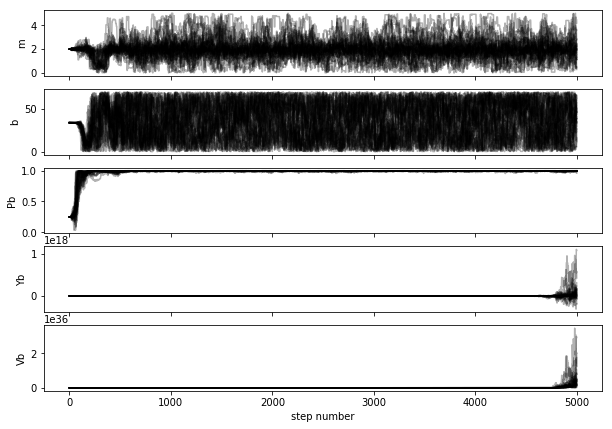

In [140]:
fig, axes = plt.subplots(5, figsize=(10, 7), sharex=True)
samples = sampler.chain
labels = ["m", "b", "Pb", "Yb", "Vb"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i].T, "k", alpha=0.3)
    ax.set_ylabel(labels[i])

axes[-1].set_xlabel("step number");

In [141]:
samples.shape

(32, 5000, 5)

In [142]:
#tau = sampler.get_autocorr_time()
#print(tau)

In [143]:
flat_samples = np.concatenate(sampler.chain)
# sampler.chain[:,1000:,:] Burns cerntain data
print(flat_samples.shape)

(160000, 5)


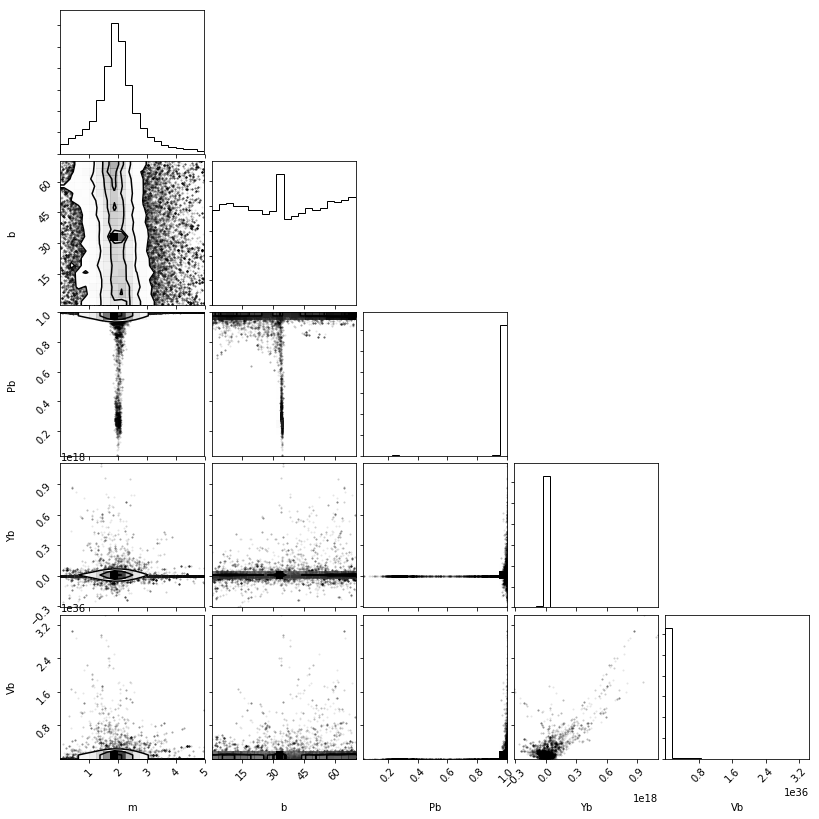

In [144]:
fig = corner.corner(flat_samples, labels=labels);